In [ ]:
!pip install colorama
!pip install rarfile
from google.colab import files
import rarfile
import os
from colorama import init, Fore, Back, Style

import seaborn as sns
import matplotlib.pyplot as plt


import tensorflow as tf
import numpy as np
import sklearn 
import random
import pandas as pd

from sklearn.preprocessing import Normalizer , StandardScaler
from sklearn.preprocessing import LabelEncoder , OneHotEncoder


from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D , Conv1D
from tensorflow.keras.layers import LSTM , TimeDistributed
from tensorflow.keras.layers import AveragePooling2D ,AveragePooling1D, MaxPooling1D , MaxPool2D , Input
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense , Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense,RepeatVector, LSTM, Dropout
from tensorflow.keras.layers import Bidirectional, Dropout
from tensorflow.keras.utils import plot_model
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.metrics import Accuracy , Precision , Recall

from imblearn.over_sampling import SMOTE , ADASYN , RandomOverSampler , SMOTENC , BorderlineSMOTE , SVMSMOTE ,  KMeansSMOTE
from imblearn.combine import SMOTEENN , SMOTETomek


import keras
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
import time
from numpy import expand_dims

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
def Df_Builder(path , show_info=True):
  df = pd.read_csv(path , index_col='Time')
  df = df[40:]
  df.index = pd.to_datetime(df.index)
  if show_info :
    print(df['Label'].value_counts())
    print(df.shape)
  return df





def Df_Separation(df):

  x = df.iloc[: , :-1]
  y = df.iloc[: , -1]

  print(f'shape x : {x.shape}')
  print(f'shape y : {y.shape}')

  return x,y







def Df_Normalization(x,y):


  x_normalized = standardize.fit_transform(x)
  y_encoded = encoder.fit_transform(y)

  return x_normalized,y_encoded








def Df_Reshape(x_normalized ):

  x_series = x_normalized.reshape((x_normalized.shape[0], x_normalized.shape[1] ,1))
  print(f'x = reshaped : {x_series.shape}')


  return x_series







'''---------------------------------------------------------------------'''
def Prepare_Finel_Test(path , start_point , end_point):
  df = Df_Builder(path , show_info = False)
  df = df[df.index >= start_point]
  df = df[df.index <= end_point]
  x = df.iloc[: , :-1]
  y = df.iloc[: , -1]
  # df.drop('Label' , inplace=True , axis=1)

  TEST = standardize.fit_transform(x)
  TEST_y = y

  TEST = TEST.reshape((TEST.shape[0], TEST.shape[1] ,1))
  print(len(TEST_y))
  print((TEST.shape))
  return TEST,TEST_y





def Predict_best_model(predictions , acc , counts ):
  acc_arr = np.array(acc)
  acc_arr = acc_arr.reshape((counts,3))
  acc_df = pd.DataFrame(acc_arr)
  acc_df['subtraction'] = acc_df.iloc[:,0]-acc_df.iloc[:,1]
  minimum = min(acc_df['subtraction'])
  ind = acc_df[acc_df['subtraction'] == minimum]
  best_pred = predictions[int(ind.index.values)]
  print(f'selected model : {int(ind.index.values)}')
  return best_pred






def Model_builder2(dropout_rate=0.3 , input_size=(36,1) , activation_func = 'relu' , LSTM_units = 32 , Dense_units = 32):
  model = Sequential()
  model.add(Conv1D(filters=8, kernel_size=36, activation=activation_func, input_shape=input_size))
  model.add(Dropout(dropout_rate))
  model.add(Conv1D(filters=16, kernel_size=1, activation=activation_func))
  model.add(Dropout(dropout_rate))
  model.add(Flatten())
  model.add(RepeatVector(2))
  model.add(LSTM(LSTM_units, activation=activation_func))
  model.add(Dense(Dense_units, activation=activation_func))
  model.add(Dropout(dropout_rate))
  model.add(Dense(2 , activation='softmax'))
  model.compile(loss='sparse_categorical_crossentropy', 
                optimizer=optimizer, 
                metrics=['acc'])
  # print(model.summary())
  return model








def plot_acc(acc,name,counts):
  plt.style.use('dark_background')
  print("columns in order left to right : train , validation , test accuracies")
  print("rows : steps")
  arr = np.array(acc)
  arr = arr.reshape((counts,3))
  plt.plot(arr[:,0] , color='red' , linewidth=3 , label='Train')
  plt.plot(arr[:,1] , color='blue'  , linewidth=3 , label='Validation')
  plt.plot(arr[:,2] , color='green'  , linewidth=3 , label='Test')
  plt.title(f'Accuracy per steps - {name}')
  plt.xlabel('#steps')
  plt.ylabel('acc')
  plt.legend()
  plt.show()






def Df_Accuracies(acc , name,counts):
  plt.style.use("dark_background")
  arr = np.array(acc)
  arr = arr.reshape((counts,3))
  steps = [i for i in range(counts)]


  result_df = pd.DataFrame({'steps' : steps ,'acc train' : arr[:,0],'acc validation' : arr[:,1],'acc test' : arr[:,2]})

  result_df.index = result_df['steps']
  result_df = result_df.drop(['steps'] , axis=1)


  f , ax = plt.subplots(figsize=(5,counts))

  sns.heatmap(result_df,
              cmap='RdGy' , 
              annot=True ,
              annot_kws={'size' : 15},
              cbar=False)
  plt.title(name , size = 20)
  plt.xticks(size=15 ,rotation=20 )
  plt.yticks(size=15 ,rotation=20 )
  plt.show()







def Plot_model(historyList , folds):
  plt.style.use("dark_background")
  f , ax = plt.subplots(figsize=(8,folds*4) , nrows=folds , ncols =2)

  for history,i in zip(historyList , range(folds)):

      ax[i][0].plot(history.history['acc'])
      ax[i][0].plot(history.history['val_acc'])
      ax[i][0].set_title('model accuracy')
      ax[i][0].set_ylabel('accuracy')
      ax[i][0].set_xlabel('epoch')
      ax[i][0].legend(['train', 'valid'], loc='upper left')
      # summarize history for loss
      ax[i][1].plot(history.history['loss'])
      ax[i][1].plot(history.history['val_loss'])
      ax[i][1].set_title('model loss')
      ax[i][1].set_ylabel('loss')
      ax[i][1].set_xlabel('epoch')
      ax[i][1].legend(['train', 'valid'], loc='upper left')
  plt.show()









def Prepare_Report(acc,counts):
  arr = np.array(acc)
  arr = arr.reshape((counts,3))
  avg_acc =np.mean(arr , axis=0)
  return avg_acc















In [ ]:
upload = files.upload()


date_path = "/content/date.xlsx"




def Build_Labels_DF(index_path , date_path ,prediction):

  path = date_path
  date = pd.read_excel(path)
  date['Date'] = pd.to_datetime(date['Date'] ,format= "%Y%m%d").dt.date


  df = pd.read_csv(index_path)
  df.index = df['Time']
  df = df[df.index >= start_point]
  df = df[df.index <= end_point]

  df['prediction'] = prediction
  df['prediction'][start_point]


  label = list()
  for i in date['Date'] :
    if str(i) not in df['Time']:
      label.append(0)
    else :
      label.append(df['prediction'][str(i)])


  assert (
      pd.value_counts(label)[0] == len(date['Date']) - len(df['Time']) and
      pd.value_counts(label)[1] == pd.value_counts(prediction)[1] and
      pd.value_counts(label)[-1] == pd.value_counts(prediction)[-1]
      ) ,  "there are a problem with labels"

  date['Label'] = label
  date.index = date['Date']
  date.drop('Date' , axis=1 ,inplace=True)
  return date

  

Saving date.xlsx to date.xlsx


In [ ]:




def outputIndexes(model):
  Cnn_outputs = []
  Lstm_outputs = []

  for i in range(len(model.layers)):
    layer = model.layers[i]
    if 'conv' in layer.name :
      Cnn_outputs.append(i)
      # print(i, layer.name, layer.output.shape)

    elif 'lstm' in layer.name :
      Lstm_outputs.append(i)
      # print(i, layer.name, layer.output.shape)

  return Cnn_outputs,Lstm_outputs






def visualizeConvs(model , x , y , output_index):

  model = keras.Model(inputs=model.inputs, outputs=model.layers[output_index].output)
  img = x
  feature_maps = model.predict(img)
  sh = feature_maps.reshape((feature_maps.shape[0],feature_maps.shape[2]))
  sh = sh[:sh.shape[1] , :sh.shape[1]]
  print(sh.shape)
  plt.axis('off')
  plt.imshow(sh)
  plt.show()




def visualizeLstm(model , x , y , output_index):
  print("lstm feature map")
  model = keras.Model(inputs=model.inputs, outputs=model.layers[output_index].output)
  img = x
  feature_maps = model.predict(img)
  plt.plot(feature_maps)
  plt.show()
  print('-----------')




def plotLSTM(model , x , y ):
    _ , outputs = outputIndexes(model)
    for output in outputs :
      visualizeLstm(model , x , y , output)
    plt.show()


def plotCNN(model , x , y ):
    outputs , _ = outputIndexes(model)
    for output in outputs :
      visualizeConvs(model , x , y , output)
    plt.show()

In [ ]:
class SplitTimeSeries():
    def __init__(self, n_splits):
        self.n_splits = n_splits
    
    def split(self, X, y=None, groups=None):
        n_samples = X
        k_fold_size = n_samples // self.n_splits

        indices = np.arange(n_samples)
        margin = 0
        start = indices[0]
        for i in range(self.n_splits):
            i += 1 
            stop = k_fold_size * (i)
            divsion = int(0.9 * (stop))
            yield indices[start], indices[divsion] , indices[stop-1]

In [ ]:
def Training(path,counts = 10,k=3):
  
  acc = list()
  models_list = []
  predictions = []
  name = path.split('/')[-1]
  name = name.split('.')[0]
  print(Fore.WHITE)
  print(f'---------------------------------------------------------------{name}------------------------------------------------------------')

## calling index
  df = Df_Builder(path)

  x_train,y_train = Df_Separation(df)
  TEST_x,TEST_y = Prepare_Finel_Test(path , start_point , end_point)




## loop over main iterations
  for i in range(counts): 
    print(Fore.MAGENTA +  f'\n.................................................................')
    print(Fore.MAGENTA +  f'........................... step {i} starting ...........................')
    print(Fore.MAGENTA +  f'.................................................................\n')
    print(Fore.WHITE)

    Folds_acc_train = list()
    Folds_acc_valid = list()
    Folds_acc_test = list()
    historyList = list()




## loop over k of kfold
    for j,splits in enumerate(SplitTimeSeries(n_splits=k).split(X=x_train.shape[0])) :

## find indices of each kfold
        start , mid , end = splits
        print(Fore.LIGHTYELLOW_EX +   f'\n.................. fold {j} starting ..................')
        print(Fore.WHITE)

## data preparation
        print("fold data indices:" , "start:",start ,"end:",end)
        xTrain =  x_train[start:mid]
        yTrain =  y_train[start:mid]
        xValid =  x_train[mid:end]
        yValid =  y_train[mid:end]


        x_train_normalized,y_train_encoded = Df_Normalization(xTrain,yTrain)
        x_valid_normalized,y_valid_encoded = Df_Normalization(xValid,yValid)

        if i==0 : print(Fore.RED + f'xtrain normalized : \n{x_train_normalized}')
        print(Fore.WHITE)


        x_train_series = Df_Reshape(x_train_normalized)
        x_valid_series = Df_Reshape(x_valid_normalized)

    
## train model
        model = Model_builder2()
        history = model.fit(x_train_series, y_train_encoded, 
                          epochs=epochs , batch_size=batch_size ,
                          validation_data = ( x_valid_series , y_valid_encoded)
                          , verbose = 0 , callbacks=[callback])
        historyList.append(history)
        



## predict test
        predict = model.predict(TEST_x)
        predict = predict.argmax(axis=1)
        predict = np.where(predict==0 , -1 , 1)

### accuracy calculation
        train_loss, train_accuracy = model.evaluate(x_train_series, y_train_encoded , verbose=0)
        valid_loss, valid_accuracy = model.evaluate(x_valid_series, y_valid_encoded  , verbose=0)
        main_test_accuracy = sklearn.metrics.accuracy_score(predict, TEST_y)

        
        print(Fore.WHITE +  f"train iteration:{i} - fold:{j}  ----->  {train_accuracy}")
        print(Fore.WHITE +  f"valid iteration:{i} - fold:{j}  ----->  {valid_accuracy}")
        print(Fore.WHITE +  f"test iteration:{i} - fold:{j}  ----->  {main_test_accuracy}")





## add accuracy to seperated lists
        Folds_acc_train.append(train_accuracy)
        Folds_acc_valid.append(valid_accuracy)
        Folds_acc_test.append(main_test_accuracy)




## visualize cnn output
        plotCNN(model=model , x=x_train_normalized , y=y_train_encoded)
        plotLSTM(model=model , x=x_train_normalized , y=y_train_encoded)


## hold predicted labels of last kfold
        if j==k-1 :
          predictions.append(list(predict))


## plot model training
    Plot_model(historyList=historyList , folds=k)



## average of accuracies over k 
    avg_Fold_acc_train = sum(Folds_acc_train)/len(Folds_acc_train)
    avg_Fold_acc_test = sum(Folds_acc_test)/len(Folds_acc_test)
    avg_Folds_acc_valid = sum(Folds_acc_valid)/len(Folds_acc_valid)


## saving all averaged acciracies
    acc.append(avg_Fold_acc_train)
    acc.append(avg_Fold_acc_test)
    acc.append(avg_Folds_acc_valid)
    print("\n\n\n")






## plot line plot of accuracies trend
  plot_acc(acc,name , counts)
  plt.show()
  # time.sleep(5)

## average of whole accueacies over main iterations(counts)
  print(Fore.WHITE + f"---------- Report ---------- \n")
  mean_train_acc , mean_validation_acc , mean_test_acc = Prepare_Report(acc , counts)
  print(Fore.WHITE + f'mean train accueacies over {counts} model training ------ >> {mean_train_acc}')
  print(Fore.WHITE + f'mean validation accuracies over {counts} model training ------ >> {mean_validation_acc}')
  print(Fore.WHITE + f'mean test accuracies over {counts} model training ------ >> {mean_test_acc}')

## plot table of accuracies in detail
  Df_Accuracies(acc , name , counts)


## find best model and return labels of test data of this model
## based on mean of kfolds over n iteration best model will be chosen (its label prdictions are based on last fold)
  best_pred = Predict_best_model(predictions ,acc , counts)




## retrun best predicted labels
  return best_pred , TEST_y

In [ ]:
upload = files.upload()

epochs = 100
batch_size = 128
counts = 10
initial_learning_rate = 0.1
decay_rate = 0.9
patience = 15
start_point = "2019-03-25"
end_point = "2022-03-19"


standardize = StandardScaler()
encoder = LabelEncoder()
callback = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=patience)
lr_schedule = ExponentialDecay(initial_learning_rate,decay_steps=100000,decay_rate=decay_rate,staircase=True)
optimizer = SGD(learning_rate=lr_schedule) 



zip_path = '/content/indicators_9rar.rar'
unzip_path = '/content/test'


with rarfile.RarFile(zip_path , 'r') as unrar :
  unrar.extractall(unzip_path)


files = os.listdir(path=unzip_path)
file_paths = [os.path.join(unzip_path , f_name) for f_name in files]
file_paths

Saving indicators_9rar.rar to indicators_9rar.rar


['/content/test/فملی.csv',
 '/content/test/سفارس.csv',
 '/content/test/شبهرن.csv',
 '/content/test/خودرو.csv',
 '/content/test/کچاد.csv',
 '/content/test/فلوله.csv',
 '/content/test/خساپا.csv',
 '/content/test/وبملت.csv',
 '/content/test/کروی.csv',
 '/content/test/پارسیان.csv']

In [ ]:
model = Model_builder2()
model.summary()
model.layers

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 1, 8)              296       
                                                                 
 dropout (Dropout)           (None, 1, 8)              0         
                                                                 
 conv1d_1 (Conv1D)           (None, 1, 16)             144       
                                                                 
 dropout_1 (Dropout)         (None, 1, 16)             0         
                                                                 
 flatten (Flatten)           (None, 16)                0         
                                                                 
 repeat_vector (RepeatVector  (None, 2, 16)            0         
 )                                                               
                                                        

### Initialization

In [ ]:
file_paths

['/content/test/فملی.csv',
 '/content/test/سفارس.csv',
 '/content/test/شبهرن.csv',
 '/content/test/خودرو.csv',
 '/content/test/کچاد.csv',
 '/content/test/فلوله.csv',
 '/content/test/خساپا.csv',
 '/content/test/وبملت.csv',
 '/content/test/کروی.csv',
 '/content/test/پارسیان.csv']


---------------------------------------------------------------شبهرن------------------------------------------------------------
-1    1225
 1    1117
Name: Label, dtype: int64
(2342, 37)
shape x : (2342, 36)
shape y : (2342,)
660
(660, 36, 1)

.................................................................
........................... step 0 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 779
xtrain normalized : 
[[-0.91788269 -0.6861917  -0.09769468 ... -0.92306859 -0.915436
  -0.19173656]
 [-0.92376043 -0.75760022 -0.15903128 ... -0.92620067 -0.92214173
  -0.43590484]
 [-0.92376043 -0.64921705 -0.20522028 ... -0.92818024 -0.92308343
  -0.47164218]
 ...
 [ 1.24360016  0.01599059 -1.13476707 ...  1.18829648  1.23074592
  -0.01098003]
 [ 1.24950641 -0.18496026 -0.87534857 ...  1.17374615  1.2415159
   0.05347075]
 [ 1.28494391  0.02877699 -

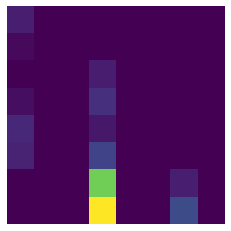

(16, 16)


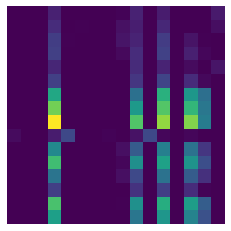

lstm feature map


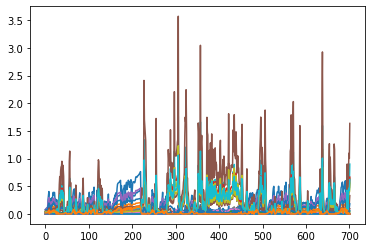

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1559
xtrain normalized : 
[[-1.49185221 -0.74121391 -0.07333266 ... -1.49983097 -1.49053312
  -0.12557228]
 [-1.49693375 -0.81975007 -0.12610538 ... -1.50256623 -1.49634086
  -0.41799893]
 [-1.49693375 -0.70054863 -0.16584542 ... -1.504295   -1.49715646
  -0.46079954]
 ...
 [ 1.91654742 -0.4486968  -2.54271772 ...  2.22461654  1.9149103
  -1.24704653]
 [ 2.14787105  0.37932713 -1.7813159  ...  2.20067719  2.08406148
  -0.03448859]
 [ 2.15123821  0.25801477 -1.22248228 ...  2.1833526   2.1648769
   0.01924079]]

x = reshaped : (1404, 36, 1)
x = reshaped : (155, 36, 1)
Epoch 91: early stopping
train iteration:0 - fold:1  ----->  0.8646723628044128
valid iteration:0 - fold:1  ----->  0.7870967984199524
test iteration:0 - fold:1  ----->  0.7439393939393939
(8, 8)


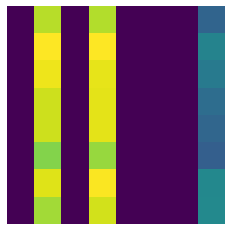

(16, 16)


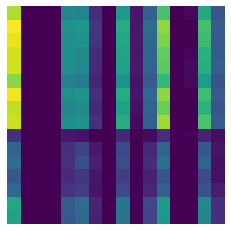

lstm feature map


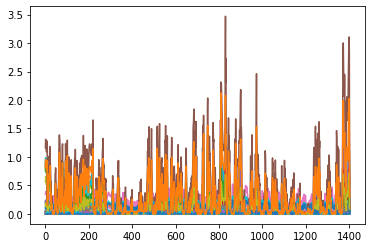

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2339
xtrain normalized : 
[[-0.60650932 -0.62112328 -0.09932375 ... -0.59104307 -0.60589725
  -0.16012881]
 [-0.60695538 -0.64755884 -0.10278596 ... -0.59126619 -0.60640644
  -0.40088778]
 [-0.60695538 -0.60743519 -0.10539315 ... -0.59140722 -0.60647795
  -0.43612612]
 ...
 [ 2.11453306  4.99913518 -0.92808064 ...  2.25654334  2.11098474
  -1.352637  ]
 [ 2.03794404  4.11497261 -1.24366091 ...  2.25341922  2.07621216
  -1.64170307]
 [ 1.97063853  0.96500995 -1.58507332 ...  2.25901459  1.98889433
  -1.87780016]]

x = reshaped : (2106, 36, 1)
x = reshaped : (233, 36, 1)
Epoch 42: early stopping
train iteration:0 - fold:2  ----->  0.7877492904663086
valid iteration:0 - fold:2  ----->  0.7639485001564026
test iteration:0 - fold:2  ----->  0.7636363636363637
(8, 8)


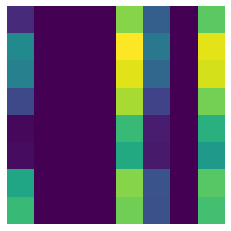

(16, 16)


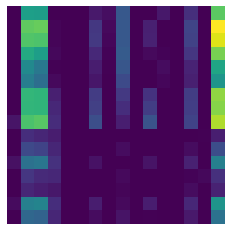

lstm feature map


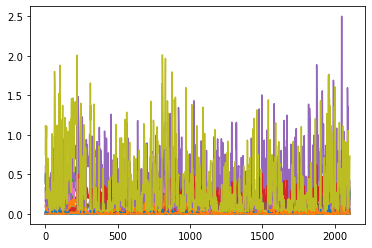

-----------


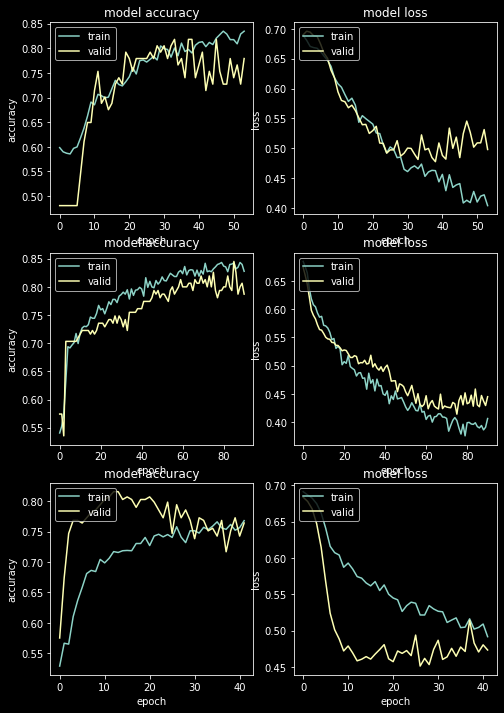






.................................................................
........................... step 1 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 779

x = reshaped : (702, 36, 1)
x = reshaped : (77, 36, 1)
Epoch 73: early stopping
train iteration:1 - fold:0  ----->  0.8433048725128174
valid iteration:1 - fold:0  ----->  0.7142857313156128
test iteration:1 - fold:0  ----->  0.7181818181818181
(8, 8)


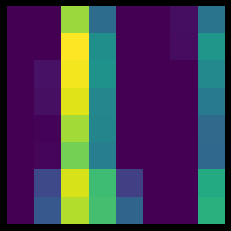

(16, 16)


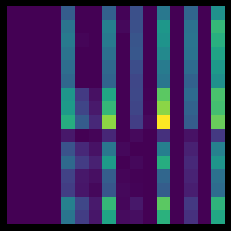

lstm feature map


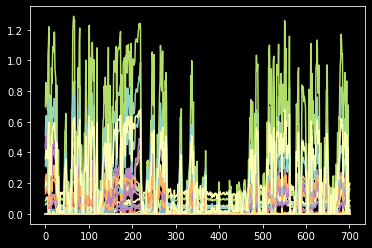

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1559

x = reshaped : (1404, 36, 1)
x = reshaped : (155, 36, 1)
Epoch 70: early stopping
train iteration:1 - fold:1  ----->  0.867521345615387
valid iteration:1 - fold:1  ----->  0.8258064389228821
test iteration:1 - fold:1  ----->  0.7151515151515152
(8, 8)


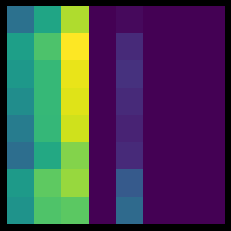

(16, 16)


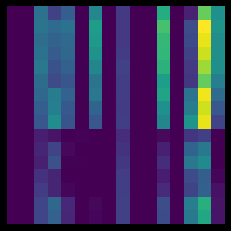

lstm feature map


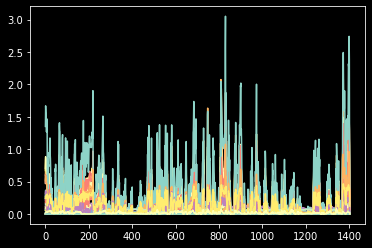

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2339

x = reshaped : (2106, 36, 1)
x = reshaped : (233, 36, 1)
Epoch 51: early stopping
train iteration:1 - fold:2  ----->  0.7801519632339478
valid iteration:1 - fold:2  ----->  0.7682403326034546
test iteration:1 - fold:2  ----->  0.7712121212121212
(8, 8)


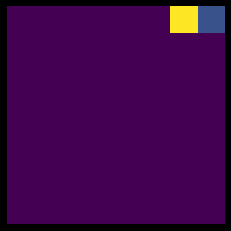

(16, 16)


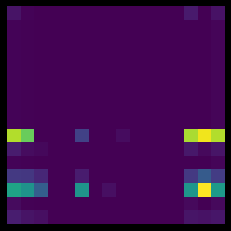

lstm feature map


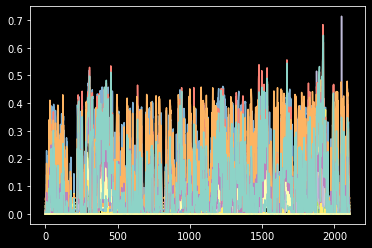

-----------


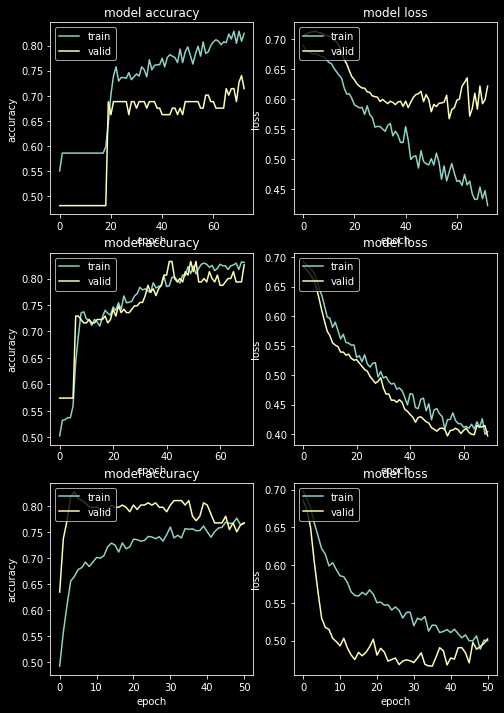






.................................................................
........................... step 2 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 779

x = reshaped : (702, 36, 1)
x = reshaped : (77, 36, 1)
Epoch 78: early stopping
train iteration:2 - fold:0  ----->  0.8860399127006531
valid iteration:2 - fold:0  ----->  0.7662337422370911
test iteration:2 - fold:0  ----->  0.7378787878787879
(8, 8)


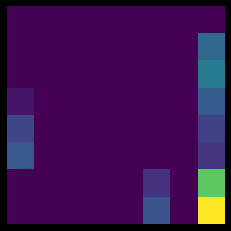

(16, 16)


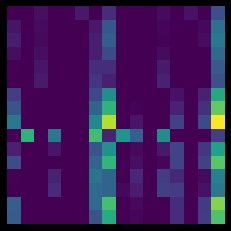

lstm feature map


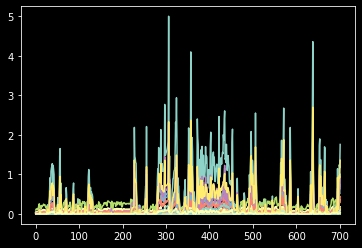

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1559

x = reshaped : (1404, 36, 1)
x = reshaped : (155, 36, 1)
Epoch 35: early stopping
train iteration:2 - fold:1  ----->  0.8240740895271301
valid iteration:2 - fold:1  ----->  0.7806451320648193
test iteration:2 - fold:1  ----->  0.7484848484848485
(8, 8)


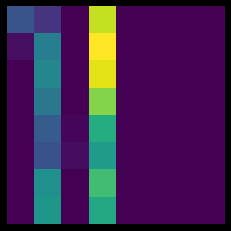

(16, 16)


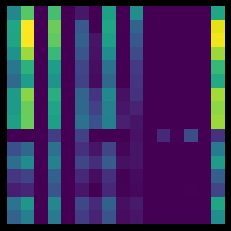

lstm feature map


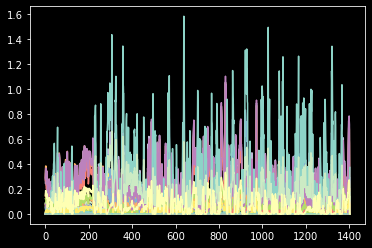

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2339

x = reshaped : (2106, 36, 1)
x = reshaped : (233, 36, 1)
Epoch 52: early stopping
train iteration:2 - fold:2  ----->  0.7920227646827698
valid iteration:2 - fold:2  ----->  0.7596566677093506
test iteration:2 - fold:2  ----->  0.7893939393939394
(8, 8)


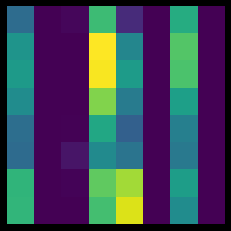

(16, 16)


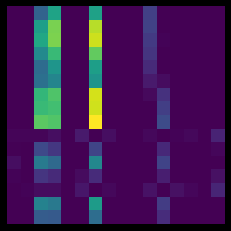

lstm feature map


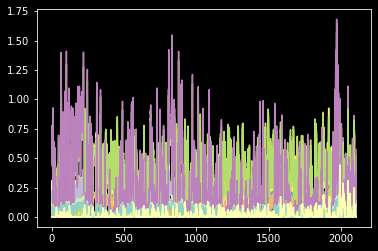

-----------


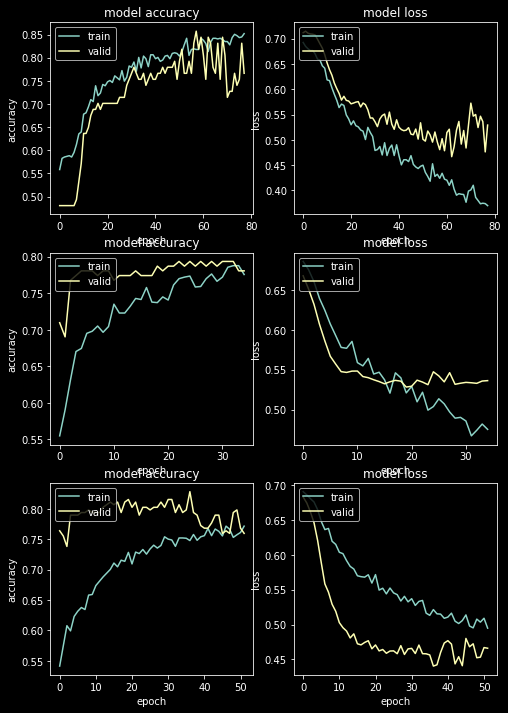






.................................................................
........................... step 3 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 779

x = reshaped : (702, 36, 1)
x = reshaped : (77, 36, 1)
Epoch 61: early stopping
train iteration:3 - fold:0  ----->  0.8660968542098999
valid iteration:3 - fold:0  ----->  0.701298713684082
test iteration:3 - fold:0  ----->  0.7045454545454546
(8, 8)


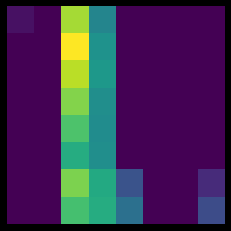

(16, 16)


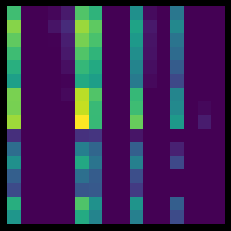

lstm feature map


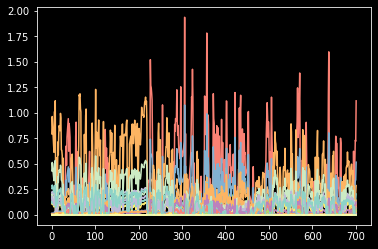

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1559

x = reshaped : (1404, 36, 1)
x = reshaped : (155, 36, 1)
Epoch 72: early stopping
train iteration:3 - fold:1  ----->  0.8589743375778198
valid iteration:3 - fold:1  ----->  0.7677419185638428
test iteration:3 - fold:1  ----->  0.7181818181818181
(8, 8)


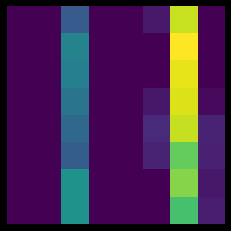

(16, 16)


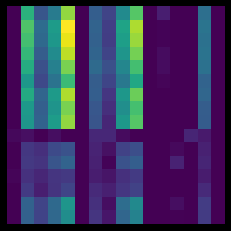

lstm feature map


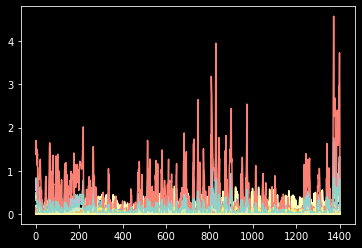

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2339

x = reshaped : (2106, 36, 1)
x = reshaped : (233, 36, 1)
Epoch 49: early stopping
train iteration:3 - fold:2  ----->  0.790123462677002
valid iteration:3 - fold:2  ----->  0.7510729432106018
test iteration:3 - fold:2  ----->  0.7787878787878788
(8, 8)


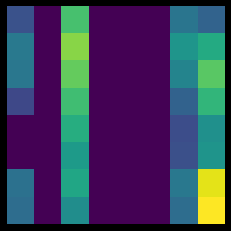

(16, 16)


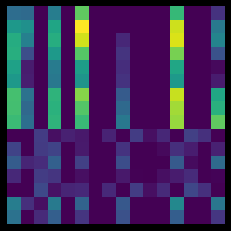

lstm feature map


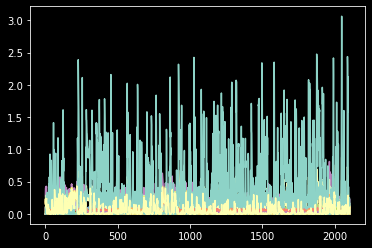

-----------


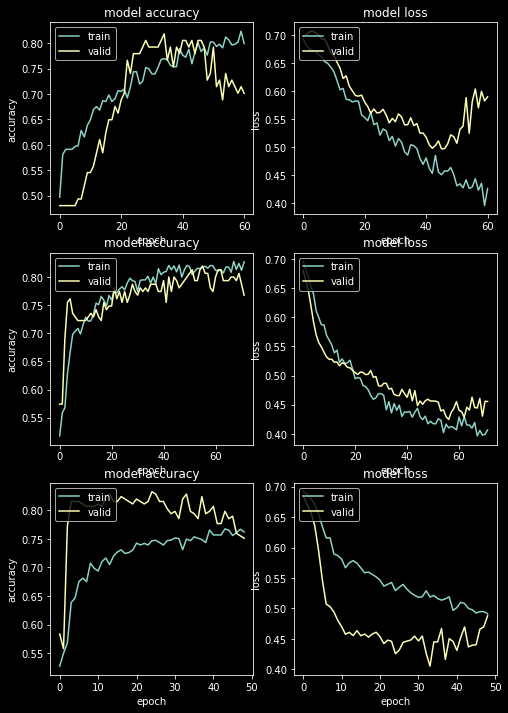






.................................................................
........................... step 4 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 779

x = reshaped : (702, 36, 1)
x = reshaped : (77, 36, 1)
Epoch 87: early stopping
train iteration:4 - fold:0  ----->  0.8760683536529541
valid iteration:4 - fold:0  ----->  0.7662337422370911
test iteration:4 - fold:0  ----->  0.7227272727272728
(8, 8)


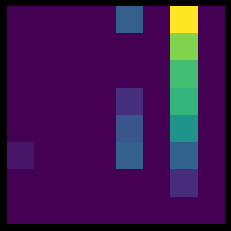

(16, 16)


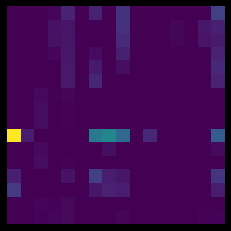

lstm feature map


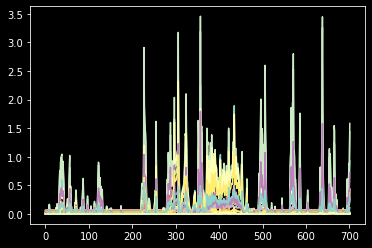

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1559

x = reshaped : (1404, 36, 1)
x = reshaped : (155, 36, 1)
train iteration:4 - fold:1  ----->  0.874643862247467
valid iteration:4 - fold:1  ----->  0.8064516186714172
test iteration:4 - fold:1  ----->  0.7363636363636363
(8, 8)


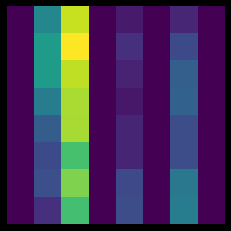

(16, 16)


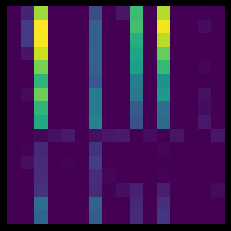

lstm feature map


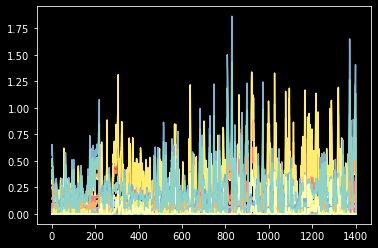

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2339

x = reshaped : (2106, 36, 1)
x = reshaped : (233, 36, 1)
Epoch 38: early stopping
train iteration:4 - fold:2  ----->  0.7825261354446411
valid iteration:4 - fold:2  ----->  0.7510729432106018
test iteration:4 - fold:2  ----->  0.7439393939393939
(8, 8)


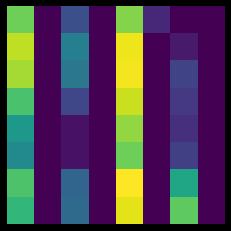

(16, 16)


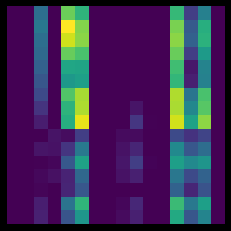

lstm feature map


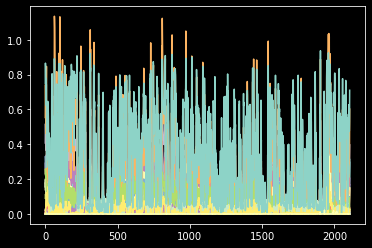

-----------


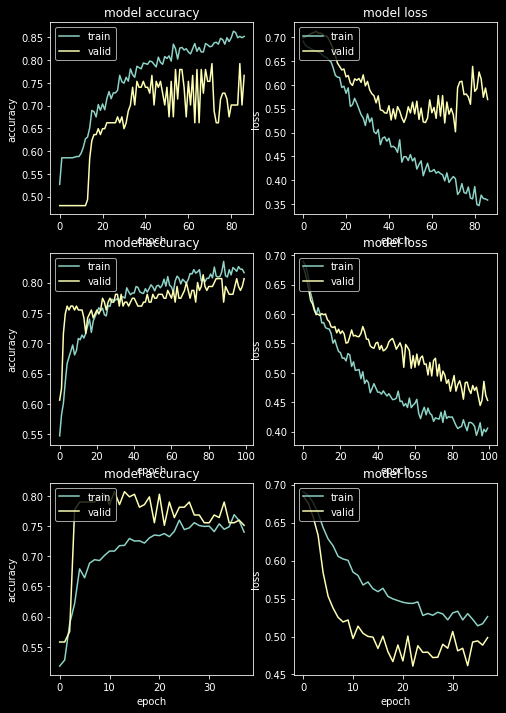






.................................................................
........................... step 5 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 779

x = reshaped : (702, 36, 1)
x = reshaped : (77, 36, 1)
Epoch 47: early stopping
train iteration:5 - fold:0  ----->  0.8319088220596313
valid iteration:5 - fold:0  ----->  0.7792207598686218
test iteration:5 - fold:0  ----->  0.7272727272727273
(8, 8)


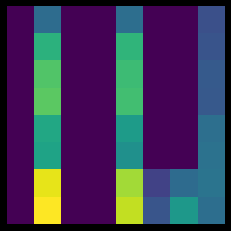

(16, 16)


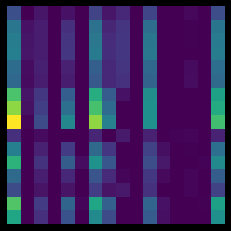

lstm feature map


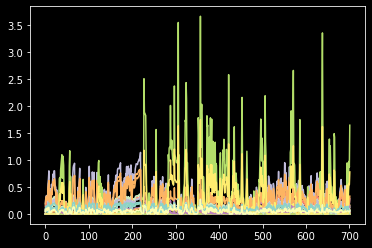

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1559

x = reshaped : (1404, 36, 1)
x = reshaped : (155, 36, 1)
Epoch 95: early stopping
train iteration:5 - fold:1  ----->  0.8625355958938599
valid iteration:5 - fold:1  ----->  0.7548387050628662
test iteration:5 - fold:1  ----->  0.7515151515151515
(8, 8)


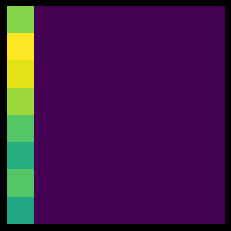

(16, 16)


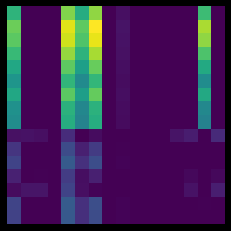

lstm feature map


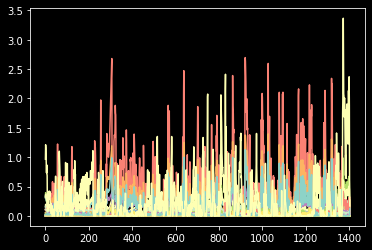

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2339

x = reshaped : (2106, 36, 1)
x = reshaped : (233, 36, 1)
Epoch 38: early stopping
train iteration:5 - fold:2  ----->  0.7792022824287415
valid iteration:5 - fold:2  ----->  0.7381974458694458
test iteration:5 - fold:2  ----->  0.7484848484848485
(8, 8)


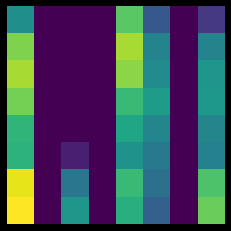

(16, 16)


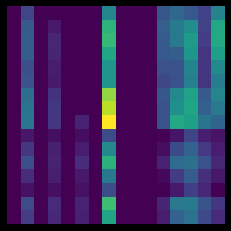

lstm feature map


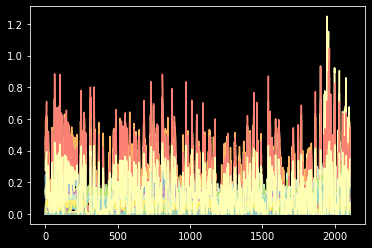

-----------


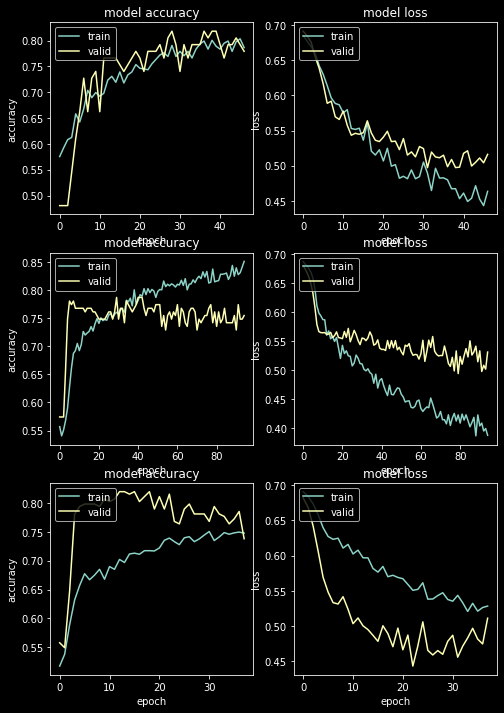





columns in order left to right : train , validation , test accuracies
rows : steps


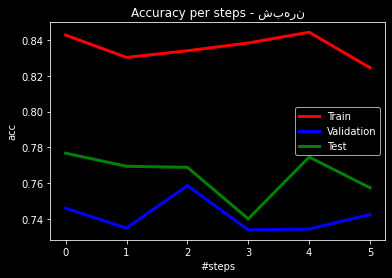

---------- Report ---------- 

mean train accueacies over 6 model training ------ >> 0.835760258966022
mean validation accuracies over 6 model training ------ >> 0.7416666666666667
mean test accuracies over 6 model training ------ >> 0.7645146052042643


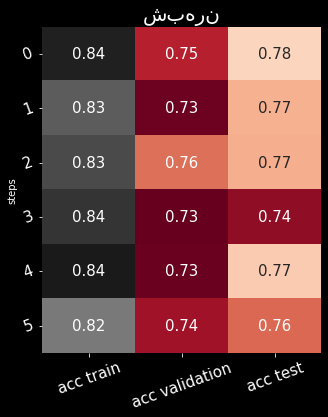

selected model : 2


In [ ]:
predictionsshebhern , TestYshebhern  = Training(file_paths[2] , counts=6 , k=3)
shebhern = Build_Labels_DF(file_paths[2] , date_path ,predictionsshebhern)



---------------------------------------------------------------کچاد------------------------------------------------------------
-1    1247
 1    1098
Name: Label, dtype: int64
(2345, 37)
shape x : (2345, 36)
shape y : (2345,)
688
(688, 36, 1)

.................................................................
........................... step 0 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 780
xtrain normalized : 
[[-1.29597855  0.06988776 -0.08399076 ... -1.30104059 -1.29213983
   0.24428826]
 [-1.29013236 -0.38963357 -0.07457767 ... -1.29993728 -1.28774441
   0.36278394]
 [-1.29612846 -0.30371386 -0.08473419 ... -1.29851318 -1.29268925
   0.21490394]
 ...
 [ 0.16090312 -0.46460634 -1.42181583 ...  0.34885719  0.16998216
  -1.49613331]
 [ 0.16090312 -0.37524492 -1.46347996 ...  0.33892318  0.14437704
  -1.35245977]
 [ 0.11887834 -0.59608112

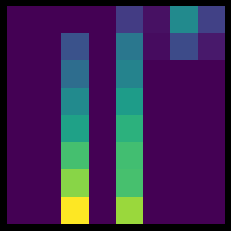

(16, 16)


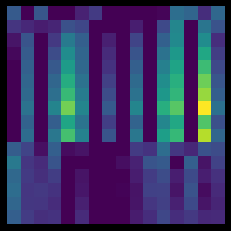

lstm feature map


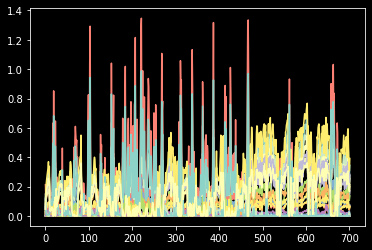

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1561
xtrain normalized : 
[[-1.65931727 -0.20394817 -0.01293935 ... -1.66575775 -1.65605174
   0.34651445]
 [-1.65139257 -0.38802188 -0.00192296 ... -1.66425829 -1.65009245
   0.47326228]
 [-1.65952047 -0.35360441 -0.0138094  ... -1.66232286 -1.65679665
   0.31508378]
 ...
 [ 0.92004691  0.48879668 -0.19217338 ...  0.83485281  0.93213461
  -0.34419167]
 [ 0.90340225  0.05771479 -0.26368055 ...  0.83623044  0.91919131
  -0.42150322]
 [ 0.86456473  0.00476653 -0.38156749 ...  0.84136326  0.88405948
  -0.62102273]]

x = reshaped : (1405, 36, 1)
x = reshaped : (156, 36, 1)
Epoch 16: early stopping
train iteration:0 - fold:1  ----->  0.8014234900474548
valid iteration:0 - fold:1  ----->  0.5128205418586731
test iteration:0 - fold:1  ----->  0.6511627906976745
(8, 8)


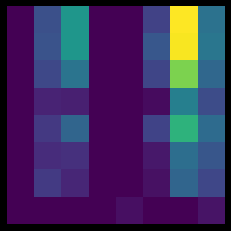

(16, 16)


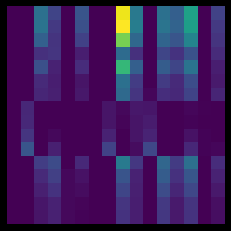

lstm feature map


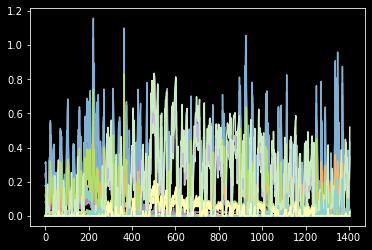

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2342
xtrain normalized : 
[[-0.53124273 -0.46741966 -0.14351939 ... -0.52230963 -0.53093244
   0.12377902]
 [-0.53084419 -0.55174712 -0.14281159 ... -0.52223734 -0.53063298
   0.21615016]
 [-0.53125295 -0.53597987 -0.14357529 ... -0.52214404 -0.53096987
   0.10087301]
 ...
 [ 3.71239112  0.76143546  3.90169714 ...  3.43975183  3.76764911
   1.75689729]
 [ 3.75572414 -0.07834728  3.97325294 ...  3.51173593  3.77546537
   1.63954402]
 [ 3.68711353  0.02198513  3.73066451 ...  3.55596303  3.73518158
   1.12442885]]

x = reshaped : (2108, 36, 1)
x = reshaped : (234, 36, 1)
Epoch 33: early stopping
train iteration:0 - fold:2  ----->  0.8211575150489807
valid iteration:0 - fold:2  ----->  0.7393162250518799
test iteration:0 - fold:2  ----->  0.7311046511627907
(8, 8)


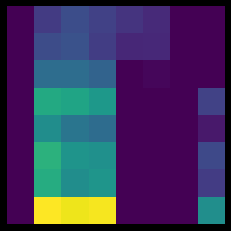

(16, 16)


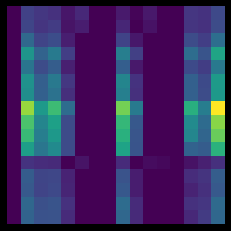

lstm feature map


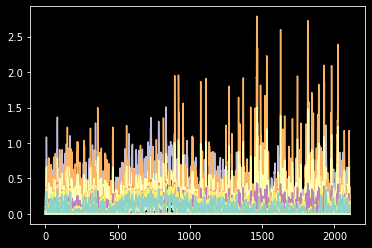

-----------


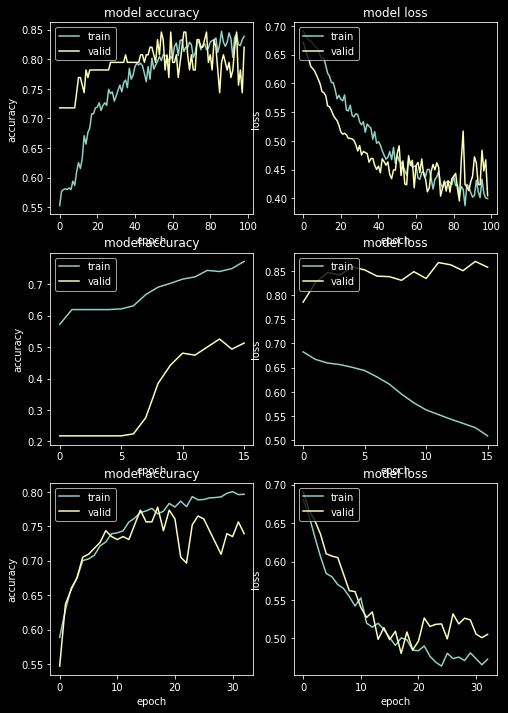






.................................................................
........................... step 1 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 780

x = reshaped : (702, 36, 1)
x = reshaped : (78, 36, 1)
Epoch 76: early stopping
train iteration:1 - fold:0  ----->  0.8376068472862244
valid iteration:1 - fold:0  ----->  0.7948718070983887
test iteration:1 - fold:0  ----->  0.684593023255814
(8, 8)


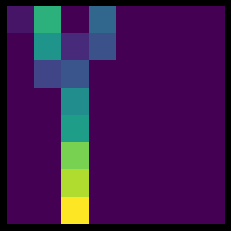

(16, 16)


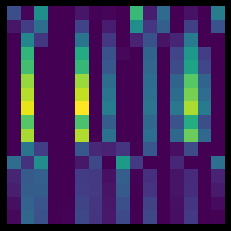

lstm feature map


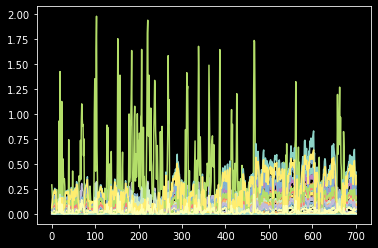

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1561

x = reshaped : (1405, 36, 1)
x = reshaped : (156, 36, 1)
Epoch 16: early stopping
train iteration:1 - fold:1  ----->  0.7743772268295288
valid iteration:1 - fold:1  ----->  0.5705128312110901
test iteration:1 - fold:1  ----->  0.6598837209302325
(8, 8)


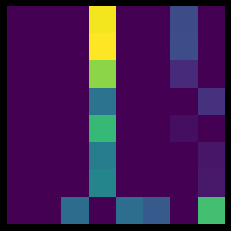

(16, 16)


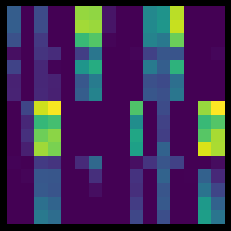

lstm feature map


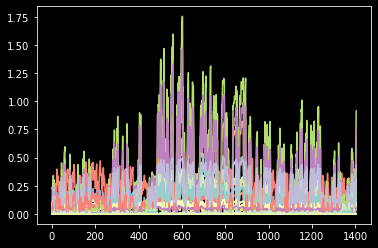

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2342

x = reshaped : (2108, 36, 1)
x = reshaped : (234, 36, 1)
Epoch 60: early stopping
train iteration:1 - fold:2  ----->  0.8225806355476379
valid iteration:1 - fold:2  ----->  0.7735042572021484
test iteration:1 - fold:2  ----->  0.7558139534883721
(8, 8)


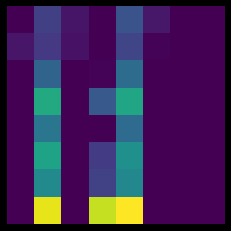

(16, 16)


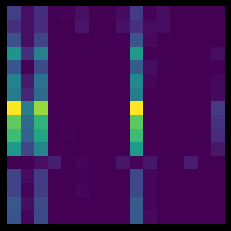

lstm feature map


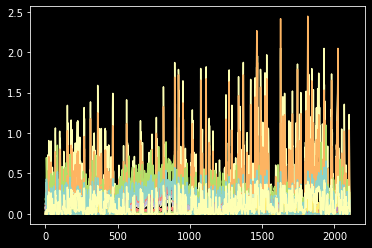

-----------


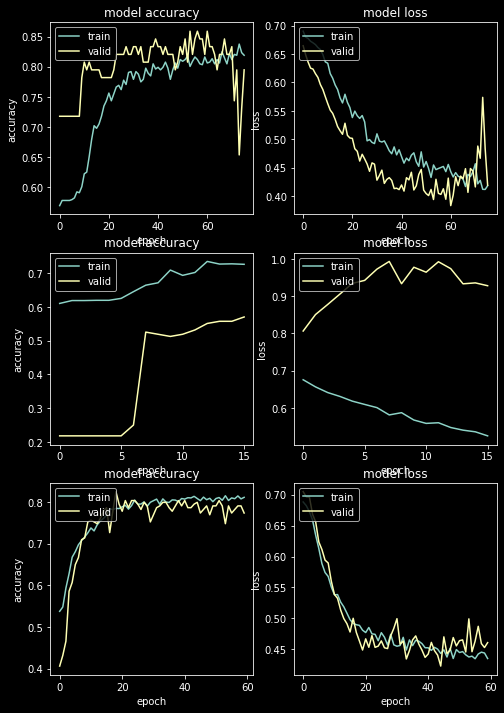






.................................................................
........................... step 2 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 780

x = reshaped : (702, 36, 1)
x = reshaped : (78, 36, 1)
Epoch 69: early stopping
train iteration:2 - fold:0  ----->  0.8646723628044128
valid iteration:2 - fold:0  ----->  0.8333333134651184
test iteration:2 - fold:0  ----->  0.7209302325581395
(8, 8)


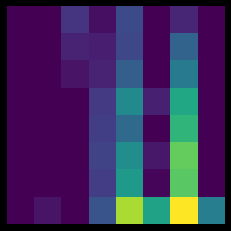

(16, 16)


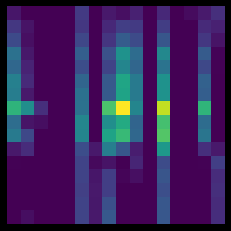

lstm feature map


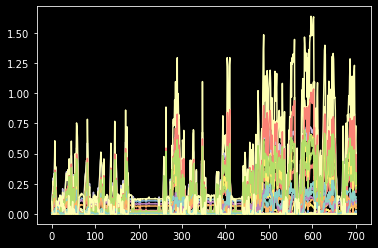

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1561

x = reshaped : (1405, 36, 1)
x = reshaped : (156, 36, 1)
Epoch 16: early stopping
train iteration:2 - fold:1  ----->  0.8206405639648438
valid iteration:2 - fold:1  ----->  0.5128205418586731
test iteration:2 - fold:1  ----->  0.6613372093023255
(8, 8)


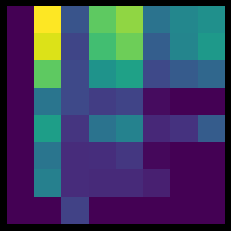

(16, 16)


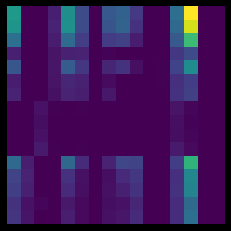

lstm feature map


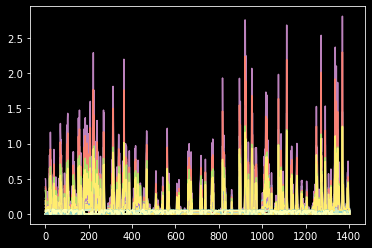

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2342

x = reshaped : (2108, 36, 1)
x = reshaped : (234, 36, 1)
Epoch 41: early stopping
train iteration:2 - fold:2  ----->  0.8116698265075684
valid iteration:2 - fold:2  ----->  0.7136752009391785
test iteration:2 - fold:2  ----->  0.7151162790697675
(8, 8)


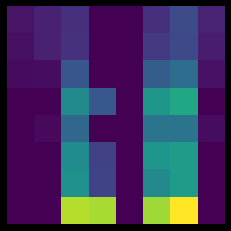

(16, 16)


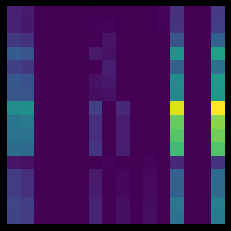

lstm feature map


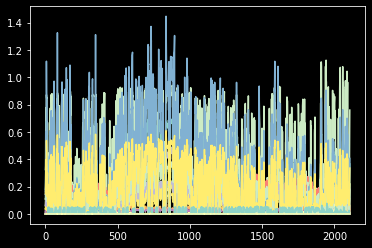

-----------


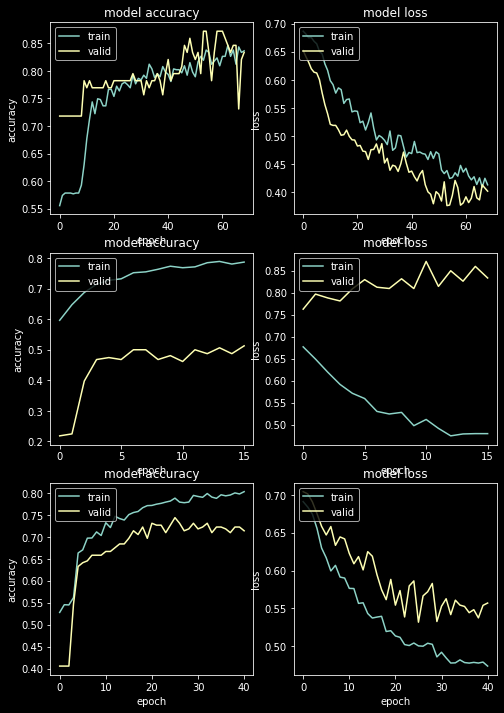






.................................................................
........................... step 3 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 780

x = reshaped : (702, 36, 1)
x = reshaped : (78, 36, 1)
Epoch 55: early stopping
train iteration:3 - fold:0  ----->  0.8290598392486572
valid iteration:3 - fold:0  ----->  0.7948718070983887
test iteration:3 - fold:0  ----->  0.7020348837209303
(8, 8)


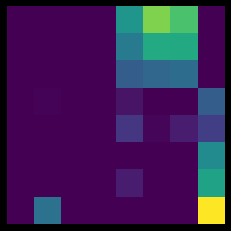

(16, 16)


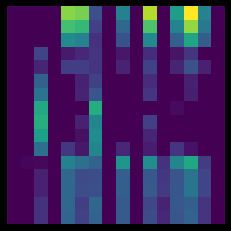

lstm feature map


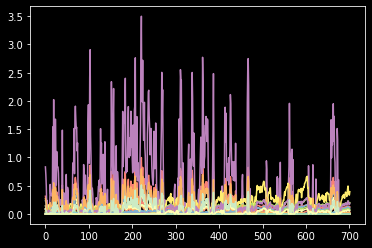

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1561

x = reshaped : (1405, 36, 1)
x = reshaped : (156, 36, 1)
Epoch 16: early stopping
train iteration:3 - fold:1  ----->  0.7964412569999695
valid iteration:3 - fold:1  ----->  0.5064102411270142
test iteration:3 - fold:1  ----->  0.6468023255813954
(8, 8)


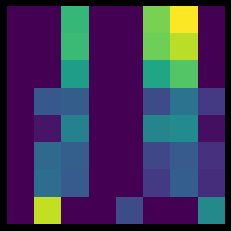

(16, 16)


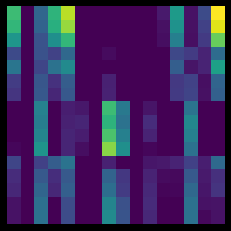

lstm feature map


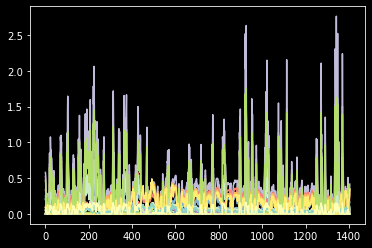

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2342

x = reshaped : (2108, 36, 1)
x = reshaped : (234, 36, 1)
Epoch 32: early stopping
train iteration:3 - fold:2  ----->  0.8145161271095276
valid iteration:3 - fold:2  ----->  0.7649572491645813
test iteration:3 - fold:2  ----->  0.7427325581395349
(8, 8)


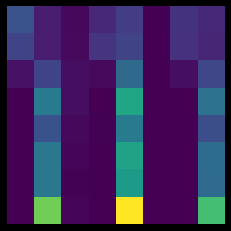

(16, 16)


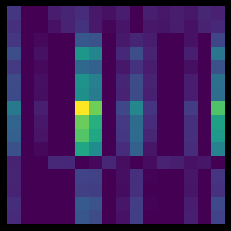

lstm feature map


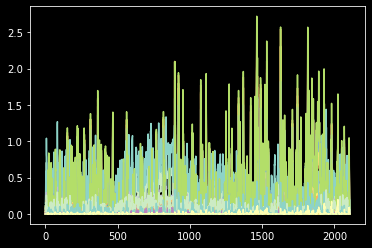

-----------


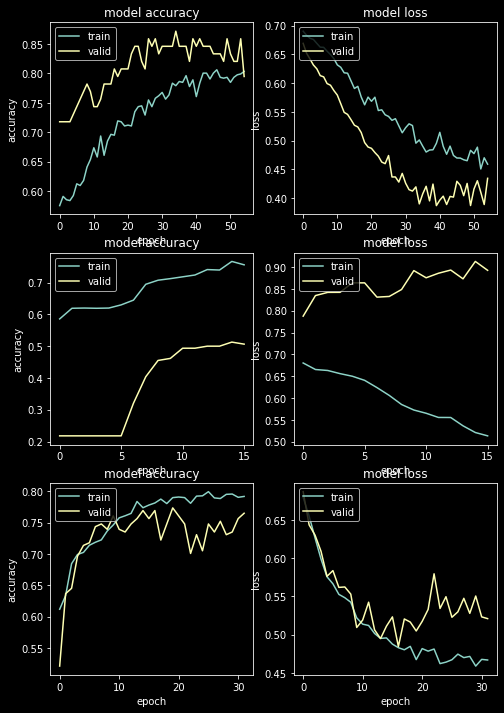






.................................................................
........................... step 4 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 780

x = reshaped : (702, 36, 1)
x = reshaped : (78, 36, 1)
Epoch 45: early stopping
train iteration:4 - fold:0  ----->  0.8276353478431702
valid iteration:4 - fold:0  ----->  0.8205128312110901
test iteration:4 - fold:0  ----->  0.6947674418604651
(8, 8)


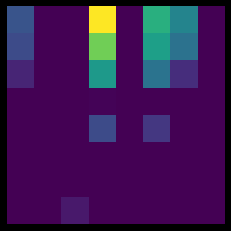

(16, 16)


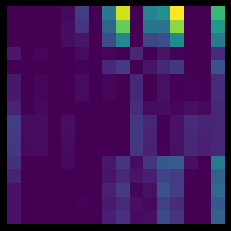

lstm feature map


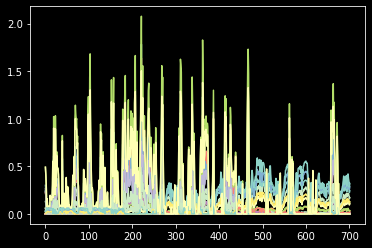

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1561

x = reshaped : (1405, 36, 1)
x = reshaped : (156, 36, 1)
Epoch 16: early stopping
train iteration:4 - fold:1  ----->  0.8021352291107178
valid iteration:4 - fold:1  ----->  0.49358972907066345
test iteration:4 - fold:1  ----->  0.6569767441860465
(8, 8)


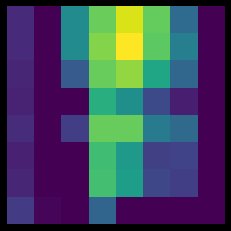

(16, 16)


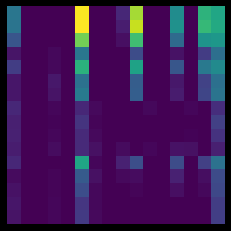

lstm feature map


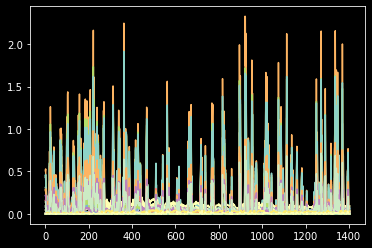

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2342

x = reshaped : (2108, 36, 1)
x = reshaped : (234, 36, 1)
Epoch 56: early stopping
train iteration:4 - fold:2  ----->  0.8206831216812134
valid iteration:4 - fold:2  ----->  0.7991452813148499
test iteration:4 - fold:2  ----->  0.7107558139534884
(8, 8)


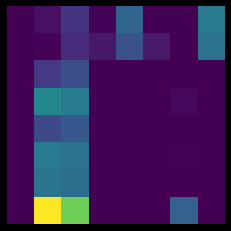

(16, 16)


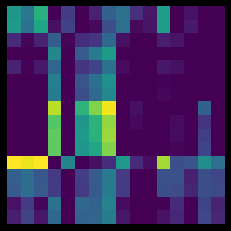

lstm feature map


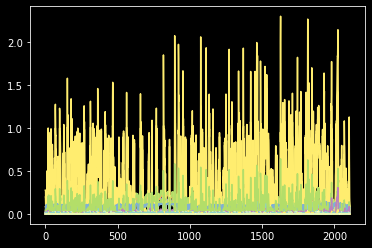

-----------


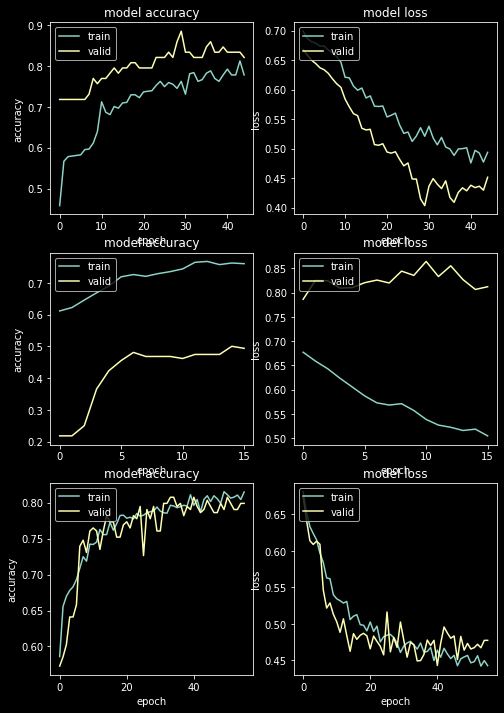






.................................................................
........................... step 5 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 780

x = reshaped : (702, 36, 1)
x = reshaped : (78, 36, 1)
Epoch 68: early stopping
train iteration:5 - fold:0  ----->  0.8447293639183044
valid iteration:5 - fold:0  ----->  0.8333333134651184
test iteration:5 - fold:0  ----->  0.7194767441860465
(8, 8)


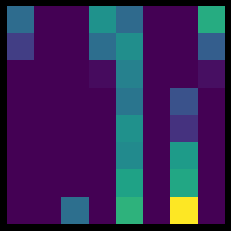

(16, 16)


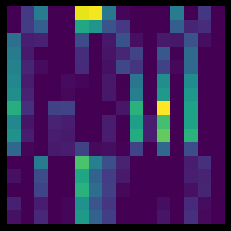

lstm feature map


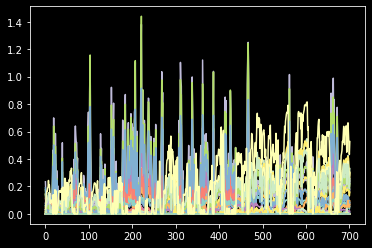

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1561

x = reshaped : (1405, 36, 1)
x = reshaped : (156, 36, 1)
Epoch 16: early stopping
train iteration:5 - fold:1  ----->  0.8078292012214661
valid iteration:5 - fold:1  ----->  0.49358972907066345
test iteration:5 - fold:1  ----->  0.6351744186046512
(8, 8)


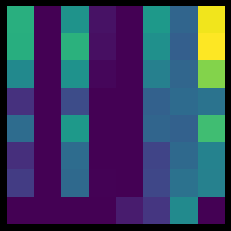

(16, 16)


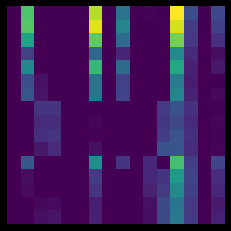

lstm feature map


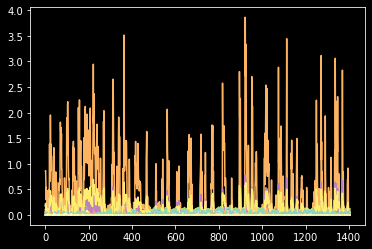

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2342

x = reshaped : (2108, 36, 1)
x = reshaped : (234, 36, 1)
Epoch 63: early stopping
train iteration:5 - fold:2  ----->  0.8254269361495972
valid iteration:5 - fold:2  ----->  0.752136766910553
test iteration:5 - fold:2  ----->  0.7427325581395349
(8, 8)


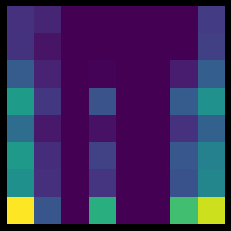

(16, 16)


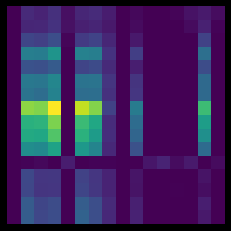

lstm feature map


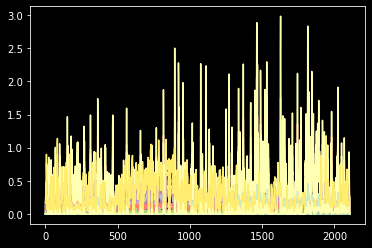

-----------


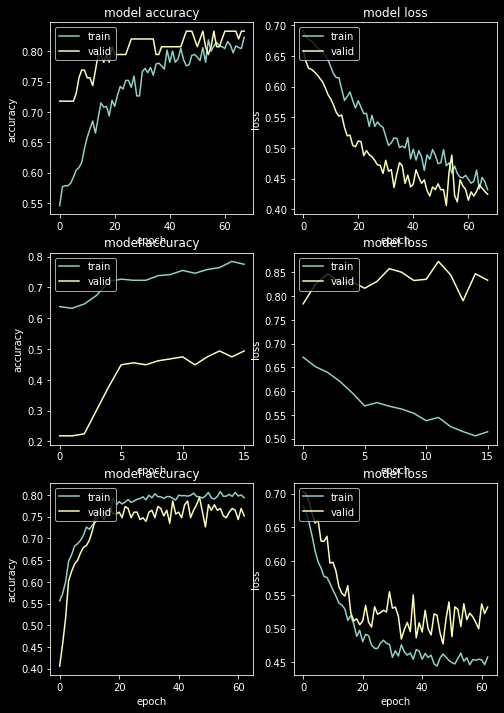





columns in order left to right : train , validation , test accuracies
rows : steps


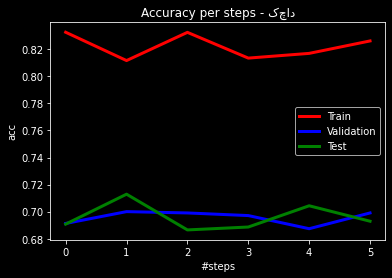

---------- Report ---------- 

mean train accueacies over 6 model training ------ >> 0.8220682640870413
mean validation accuracies over 6 model training ------ >> 0.695736434108527
mean test accuracies over 6 model training ------ >> 0.6961063610182867


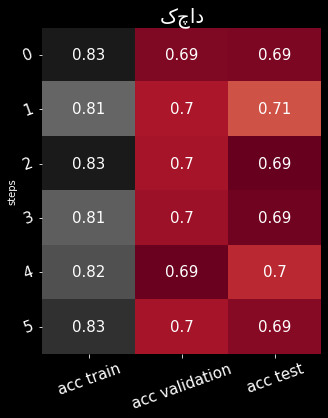

selected model : 1


In [ ]:
predictionskachad  , TestYkachad = Training(file_paths[4] , counts=6 , k=3)
kachad = Build_Labels_DF(file_paths[4] , date_path ,predictionskachad)


---------------------------------------------------------------فملی------------------------------------------------------------
-1    1248
 1    1153
Name: Label, dtype: int64
(2401, 37)
shape x : (2401, 36)
shape y : (2401,)
683
(683, 36, 1)

.................................................................
........................... step 0 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 799
xtrain normalized : 
[[-0.78969763 -0.19868083  0.4912232  ... -0.87052503 -0.78859958
   0.43378243]
 [-0.78425313 -0.1886781   0.47470629 ... -0.86254286 -0.76503202
   0.44455275]
 [-0.82345352 -0.20679093  0.39187032 ... -0.86411888 -0.79548856
   0.16258611]
 ...
 [-0.10719728 -0.21078631 -0.29811518 ... -0.1299009  -0.0763034
  -0.35489079]
 [-0.07853872 -0.20139905 -0.29705482 ... -0.13761064 -0.07027648
  -0.15882436]
 [-0.0347967  -0.16666354 

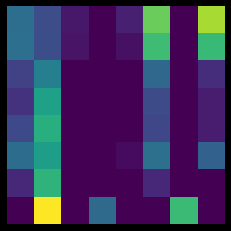

(16, 16)


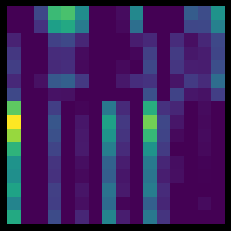

lstm feature map


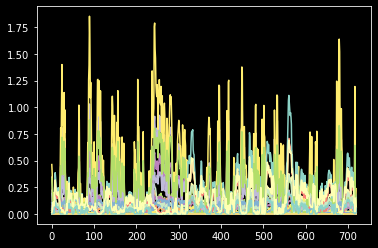

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1599
xtrain normalized : 
[[-0.75397598 -0.24940176  0.37515619 ... -0.84473916 -0.75462092
   0.36556936]
 [-0.74904255 -0.2362718   0.35941693 ... -0.83722294 -0.73325138
   0.37582826]
 [-0.78456329 -0.26004737  0.28048103 ... -0.83870697 -0.7608674
   0.10725034]
 ...
 [ 3.67464543  0.22183977  2.09299818 ...  3.47366602  3.66979652
   0.68290645]
 [ 3.79373064  0.04790321  2.14848645 ...  3.54364958  3.76590777
   0.91040324]
 [ 3.85459642 -0.05356473  2.20935194 ...  3.61567299  3.83027585
   0.95611938]]

x = reshaped : (1440, 36, 1)
x = reshaped : (159, 36, 1)
Epoch 28: early stopping
train iteration:0 - fold:1  ----->  0.7541666626930237
valid iteration:0 - fold:1  ----->  0.6037735939025879
test iteration:0 - fold:1  ----->  0.6559297218155198
(8, 8)


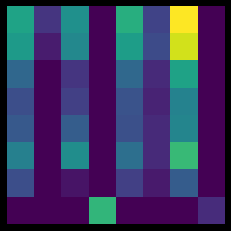

(16, 16)


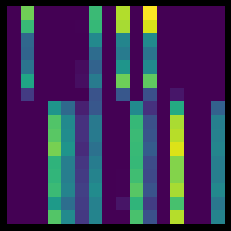

lstm feature map


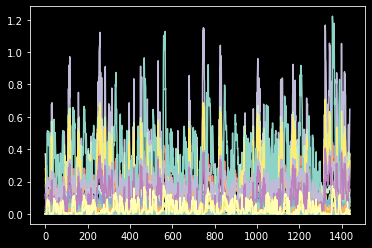

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2399
xtrain normalized : 
[[-0.41449122 -0.47519827 -0.08345126 ... -0.40920284 -0.41433671
   0.16162748]
 [-0.41435481 -0.46669278 -0.0840426  ... -0.40901189 -0.41374608
   0.16932139]
 [-0.41533694 -0.48209442 -0.0870083  ... -0.40904959 -0.41450936
  -0.03210517]
 ...
 [ 2.75769071  0.91879517  0.12515656 ...  2.65517899  2.81030324
  -0.69014388]
 [ 2.779022    0.66762266  0.05274253 ...  2.64624063  2.78188405
  -0.54553172]
 [ 2.85634795  0.6971204   0.1586141  ...  2.64639513  2.83517003
  -0.20099062]]

x = reshaped : (2160, 36, 1)
x = reshaped : (239, 36, 1)
Epoch 21: early stopping
train iteration:0 - fold:2  ----->  0.7351852059364319
valid iteration:0 - fold:2  ----->  0.5564853549003601
test iteration:0 - fold:2  ----->  0.575402635431918
(8, 8)


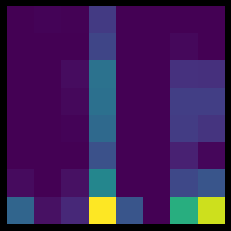

(16, 16)


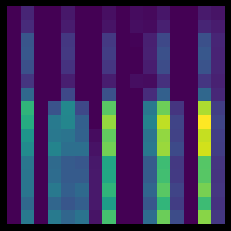

lstm feature map


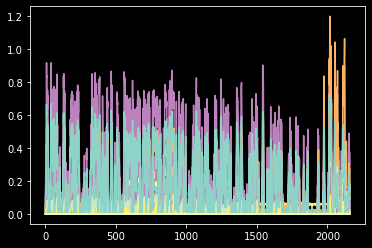

-----------


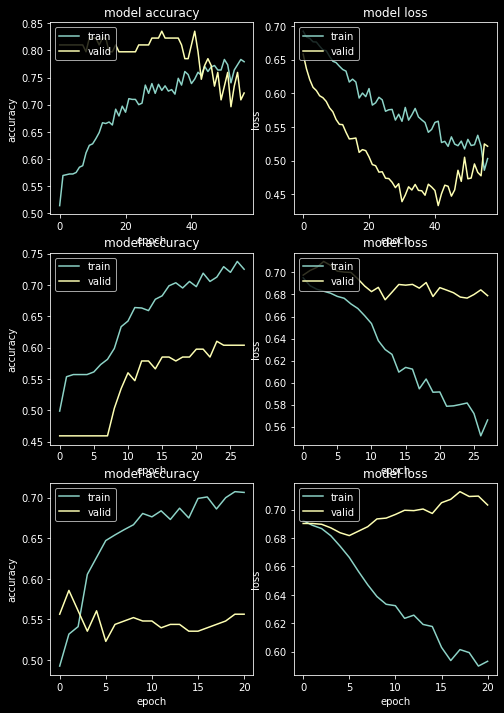






.................................................................
........................... step 1 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 799

x = reshaped : (720, 36, 1)
x = reshaped : (79, 36, 1)
Epoch 56: early stopping
train iteration:1 - fold:0  ----->  0.8125
valid iteration:1 - fold:0  ----->  0.6582278609275818
test iteration:1 - fold:0  ----->  0.6881405563689604
(8, 8)


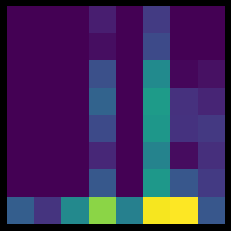

(16, 16)


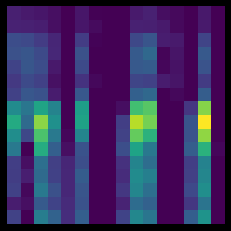

lstm feature map


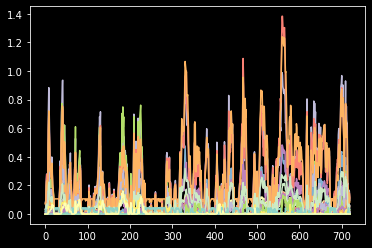

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1599

x = reshaped : (1440, 36, 1)
x = reshaped : (159, 36, 1)
Epoch 64: early stopping
train iteration:1 - fold:1  ----->  0.7902777791023254
valid iteration:1 - fold:1  ----->  0.6352201104164124
test iteration:1 - fold:1  ----->  0.6705710102489019
(8, 8)


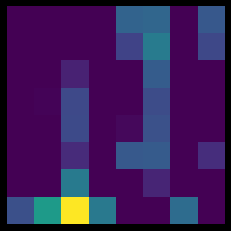

(16, 16)


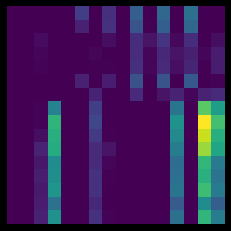

lstm feature map


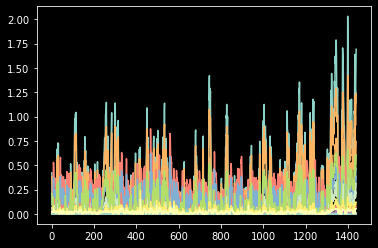

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2399

x = reshaped : (2160, 36, 1)
x = reshaped : (239, 36, 1)
Epoch 44: early stopping
train iteration:1 - fold:2  ----->  0.7606481313705444
valid iteration:1 - fold:2  ----->  0.6652719378471375
test iteration:1 - fold:2  ----->  0.7071742313323572
(8, 8)


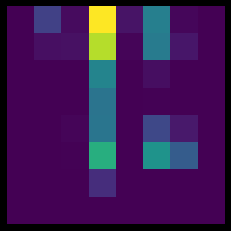

(16, 16)


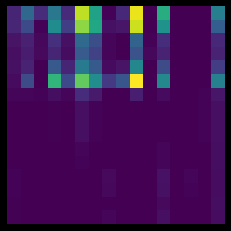

lstm feature map


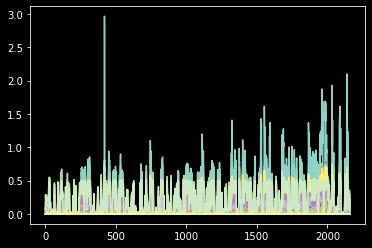

-----------


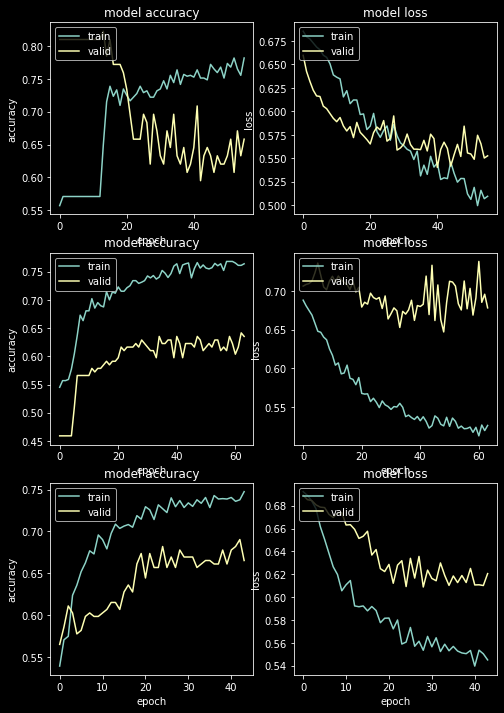






.................................................................
........................... step 2 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 799

x = reshaped : (720, 36, 1)
x = reshaped : (79, 36, 1)
Epoch 50: early stopping
train iteration:2 - fold:0  ----->  0.8138889074325562
valid iteration:2 - fold:0  ----->  0.6455696225166321
test iteration:2 - fold:0  ----->  0.6734992679355783
(8, 8)


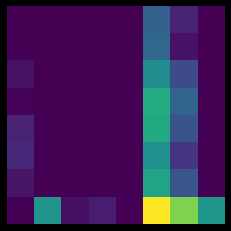

(16, 16)


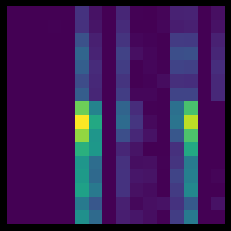

lstm feature map


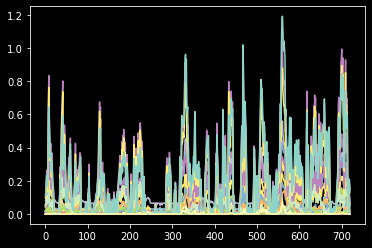

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1599

x = reshaped : (1440, 36, 1)
x = reshaped : (159, 36, 1)
Epoch 65: early stopping
train iteration:2 - fold:1  ----->  0.7847222089767456
valid iteration:2 - fold:1  ----->  0.6729559898376465
test iteration:2 - fold:1  ----->  0.6603221083455344
(8, 8)


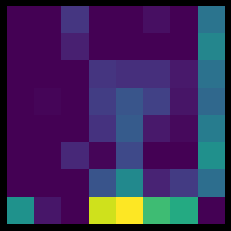

(16, 16)


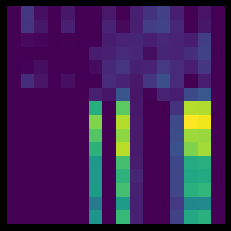

lstm feature map


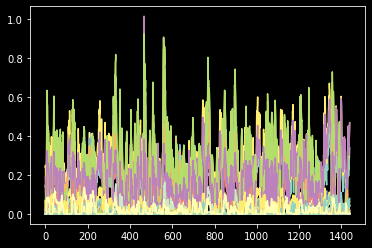

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2399

x = reshaped : (2160, 36, 1)
x = reshaped : (239, 36, 1)
Epoch 17: early stopping
train iteration:2 - fold:2  ----->  0.7361111044883728
valid iteration:2 - fold:2  ----->  0.581589937210083
test iteration:2 - fold:2  ----->  0.6076134699853587
(8, 8)


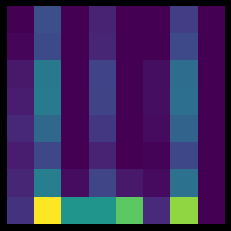

(16, 16)


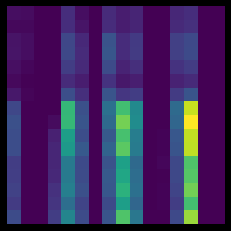

lstm feature map


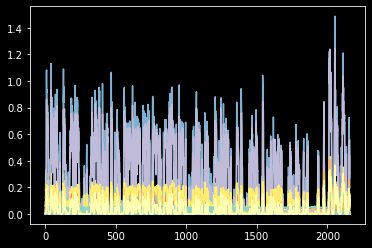

-----------


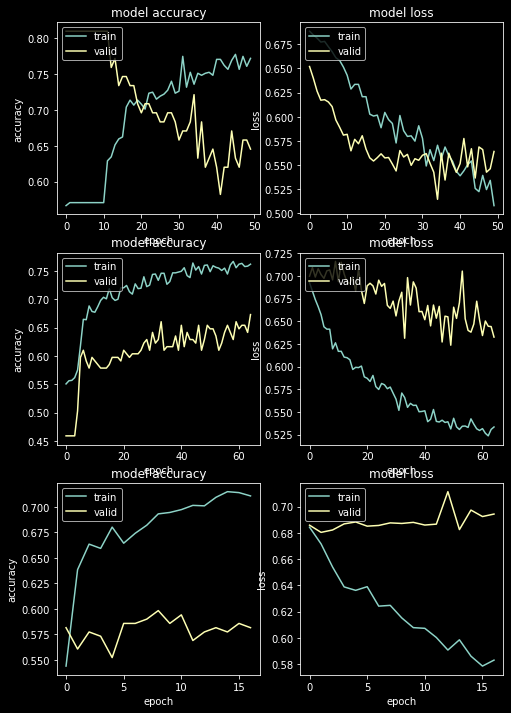






.................................................................
........................... step 3 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 799

x = reshaped : (720, 36, 1)
x = reshaped : (79, 36, 1)
Epoch 45: early stopping
train iteration:3 - fold:0  ----->  0.7847222089767456
valid iteration:3 - fold:0  ----->  0.7215189933776855
test iteration:3 - fold:0  ----->  0.6749633967789166
(8, 8)


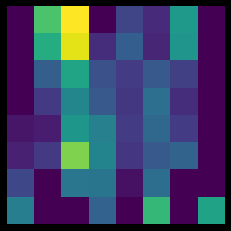

(16, 16)


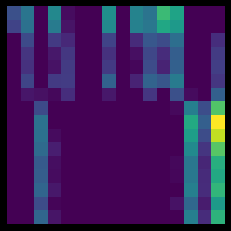

lstm feature map


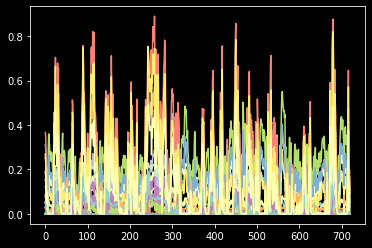

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1599

x = reshaped : (1440, 36, 1)
x = reshaped : (159, 36, 1)
Epoch 43: early stopping
train iteration:3 - fold:1  ----->  0.7875000238418579
valid iteration:3 - fold:1  ----->  0.6666666865348816
test iteration:3 - fold:1  ----->  0.6544655929721815
(8, 8)


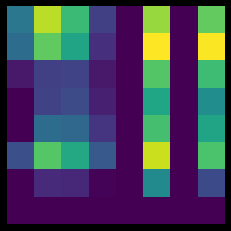

(16, 16)


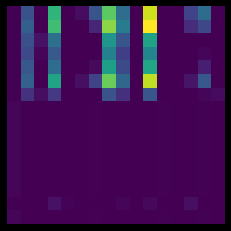

lstm feature map


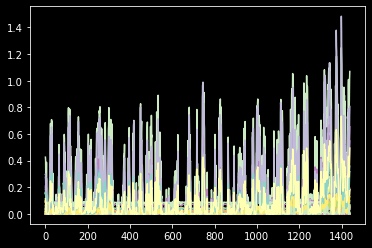

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2399

x = reshaped : (2160, 36, 1)
x = reshaped : (239, 36, 1)
Epoch 17: early stopping
train iteration:3 - fold:2  ----->  0.730555534362793
valid iteration:3 - fold:2  ----->  0.5313807725906372
test iteration:3 - fold:2  ----->  0.5666178623718887
(8, 8)


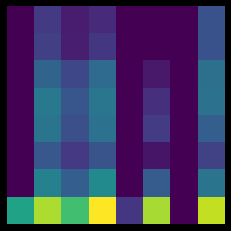

(16, 16)


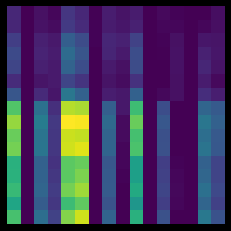

lstm feature map


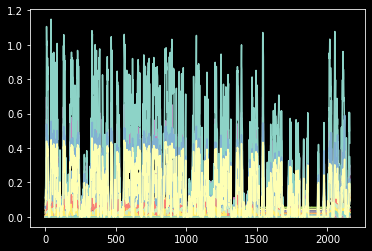

-----------


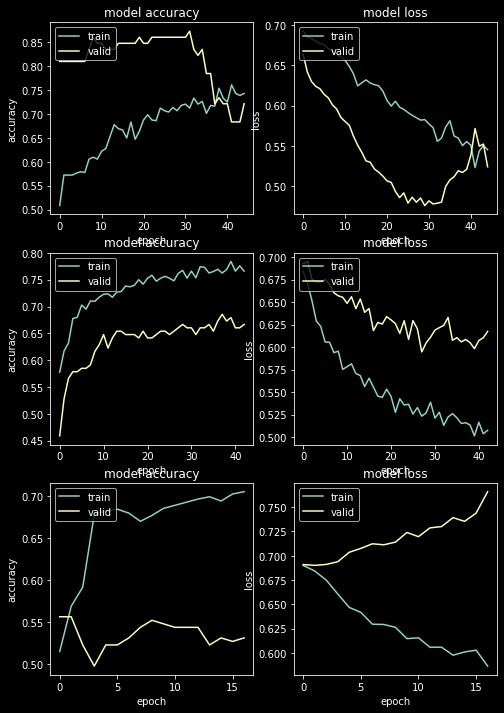






.................................................................
........................... step 4 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 799

x = reshaped : (720, 36, 1)
x = reshaped : (79, 36, 1)
Epoch 78: early stopping
train iteration:4 - fold:0  ----->  0.8263888955116272
valid iteration:4 - fold:0  ----->  0.6962025165557861
test iteration:4 - fold:0  ----->  0.6896046852122987
(8, 8)


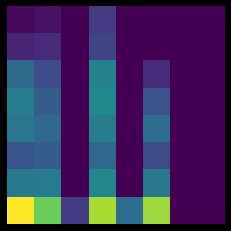

(16, 16)


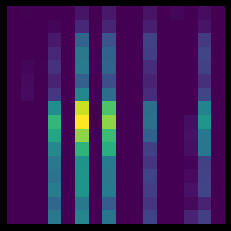

lstm feature map


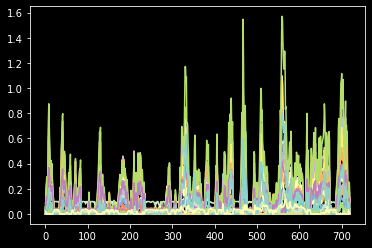

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1599

x = reshaped : (1440, 36, 1)
x = reshaped : (159, 36, 1)
Epoch 35: early stopping
train iteration:4 - fold:1  ----->  0.7743055820465088
valid iteration:4 - fold:1  ----->  0.6100628972053528
test iteration:4 - fold:1  ----->  0.664714494875549
(8, 8)


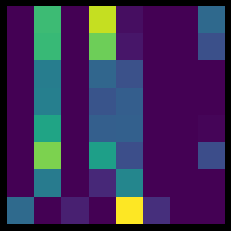

(16, 16)


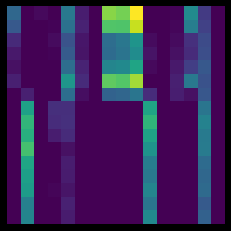

lstm feature map


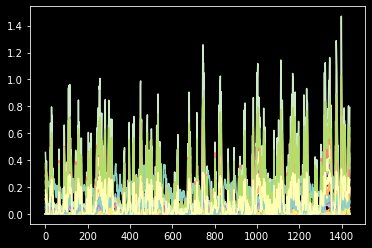

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2399

x = reshaped : (2160, 36, 1)
x = reshaped : (239, 36, 1)
Epoch 60: early stopping
train iteration:4 - fold:2  ----->  0.7773148417472839
valid iteration:4 - fold:2  ----->  0.6652719378471375
test iteration:4 - fold:2  ----->  0.698389458272328
(8, 8)


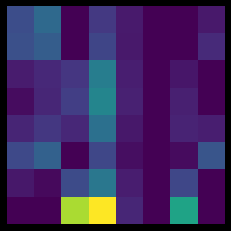

(16, 16)


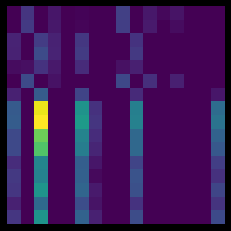

lstm feature map


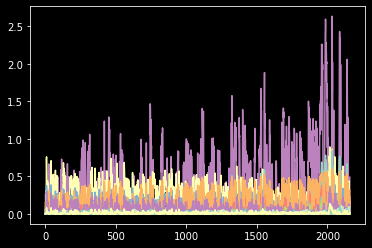

-----------


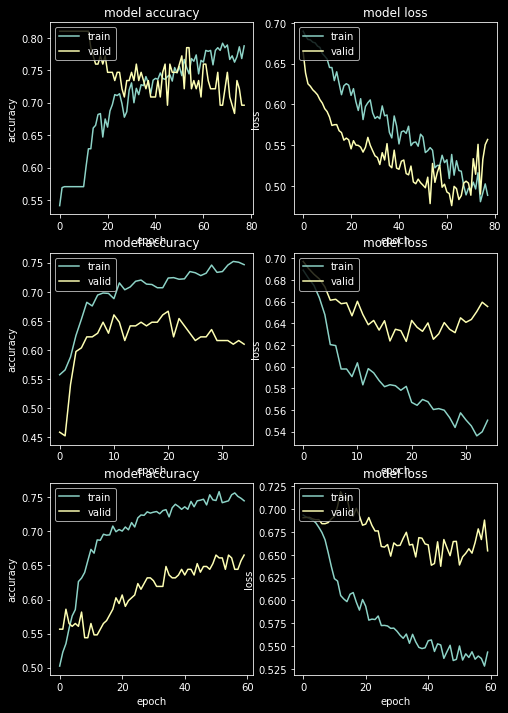






.................................................................
........................... step 5 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 799

x = reshaped : (720, 36, 1)
x = reshaped : (79, 36, 1)
Epoch 44: early stopping
train iteration:5 - fold:0  ----->  0.793055534362793
valid iteration:5 - fold:0  ----->  0.7215189933776855
test iteration:5 - fold:0  ----->  0.6837481698389458
(8, 8)


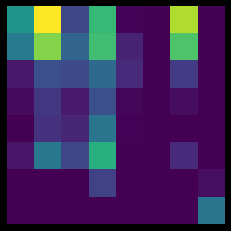

(16, 16)


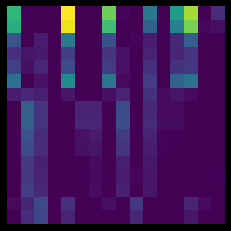

lstm feature map


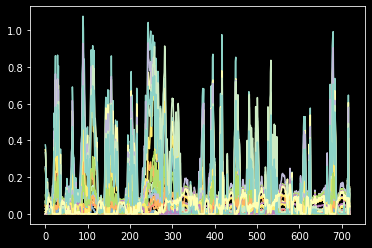

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1599

x = reshaped : (1440, 36, 1)
x = reshaped : (159, 36, 1)
Epoch 48: early stopping
train iteration:5 - fold:1  ----->  0.7840277552604675
valid iteration:5 - fold:1  ----->  0.6540880799293518
test iteration:5 - fold:1  ----->  0.6691068814055637
(8, 8)


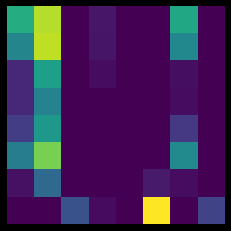

(16, 16)


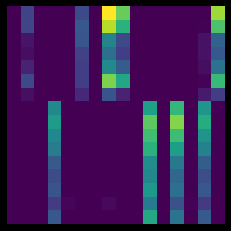

lstm feature map


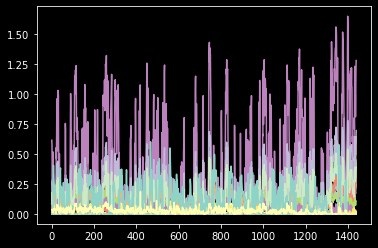

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2399

x = reshaped : (2160, 36, 1)
x = reshaped : (239, 36, 1)
Epoch 40: early stopping
train iteration:5 - fold:2  ----->  0.7587962746620178
valid iteration:5 - fold:2  ----->  0.6485355496406555
test iteration:5 - fold:2  ----->  0.7027818448023426
(8, 8)


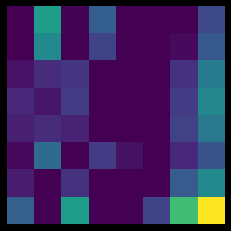

(16, 16)


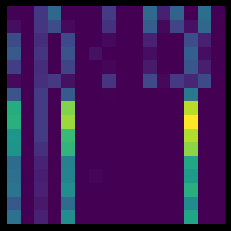

lstm feature map


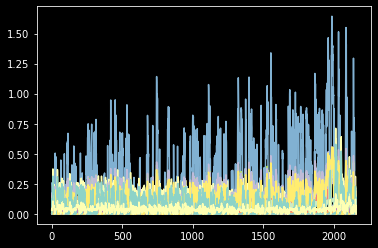

-----------


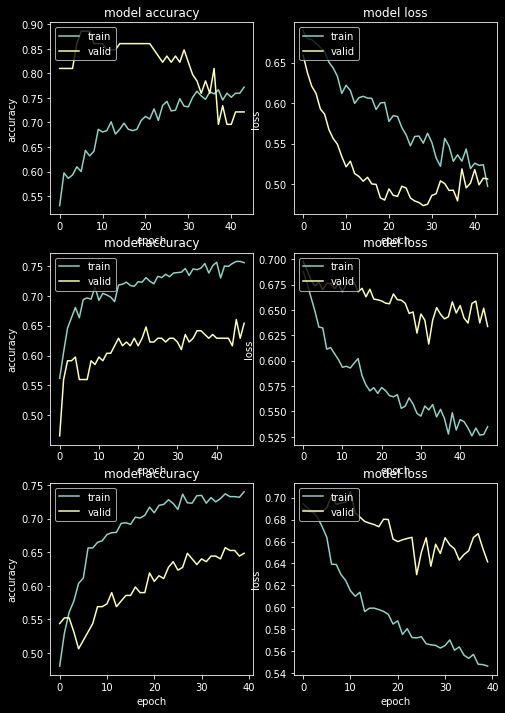





columns in order left to right : train , validation , test accuracies
rows : steps


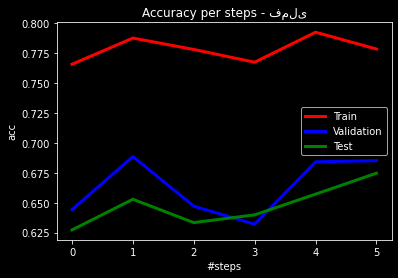

---------- Report ---------- 

mean train accueacies over 6 model training ------ >> 0.7784722215599483
mean validation accuracies over 6 model training ------ >> 0.6635757279973972
mean test accuracies over 6 model training ------ >> 0.6475477682219611


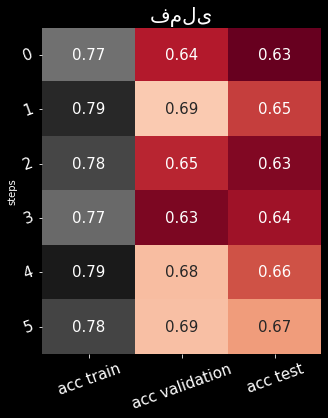

selected model : 5


In [ ]:
predictionsfammeli ,TestYfammeli = Training(file_paths[0] , counts=6 , k=3)
fammeli = Build_Labels_DF(file_paths[0] , date_path ,predictionsfammeli)


---------------------------------------------------------------وبملت------------------------------------------------------------
-1    1218
 1     954
Name: Label, dtype: int64
(2172, 37)
shape x : (2172, 36)
shape y : (2172,)
572
(572, 36, 1)

.................................................................
........................... step 0 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 723
xtrain normalized : 
[[-0.82205393 -0.49319956 -0.19176323 ... -0.81895135 -0.81294253
  -0.28513745]
 [-0.81785988 -0.5001816  -0.22195951 ... -0.81923707 -0.81866825
  -0.22640149]
 [-0.81156881 -0.51020529 -0.22762996 ... -0.8183454  -0.80959088
  -0.11388539]
 ...
 [ 1.48001026 -0.40765358 -0.03550594 ...  1.37430065  1.4723957
   0.42739829]
 [ 1.57360698  0.7300279   0.37207667 ...  1.40776085  1.53197674
   0.9911835 ]
 [ 1.55984276 -0.25372515

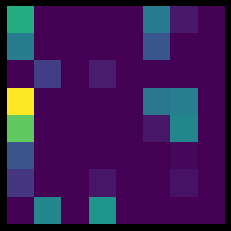

(16, 16)


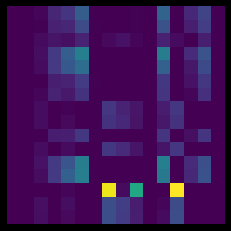

lstm feature map


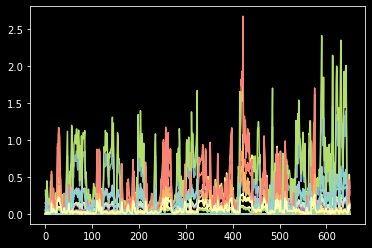

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1447
xtrain normalized : 
[[-1.37866932 -0.51568936  0.03039437 ... -1.3706397  -1.36937353
  -0.11120511]
 [-1.37481674 -0.52165332  0.00775772 ... -1.37089904 -1.3746265
  -0.05445179]
 [-1.36903786 -0.53021541  0.00350687 ... -1.37008967 -1.36629862
   0.0542663 ]
 ...
 [-0.26912504 -0.42784557  0.1092503  ... -0.36635328 -0.28033063
   0.15545262]
 [-0.19890447 -0.10388772  0.28498519 ... -0.33001082 -0.23046996
   0.81338254]
 [-0.16664096 -0.06172967  0.46254808 ... -0.29538108 -0.17492895
   1.04523983]]

x = reshaped : (1303, 36, 1)
x = reshaped : (144, 36, 1)
Epoch 36: early stopping
train iteration:0 - fold:1  ----->  0.7666922211647034
valid iteration:0 - fold:1  ----->  0.7430555820465088
test iteration:0 - fold:1  ----->  0.7132867132867133
(8, 8)


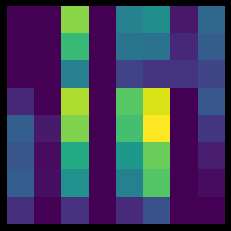

(16, 16)


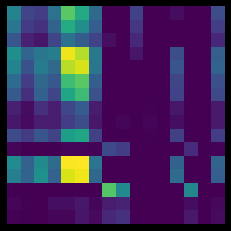

lstm feature map


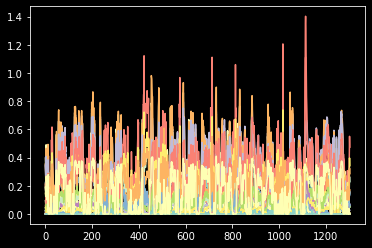

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2171
xtrain normalized : 
[[-0.52828811 -0.47510463 -0.10956595 ... -0.52057669 -0.52766169
  -0.20139435]
 [-0.52793073 -0.47663445 -0.11196096 ... -0.52059989 -0.52814985
  -0.15996079]
 [-0.52739466 -0.47883072 -0.11241071 ... -0.52052749 -0.52737594
  -0.0805896 ]
 ...
 [ 2.3304066   1.57415179  0.25183755 ...  2.03846051  2.35304217
   0.99754062]
 [ 2.49100867  2.27922024  0.97612503 ...  2.12667765  2.43816448
   1.72603348]
 [ 2.54940943  3.33314889  1.57082291 ...  2.21754308  2.50626233
   1.85950992]]

x = reshaped : (1954, 36, 1)
x = reshaped : (217, 36, 1)
Epoch 58: early stopping
train iteration:0 - fold:2  ----->  0.8070624470710754
valid iteration:0 - fold:2  ----->  0.7419354915618896
test iteration:0 - fold:2  ----->  0.7604895104895105
(8, 8)


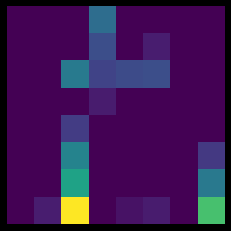

(16, 16)


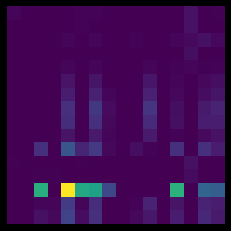

lstm feature map


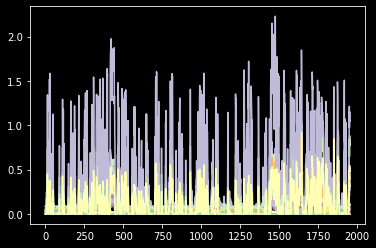

-----------


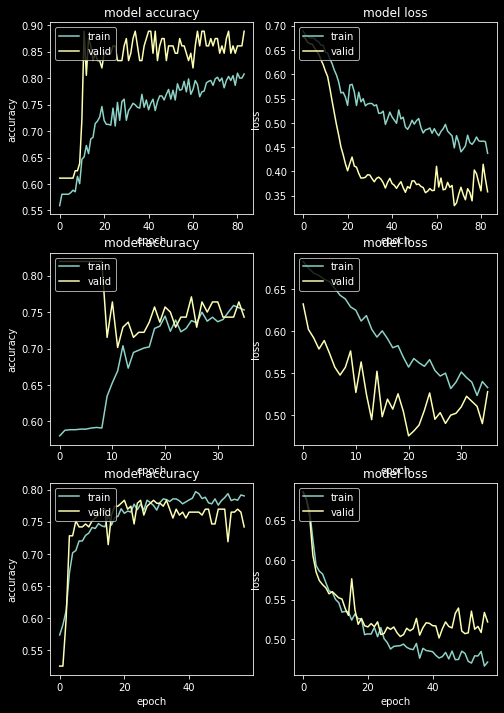






.................................................................
........................... step 1 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 723

x = reshaped : (651, 36, 1)
x = reshaped : (72, 36, 1)
Epoch 64: early stopping
train iteration:1 - fold:0  ----->  0.8325653076171875
valid iteration:1 - fold:0  ----->  0.8333333134651184
test iteration:1 - fold:0  ----->  0.722027972027972
(8, 8)


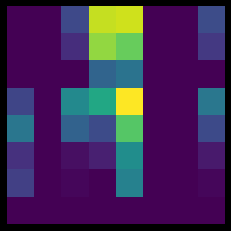

(16, 16)


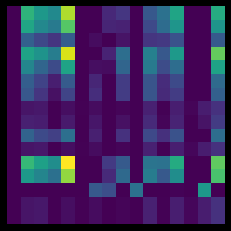

lstm feature map


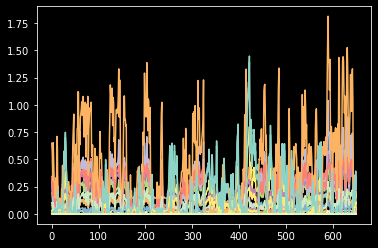

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1447

x = reshaped : (1303, 36, 1)
x = reshaped : (144, 36, 1)
Epoch 29: early stopping
train iteration:1 - fold:1  ----->  0.7751343250274658
valid iteration:1 - fold:1  ----->  0.7569444179534912
test iteration:1 - fold:1  ----->  0.7115384615384616
(8, 8)


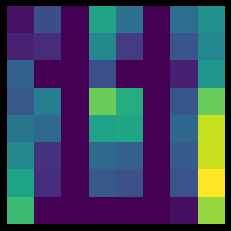

(16, 16)


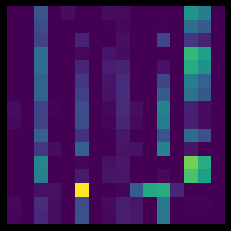

lstm feature map


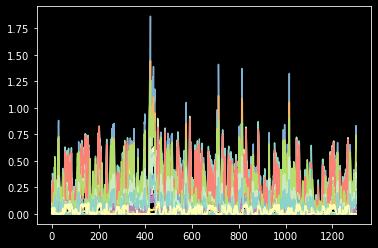

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2171

x = reshaped : (1954, 36, 1)
x = reshaped : (217, 36, 1)
Epoch 32: early stopping
train iteration:1 - fold:2  ----->  0.7942681908607483
valid iteration:1 - fold:2  ----->  0.7281106114387512
test iteration:1 - fold:2  ----->  0.7465034965034965
(8, 8)


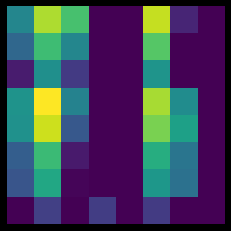

(16, 16)


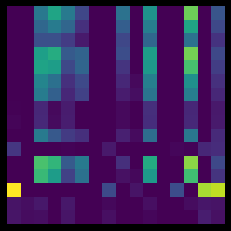

lstm feature map


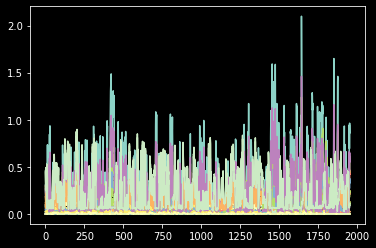

-----------


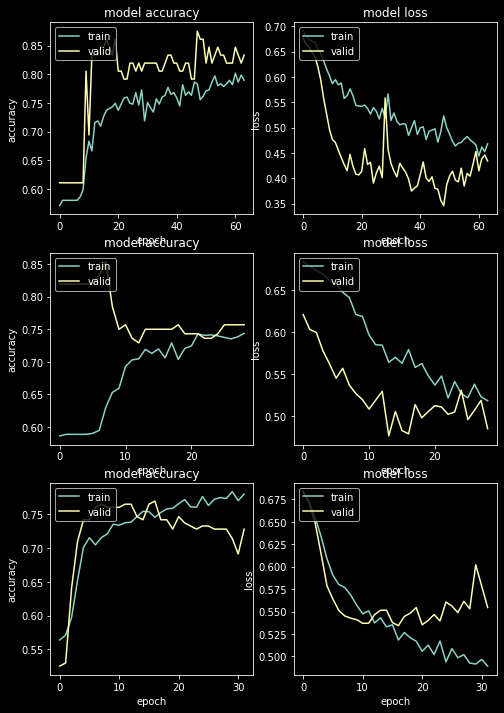






.................................................................
........................... step 2 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 723

x = reshaped : (651, 36, 1)
x = reshaped : (72, 36, 1)
Epoch 41: early stopping
train iteration:2 - fold:0  ----->  0.8018433451652527
valid iteration:2 - fold:0  ----->  0.7638888955116272
test iteration:2 - fold:0  ----->  0.701048951048951
(8, 8)


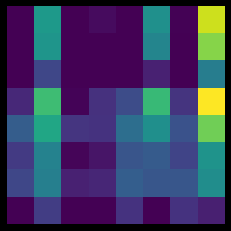

(16, 16)


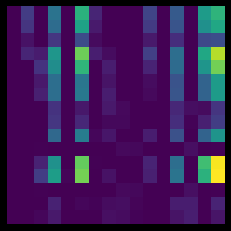

lstm feature map


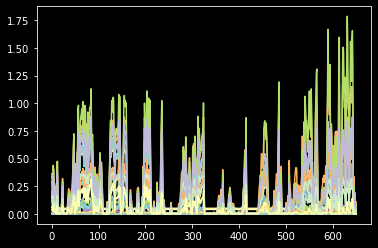

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1447

x = reshaped : (1303, 36, 1)
x = reshaped : (144, 36, 1)
Epoch 35: early stopping
train iteration:2 - fold:1  ----->  0.7843438386917114
valid iteration:2 - fold:1  ----->  0.7013888955116272
test iteration:2 - fold:1  ----->  0.736013986013986
(8, 8)


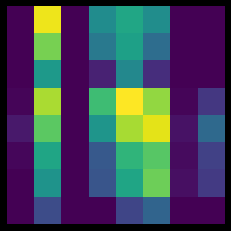

(16, 16)


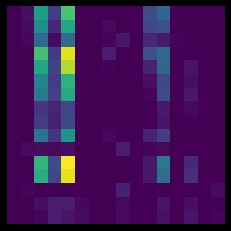

lstm feature map


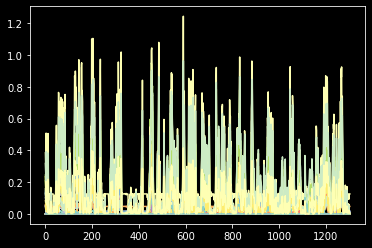

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2171

x = reshaped : (1954, 36, 1)
x = reshaped : (217, 36, 1)
Epoch 46: early stopping
train iteration:2 - fold:2  ----->  0.7942681908607483
valid iteration:2 - fold:2  ----->  0.774193525314331
test iteration:2 - fold:2  ----->  0.7517482517482518
(8, 8)


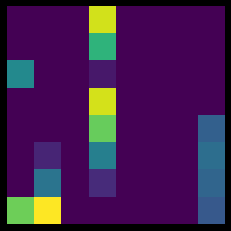

(16, 16)


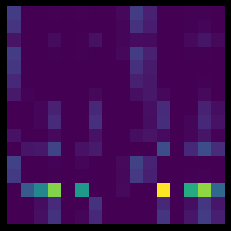

lstm feature map


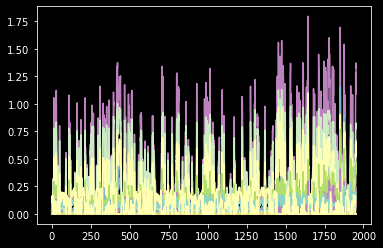

-----------


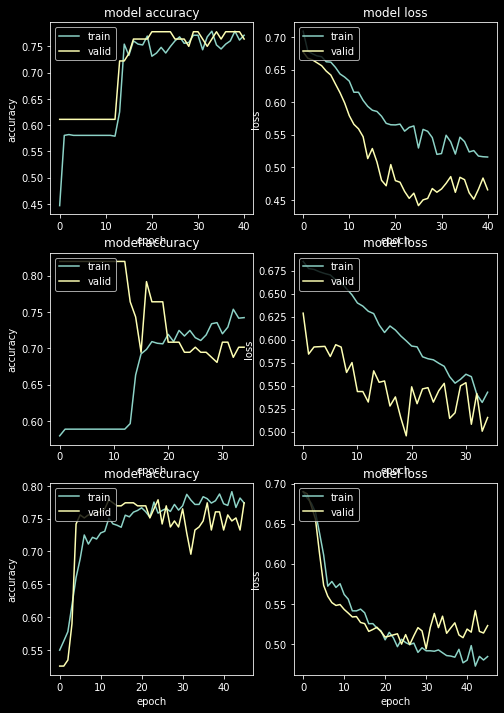






.................................................................
........................... step 3 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 723

x = reshaped : (651, 36, 1)
x = reshaped : (72, 36, 1)
Epoch 58: early stopping
train iteration:3 - fold:0  ----->  0.8141320943832397
valid iteration:3 - fold:0  ----->  0.8194444179534912
test iteration:3 - fold:0  ----->  0.722027972027972
(8, 8)


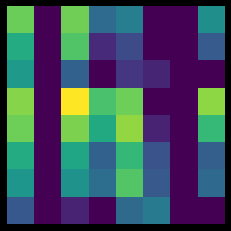

(16, 16)


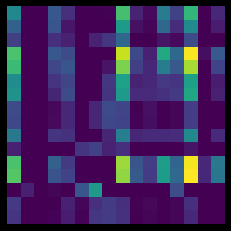

lstm feature map


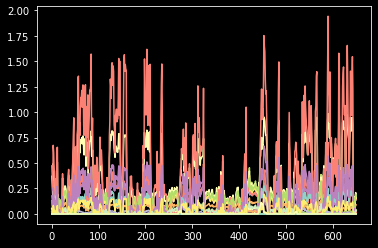

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1447

x = reshaped : (1303, 36, 1)
x = reshaped : (144, 36, 1)
Epoch 60: early stopping
train iteration:3 - fold:1  ----->  0.8112049102783203
valid iteration:3 - fold:1  ----->  0.7222222089767456
test iteration:3 - fold:1  ----->  0.7307692307692307
(8, 8)


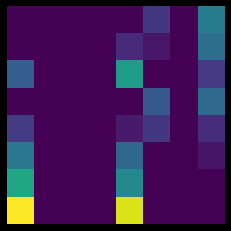

(16, 16)


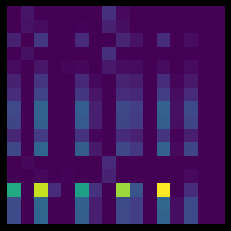

lstm feature map


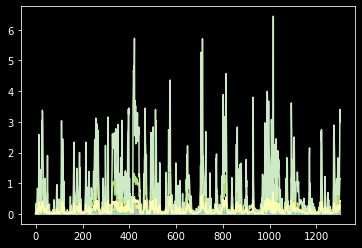

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2171

x = reshaped : (1954, 36, 1)
x = reshaped : (217, 36, 1)
Epoch 77: early stopping
train iteration:3 - fold:2  ----->  0.8065506815910339
valid iteration:3 - fold:2  ----->  0.7235022783279419
test iteration:3 - fold:2  ----->  0.7552447552447552
(8, 8)


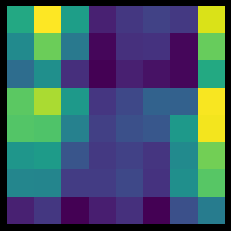

(16, 16)


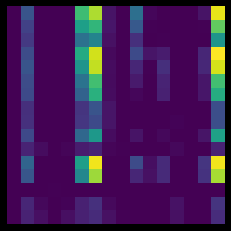

lstm feature map


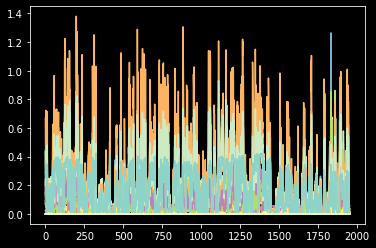

-----------


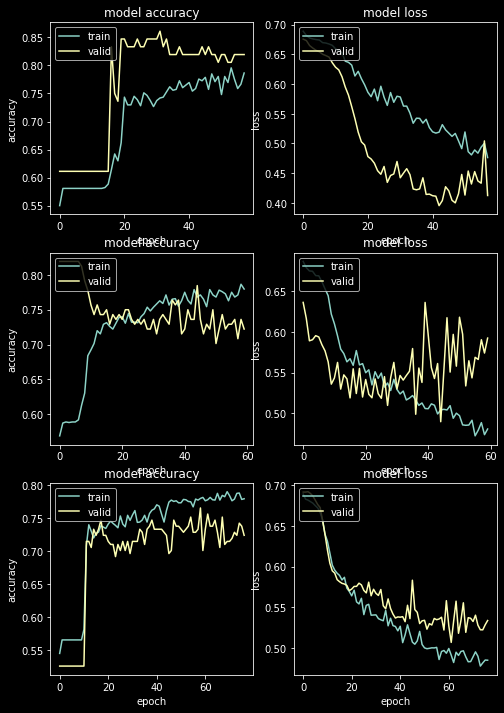






.................................................................
........................... step 4 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 723

x = reshaped : (651, 36, 1)
x = reshaped : (72, 36, 1)
Epoch 94: early stopping
train iteration:4 - fold:0  ----->  0.837173581123352
valid iteration:4 - fold:0  ----->  0.8194444179534912
test iteration:4 - fold:0  ----->  0.7132867132867133
(8, 8)


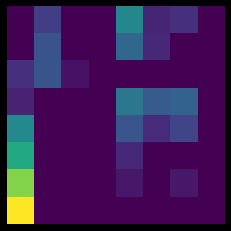

(16, 16)


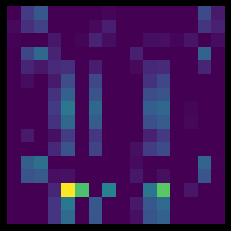

lstm feature map


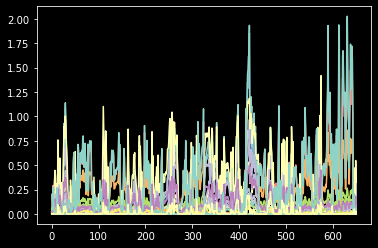

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1447

x = reshaped : (1303, 36, 1)
x = reshaped : (144, 36, 1)
Epoch 33: early stopping
train iteration:4 - fold:1  ----->  0.796623170375824
valid iteration:4 - fold:1  ----->  0.7291666865348816
test iteration:4 - fold:1  ----->  0.7395104895104895
(8, 8)


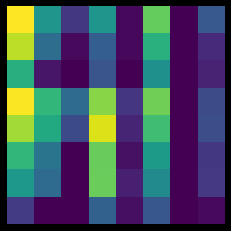

(16, 16)


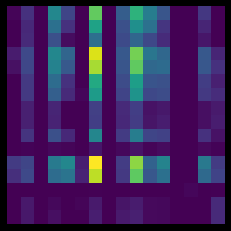

lstm feature map


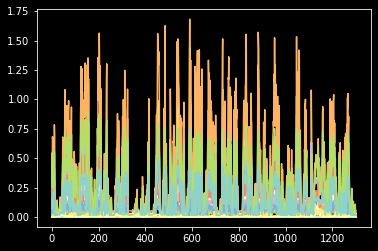

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2171

x = reshaped : (1954, 36, 1)
x = reshaped : (217, 36, 1)
Epoch 57: early stopping
train iteration:4 - fold:2  ----->  0.7983623147010803
valid iteration:4 - fold:2  ----->  0.7695852518081665
test iteration:4 - fold:2  ----->  0.743006993006993
(8, 8)


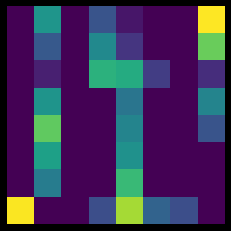

(16, 16)


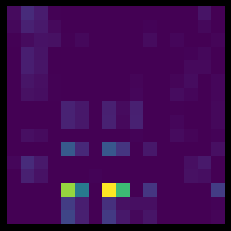

lstm feature map


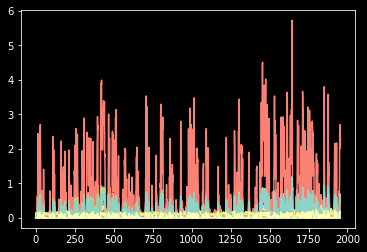

-----------


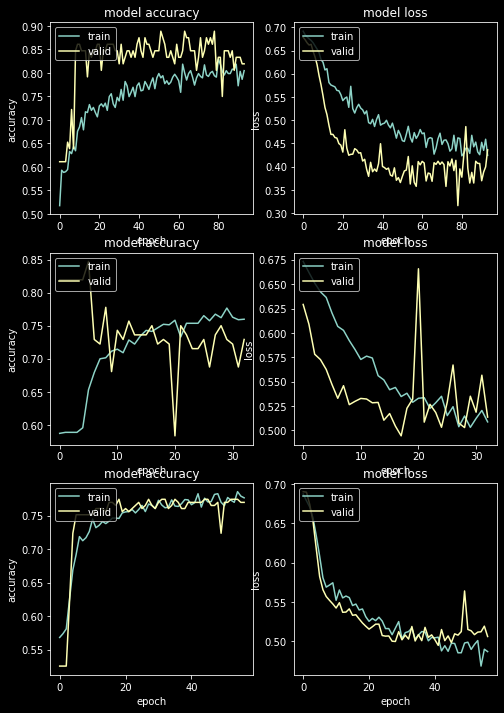






.................................................................
........................... step 5 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 723

x = reshaped : (651, 36, 1)
x = reshaped : (72, 36, 1)
Epoch 53: early stopping
train iteration:5 - fold:0  ----->  0.8125960230827332
valid iteration:5 - fold:0  ----->  0.7638888955116272
test iteration:5 - fold:0  ----->  0.6818181818181818
(8, 8)


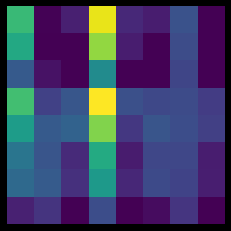

(16, 16)


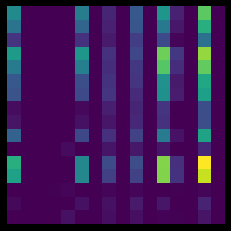

lstm feature map


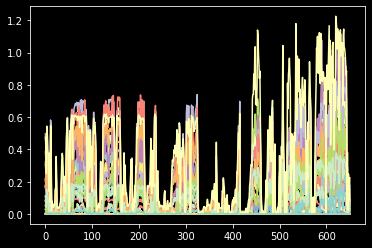

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1447

x = reshaped : (1303, 36, 1)
x = reshaped : (144, 36, 1)
Epoch 37: early stopping
train iteration:5 - fold:1  ----->  0.793553352355957
valid iteration:5 - fold:1  ----->  0.7361111044883728
test iteration:5 - fold:1  ----->  0.7167832167832168
(8, 8)


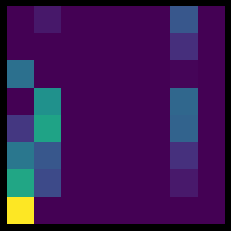

(16, 16)


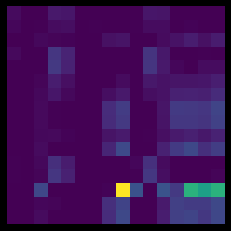

lstm feature map


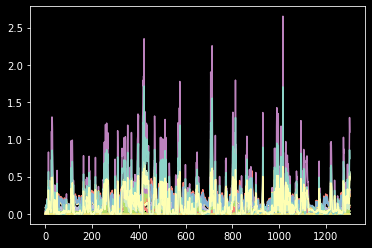

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2171

x = reshaped : (1954, 36, 1)
x = reshaped : (217, 36, 1)
Epoch 45: early stopping
train iteration:5 - fold:2  ----->  0.7973387837409973
valid iteration:5 - fold:2  ----->  0.7281106114387512
test iteration:5 - fold:2  ----->  0.743006993006993
(8, 8)


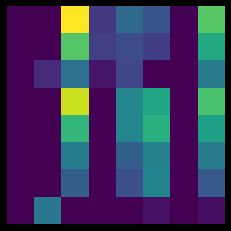

(16, 16)


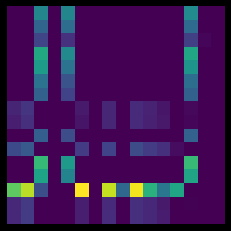

lstm feature map


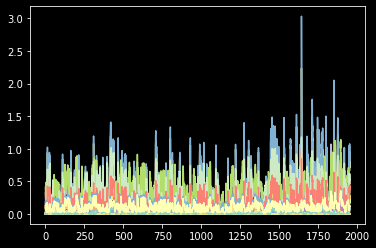

-----------


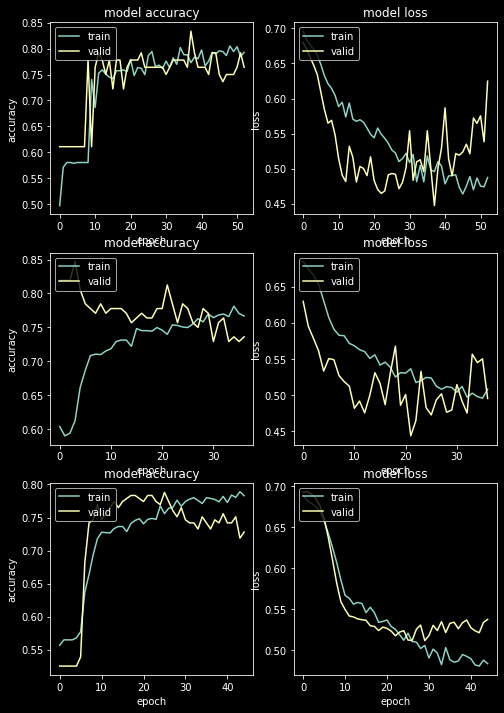





columns in order left to right : train , validation , test accuracies
rows : steps


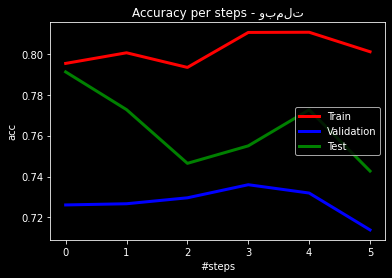

---------- Report ---------- 

mean train accueacies over 6 model training ------ >> 0.8020171556207868
mean validation accuracies over 6 model training ------ >> 0.7273698523698523
mean test accuracies over 6 model training ------ >> 0.7635119722949134


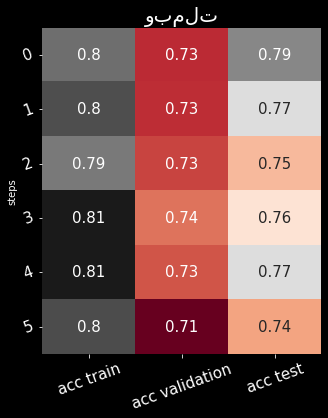

selected model : 2


In [ ]:
predictionsvebemellat ,TestYvebemellat = Training(file_paths[7] , counts=6 , k=3)
vebemellat = Build_Labels_DF(file_paths[7] , date_path ,predictionsvebemellat)


---------------------------------------------------------------پارسیان------------------------------------------------------------
-1    1564
 1     849
Name: Label, dtype: int64
(2413, 37)
shape x : (2413, 36)
shape y : (2413,)
691
(691, 36, 1)

.................................................................
........................... step 0 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 803
xtrain normalized : 
[[-0.50718954 -0.165248   -0.86775626 ... -0.3314144  -0.46937356
  -0.49554622]
 [-0.50718954 -0.17456078 -0.75938318 ... -0.3977527  -0.48354334
  -0.35121417]
 [-0.66786562 -0.14689211 -0.95537596 ... -0.4480778  -0.59592433
  -1.09409706]
 ...
 [ 1.55505926 -0.10407318  0.79116089 ...  1.34718518  1.51481515
   0.82077078]
 [ 1.69719835  0.09747151  1.1844828  ...  1.43260944  1.61974571
   1.24175079]
 [ 1.89815361 -0.02149

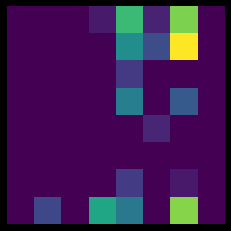

(16, 16)


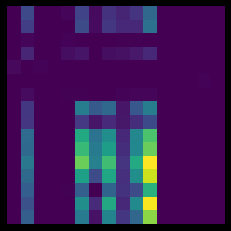

lstm feature map


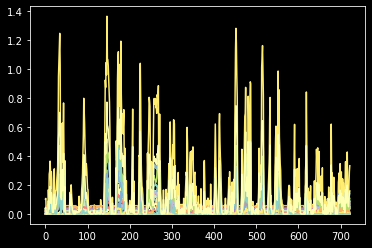

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1607
xtrain normalized : 
[[-1.02931401 -0.19332913 -0.52051266 ... -0.94858812 -1.01264573
  -0.46214613]
 [-1.02931401 -0.20535665 -0.45337008 ... -0.97744672 -1.01899189
  -0.31687844]
 [-1.10149039 -0.16962236 -0.57479748 ... -0.99933923 -1.06932348
  -1.06457714]
 ...
 [-0.00798729  0.0753137  -3.43882807 ...  0.6266946   0.01164133
  -2.10046418]
 [-0.06233899 -0.16242506 -3.38449503 ...  0.54100838 -0.04273938
  -2.13190399]
 [ 0.0440013   0.04936987 -2.99040821 ...  0.40579697  0.01479383
  -0.9565961 ]]

x = reshaped : (1447, 36, 1)
x = reshaped : (160, 36, 1)
Epoch 30: early stopping
train iteration:0 - fold:1  ----->  0.7097442746162415
valid iteration:0 - fold:1  ----->  0.643750011920929
test iteration:0 - fold:1  ----->  0.5369030390738061
(8, 8)


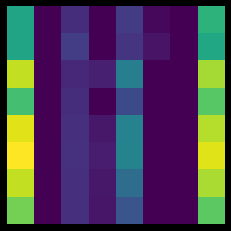

(16, 16)


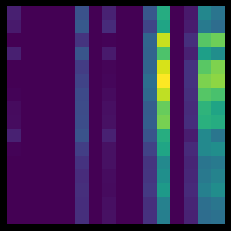

lstm feature map


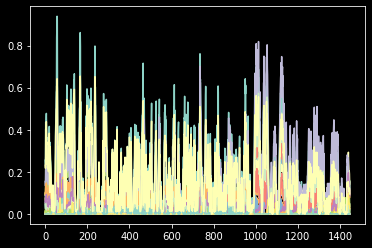

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2411
xtrain normalized : 
[[-0.4652023  -0.39333159 -0.14464883 ... -0.45415944 -0.46372433
  -0.45591557]
 [-0.4652023  -0.39955281 -0.14069682 ... -0.45569375 -0.46408212
  -0.35494584]
 [-0.46928634 -0.38106931 -0.14784403 ... -0.45685769 -0.46691979
  -0.87464112]
 ...
 [ 2.35417361 -0.13200718 -1.62954185 ...  2.43675098  2.37015443
  -0.95464941]
 [ 2.45385715 -0.11579173 -1.30295286 ...  2.37986742  2.42476652
  -0.32676606]
 [ 2.37303266 -0.17231843 -1.25816803 ...  2.32422831  2.40238452
  -0.61320169]]

x = reshaped : (2170, 36, 1)
x = reshaped : (241, 36, 1)
Epoch 26: early stopping
train iteration:0 - fold:2  ----->  0.7557603716850281
valid iteration:0 - fold:2  ----->  0.6141079068183899
test iteration:0 - fold:2  ----->  0.6758321273516642
(8, 8)


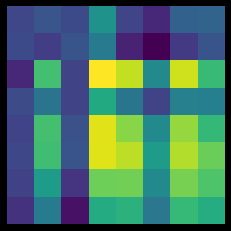

(16, 16)


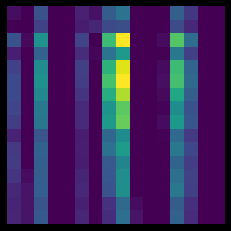

lstm feature map


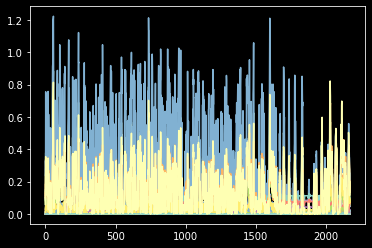

-----------


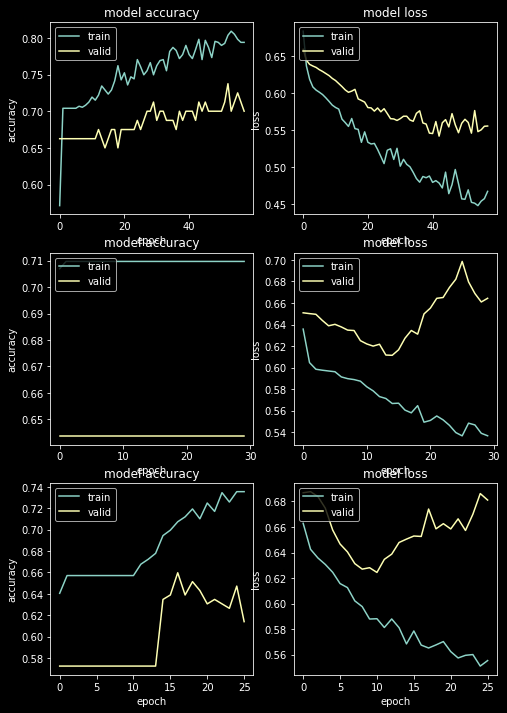






.................................................................
........................... step 1 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 803

x = reshaped : (723, 36, 1)
x = reshaped : (80, 36, 1)
Epoch 85: early stopping
train iteration:1 - fold:0  ----->  0.8423236608505249
valid iteration:1 - fold:0  ----->  0.762499988079071
test iteration:1 - fold:0  ----->  0.658465991316932
(8, 8)


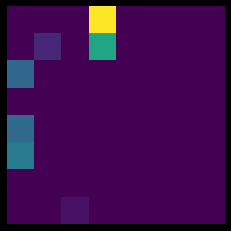

(16, 16)


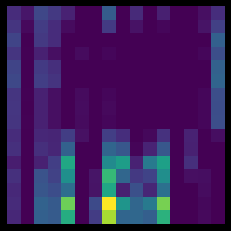

lstm feature map


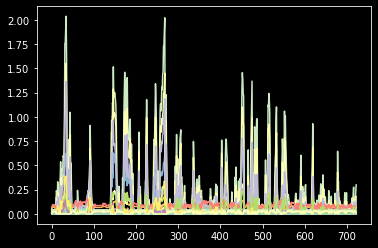

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1607

x = reshaped : (1447, 36, 1)
x = reshaped : (160, 36, 1)
Epoch 28: early stopping
train iteration:1 - fold:1  ----->  0.7629578709602356
valid iteration:1 - fold:1  ----->  0.699999988079071
test iteration:1 - fold:1  ----->  0.5846599131693199
(8, 8)


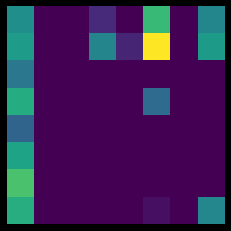

(16, 16)


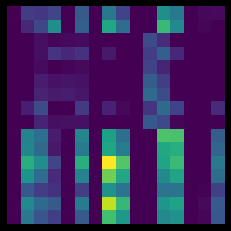

lstm feature map


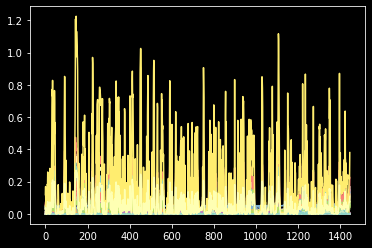

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2411

x = reshaped : (2170, 36, 1)
x = reshaped : (241, 36, 1)
Epoch 26: early stopping
train iteration:1 - fold:2  ----->  0.7511520981788635
valid iteration:1 - fold:2  ----->  0.6597510576248169
test iteration:1 - fold:2  ----->  0.7004341534008683
(8, 8)


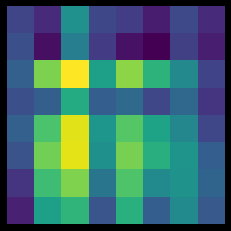

(16, 16)


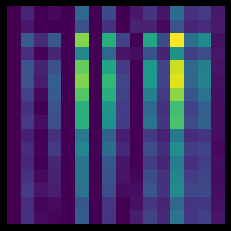

lstm feature map


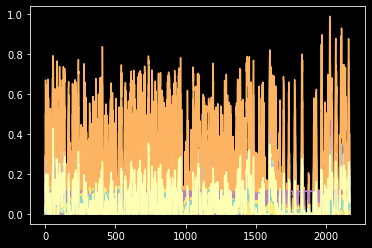

-----------


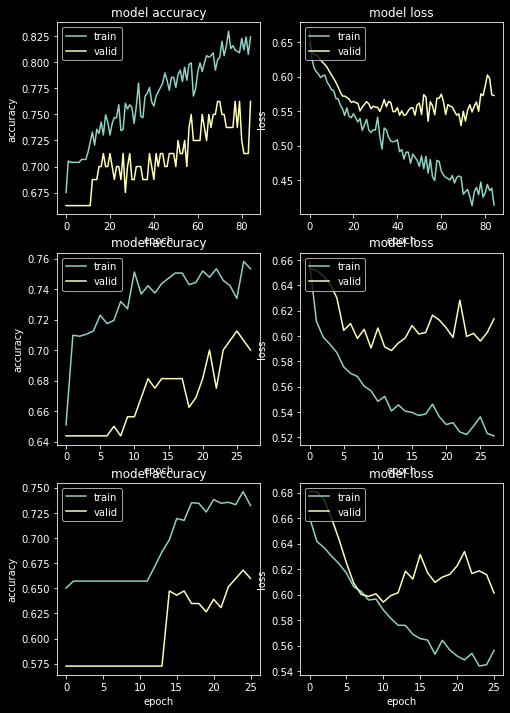






.................................................................
........................... step 2 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 803

x = reshaped : (723, 36, 1)
x = reshaped : (80, 36, 1)
Epoch 55: early stopping
train iteration:2 - fold:0  ----->  0.7925311326980591
valid iteration:2 - fold:0  ----->  0.7124999761581421
test iteration:2 - fold:0  ----->  0.6845151953690304
(8, 8)


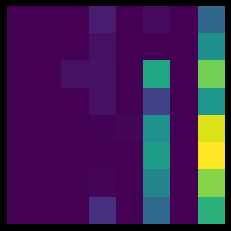

(16, 16)


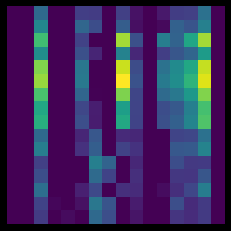

lstm feature map


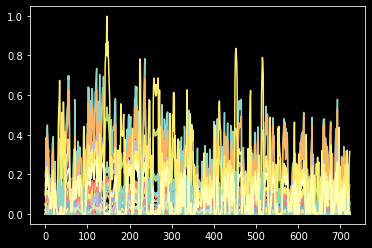

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1607

x = reshaped : (1447, 36, 1)
x = reshaped : (160, 36, 1)
Epoch 29: early stopping
train iteration:2 - fold:1  ----->  0.7408431172370911
valid iteration:2 - fold:1  ----->  0.65625
test iteration:2 - fold:1  ----->  0.5513748191027497
(8, 8)


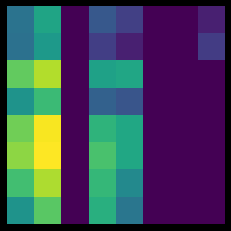

(16, 16)


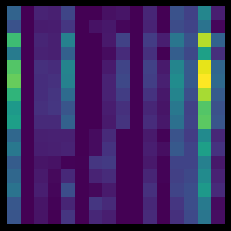

lstm feature map


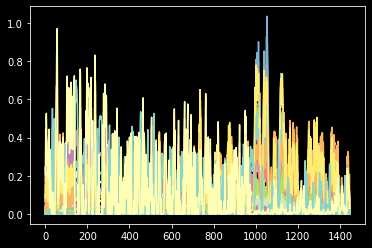

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2411

x = reshaped : (2170, 36, 1)
x = reshaped : (241, 36, 1)
Epoch 72: early stopping
train iteration:2 - fold:2  ----->  0.7838709950447083
valid iteration:2 - fold:2  ----->  0.7053942084312439
test iteration:2 - fold:2  ----->  0.7091172214182344
(8, 8)


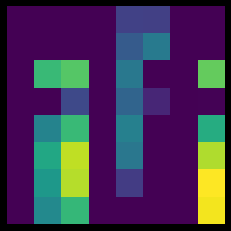

(16, 16)


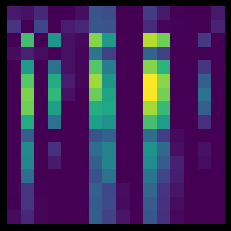

lstm feature map


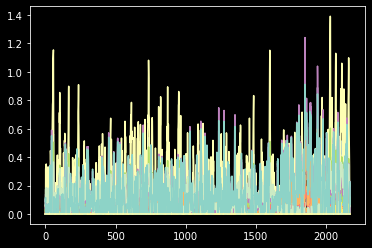

-----------


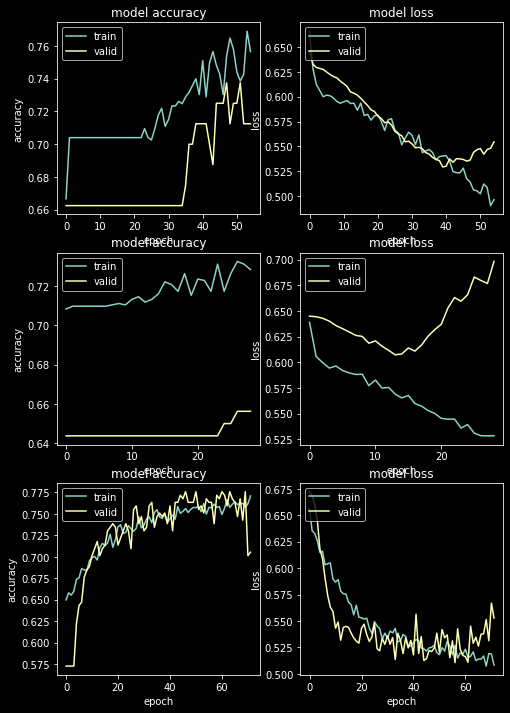






.................................................................
........................... step 3 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 803

x = reshaped : (723, 36, 1)
x = reshaped : (80, 36, 1)
Epoch 56: early stopping
train iteration:3 - fold:0  ----->  0.704011082649231
valid iteration:3 - fold:0  ----->  0.6625000238418579
test iteration:3 - fold:0  ----->  0.5369030390738061
(8, 8)


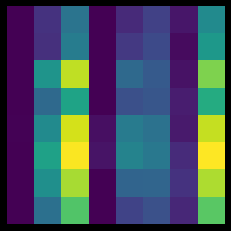

(16, 16)


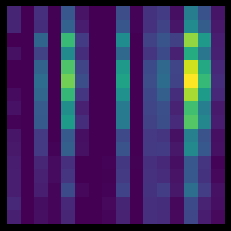

lstm feature map


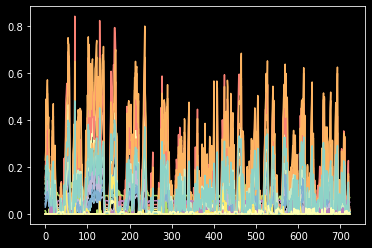

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1607

x = reshaped : (1447, 36, 1)
x = reshaped : (160, 36, 1)
Epoch 23: early stopping
train iteration:3 - fold:1  ----->  0.7643400430679321
valid iteration:3 - fold:1  ----->  0.6937500238418579
test iteration:3 - fold:1  ----->  0.6613603473227206
(8, 8)


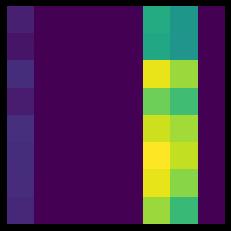

(16, 16)


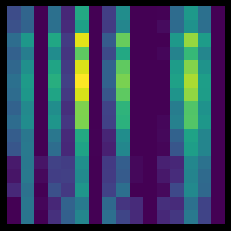

lstm feature map


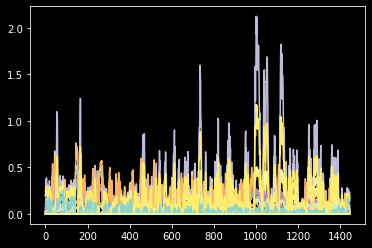

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2411

x = reshaped : (2170, 36, 1)
x = reshaped : (241, 36, 1)
Epoch 37: early stopping
train iteration:3 - fold:2  ----->  0.7668202519416809
valid iteration:3 - fold:2  ----->  0.7634854912757874
test iteration:3 - fold:2  ----->  0.7047756874095513
(8, 8)


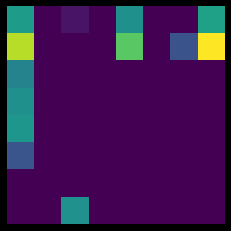

(16, 16)


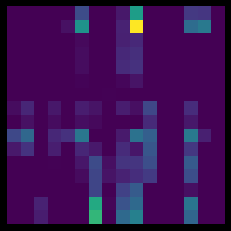

lstm feature map


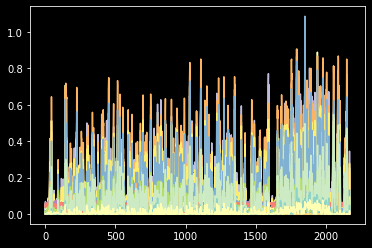

-----------


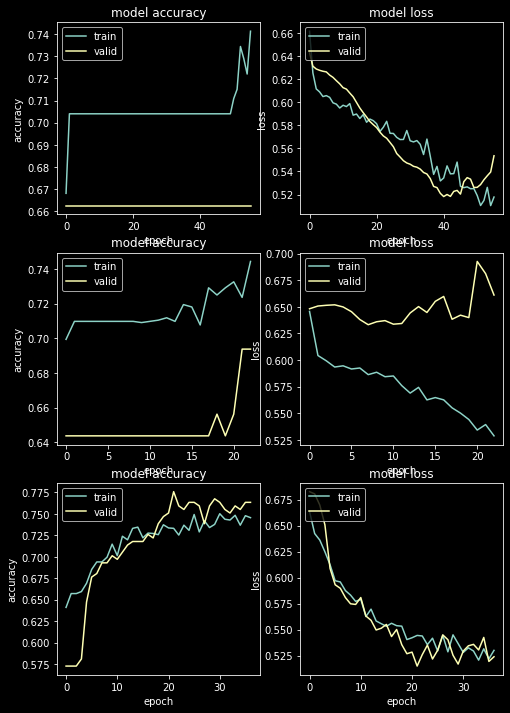






.................................................................
........................... step 4 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 803

x = reshaped : (723, 36, 1)
x = reshaped : (80, 36, 1)
Epoch 47: early stopping
train iteration:4 - fold:0  ----->  0.816044270992279
valid iteration:4 - fold:0  ----->  0.7124999761581421
test iteration:4 - fold:0  ----->  0.6685962373371924
(8, 8)


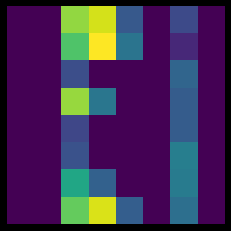

(16, 16)


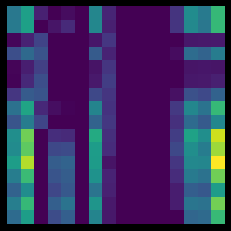

lstm feature map


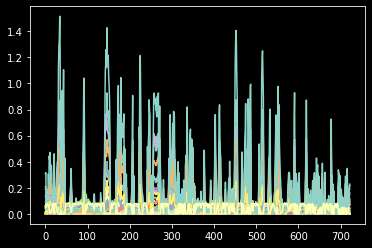

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1607

x = reshaped : (1447, 36, 1)
x = reshaped : (160, 36, 1)
Epoch 23: early stopping
train iteration:4 - fold:1  ----->  0.7601935267448425
valid iteration:4 - fold:1  ----->  0.6875
test iteration:4 - fold:1  ----->  0.6367583212735166
(8, 8)


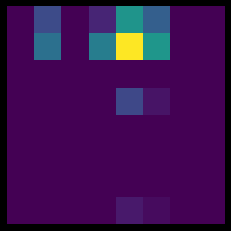

(16, 16)


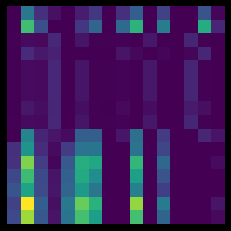

lstm feature map


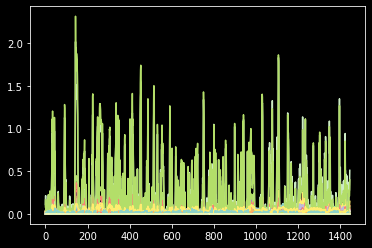

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2411

x = reshaped : (2170, 36, 1)
x = reshaped : (241, 36, 1)
train iteration:4 - fold:2  ----->  0.8009216785430908
valid iteration:4 - fold:2  ----->  0.7676348686218262
test iteration:4 - fold:2  ----->  0.7206946454413893
(8, 8)


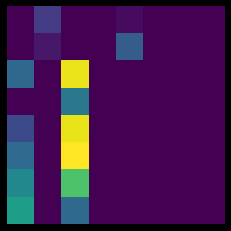

(16, 16)


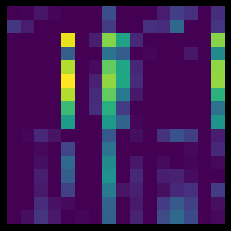

lstm feature map


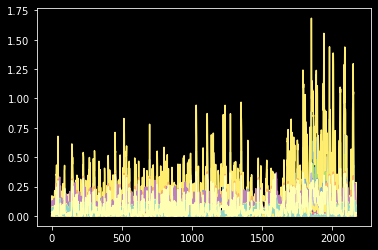

-----------


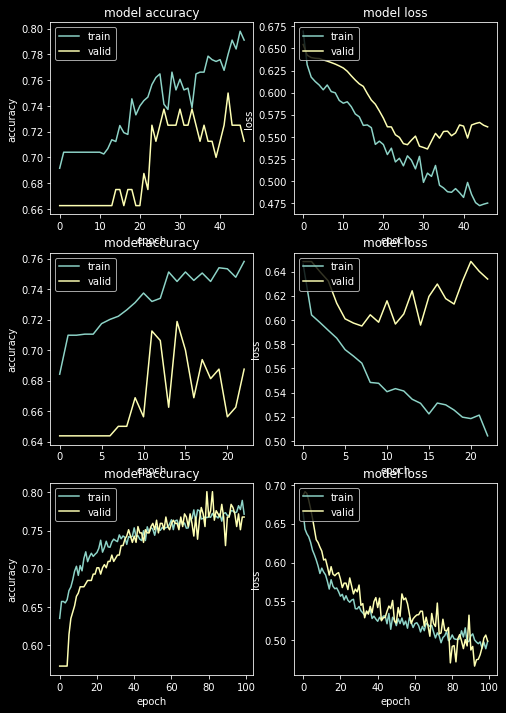






.................................................................
........................... step 5 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 803

x = reshaped : (723, 36, 1)
x = reshaped : (80, 36, 1)
Epoch 54: early stopping
train iteration:5 - fold:0  ----->  0.8091286420822144
valid iteration:5 - fold:0  ----->  0.7250000238418579
test iteration:5 - fold:0  ----->  0.6859623733719248
(8, 8)


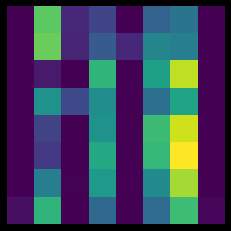

(16, 16)


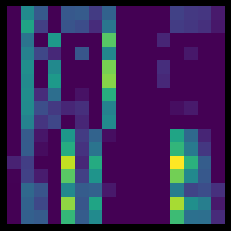

lstm feature map


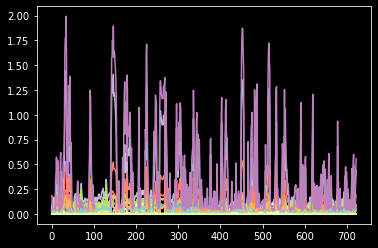

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1607

x = reshaped : (1447, 36, 1)
x = reshaped : (160, 36, 1)
Epoch 36: early stopping
train iteration:5 - fold:1  ----->  0.7595024108886719
valid iteration:5 - fold:1  ----->  0.6625000238418579
test iteration:5 - fold:1  ----->  0.5687409551374819
(8, 8)


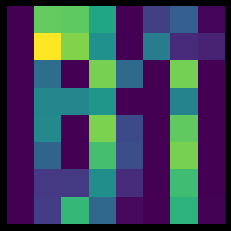

(16, 16)


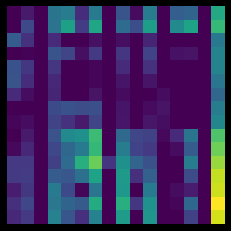

lstm feature map


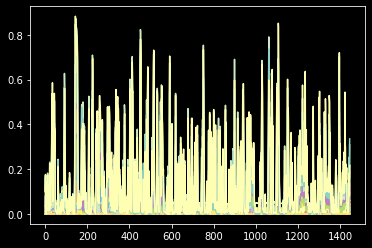

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2411

x = reshaped : (2170, 36, 1)
x = reshaped : (241, 36, 1)
Epoch 85: early stopping
train iteration:5 - fold:2  ----->  0.7723502516746521
valid iteration:5 - fold:2  ----->  0.7676348686218262
test iteration:5 - fold:2  ----->  0.723589001447178
(8, 8)


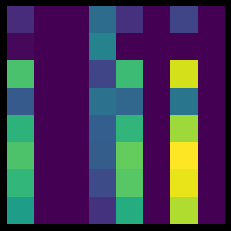

(16, 16)


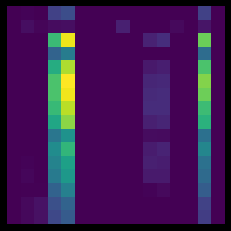

lstm feature map


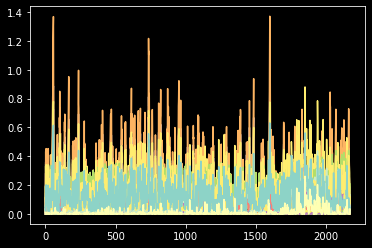

-----------


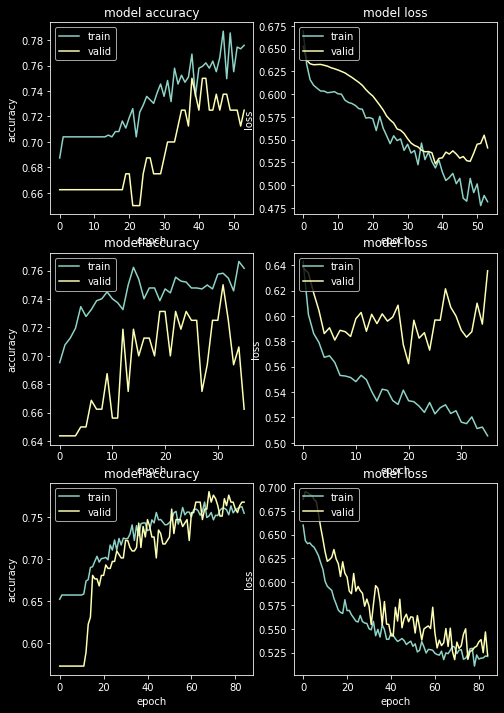





columns in order left to right : train , validation , test accuracies
rows : steps


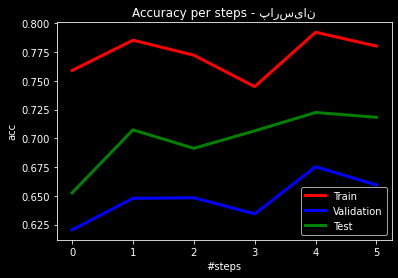

---------- Report ---------- 

mean train accueacies over 6 model training ------ >> 0.7724661429723104
mean validation accuracies over 6 model training ------ >> 0.6476121562952243
mean test accuracies over 6 model training ------ >> 0.6998199125130972


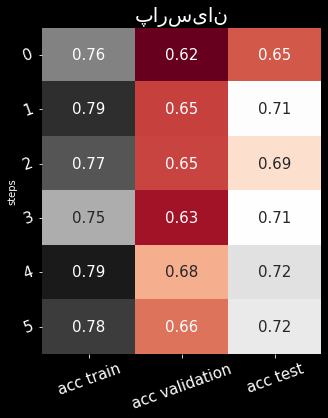

selected model : 3


In [ ]:
predictionsparsian ,TestYparsian = Training(file_paths[9] , counts=6 , k=3)
parsian = Build_Labels_DF(file_paths[9] , date_path ,predictionsparsian)


---------------------------------------------------------------خودرو------------------------------------------------------------
-1    1347
 1     943
Name: Label, dtype: int64
(2290, 37)
shape x : (2290, 36)
shape y : (2290,)
640
(640, 36, 1)

.................................................................
........................... step 0 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 762
xtrain normalized : 
[[-0.37832221 -0.61626615 -0.29902135 ... -0.50170619 -0.36830248
   0.0715839 ]
 [-0.4021397  -0.61629419 -0.28651875 ... -0.50608651 -0.39405386
  -0.07349096]
 [-0.36310548 -0.61234049 -0.20705541 ... -0.50466199 -0.3823887
   0.18612056]
 ...
 [ 1.10800946 -0.3457264  -0.45028543 ...  1.01893313  1.12817067
   0.01332146]
 [ 1.08694625 -0.4357728  -0.46323213 ...  1.01809561  1.10890082
  -0.06552147]
 [ 1.0961614  -0.46899485

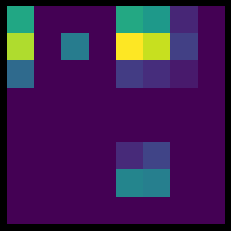

(16, 16)


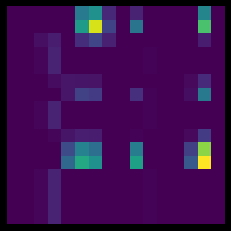

lstm feature map


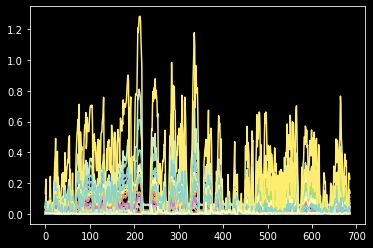

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1525
xtrain normalized : 
[[-9.61441749e-01 -6.76088995e-01 -2.04052800e-01 ... -1.05336646e+00
  -9.52613550e-01  1.05876550e-01]
 [-9.81171653e-01 -6.76115313e-01 -1.94378656e-01 ... -1.05699572e+00
  -9.73915361e-01 -5.28871758e-02]
 [-9.48836532e-01 -6.72403798e-01 -1.32892219e-01 ... -1.05581545e+00
  -9.64265823e-01  2.31220565e-01]
 ...
 [ 1.05027607e+00 -4.27175941e-04  5.98458258e-01 ...  8.12563524e-01
   1.09281219e+00  8.92756991e-01]
 [ 9.50662966e-01  2.46164399e-01  5.31052690e-01 ...  8.28179754e-01
   9.71474391e-01  3.93568174e-01]
 [ 8.97781935e-01 -1.83625306e-01  3.84507614e-01 ...  8.31190953e-01
   8.96302154e-01  1.09247863e-01]]

x = reshaped : (1373, 36, 1)
x = reshaped : (152, 36, 1)
Epoch 49: early stopping
train iteration:0 - fold:1  ----->  0.7793153524398804
valid iteration:0 - fold:1  ----->  0.7960526347160339
test iteration:0 - fold:1  ----->  0.7171875

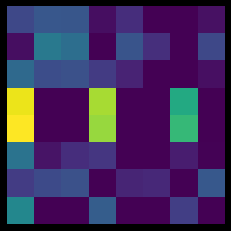

(16, 16)


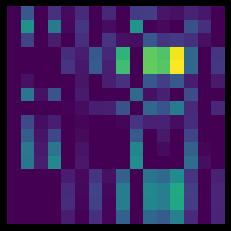

lstm feature map


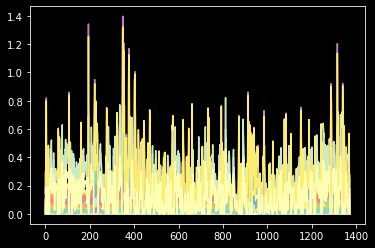

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2288
xtrain normalized : 
[[-0.36640867 -0.28930625 -0.05848709 ... -0.35999321 -0.36576628
  -0.01619855]
 [-0.36719441 -0.28930828 -0.05816017 ... -0.36012347 -0.36661483
  -0.13013517]
 [-0.36590668 -0.28902198 -0.05608231 ... -0.3600811  -0.36623044
   0.07375444]
 ...
 [ 1.9479839   2.28129786 -0.82711035 ...  1.85075348  1.9152049
  -0.60007981]
 [ 1.87051451  1.44537879 -0.86324866 ...  1.82622717  1.91198714
  -0.83056588]
 [ 1.89956553 -0.15562416 -0.82411098 ...  1.80026779  1.89268053
  -0.61788928]]

x = reshaped : (2060, 36, 1)
x = reshaped : (228, 36, 1)
Epoch 79: early stopping
train iteration:0 - fold:2  ----->  0.772330105304718
valid iteration:0 - fold:2  ----->  0.7412280440330505
test iteration:0 - fold:2  ----->  0.715625
(8, 8)


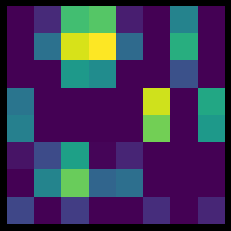

(16, 16)


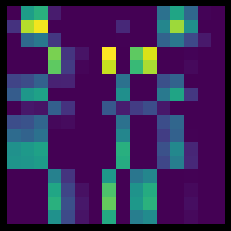

lstm feature map


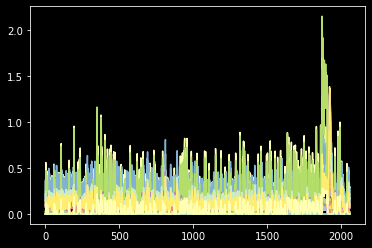

-----------


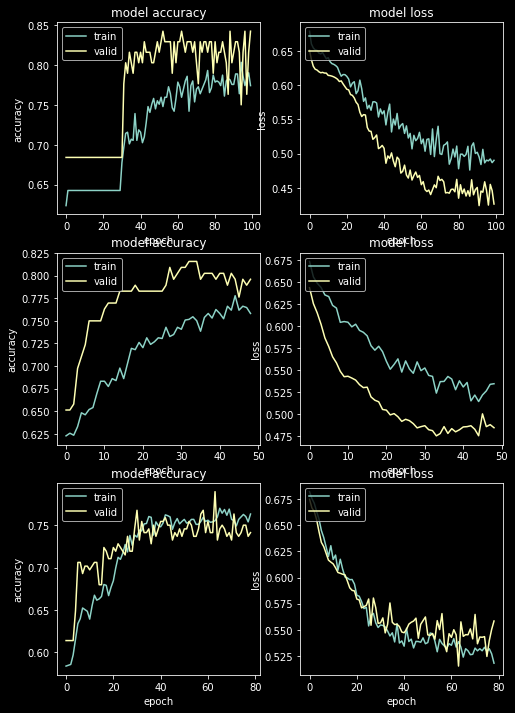






.................................................................
........................... step 1 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 762

x = reshaped : (686, 36, 1)
x = reshaped : (76, 36, 1)
train iteration:1 - fold:0  ----->  0.7827988266944885
valid iteration:1 - fold:0  ----->  0.7631579041481018
test iteration:1 - fold:0  ----->  0.5890625
(8, 8)


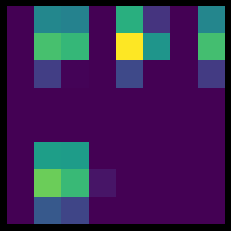

(16, 16)


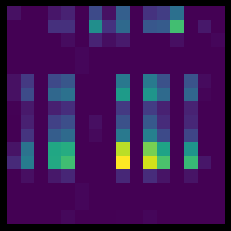

lstm feature map


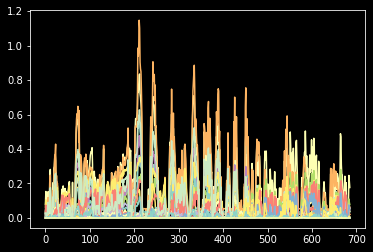

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1525

x = reshaped : (1373, 36, 1)
x = reshaped : (152, 36, 1)
Epoch 75: early stopping
train iteration:1 - fold:1  ----->  0.7989803552627563
valid iteration:1 - fold:1  ----->  0.8026315569877625
test iteration:1 - fold:1  ----->  0.6796875
(8, 8)


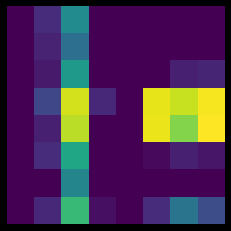

(16, 16)


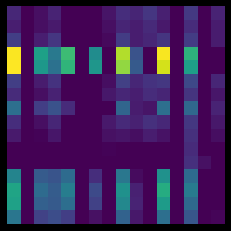

lstm feature map


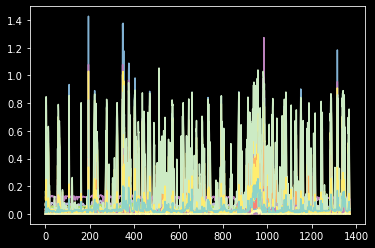

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2288

x = reshaped : (2060, 36, 1)
x = reshaped : (228, 36, 1)
Epoch 57: early stopping
train iteration:1 - fold:2  ----->  0.7762135863304138
valid iteration:1 - fold:2  ----->  0.7412280440330505
test iteration:1 - fold:2  ----->  0.771875
(8, 8)


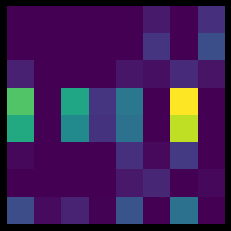

(16, 16)


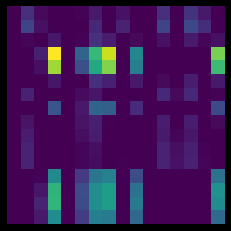

lstm feature map


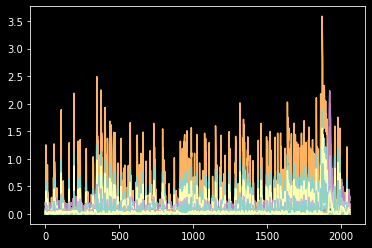

-----------


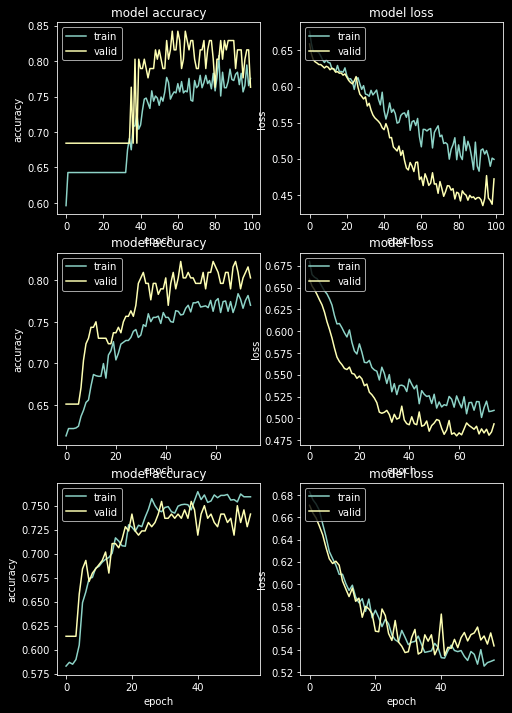






.................................................................
........................... step 2 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 762

x = reshaped : (686, 36, 1)
x = reshaped : (76, 36, 1)
Epoch 69: early stopping
train iteration:2 - fold:0  ----->  0.8032069802284241
valid iteration:2 - fold:0  ----->  0.7631579041481018
test iteration:2 - fold:0  ----->  0.6578125
(8, 8)


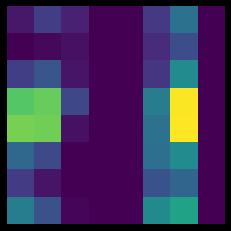

(16, 16)


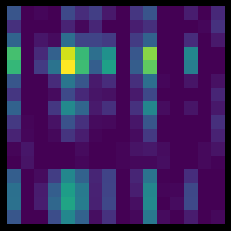

lstm feature map


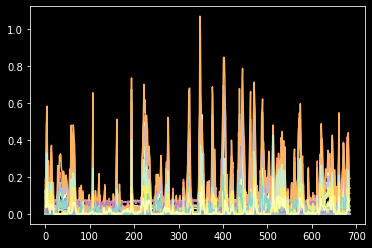

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1525

x = reshaped : (1373, 36, 1)
x = reshaped : (152, 36, 1)
Epoch 71: early stopping
train iteration:2 - fold:1  ----->  0.7916970252990723
valid iteration:2 - fold:1  ----->  0.7960526347160339
test iteration:2 - fold:1  ----->  0.7125
(8, 8)


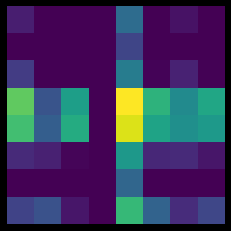

(16, 16)


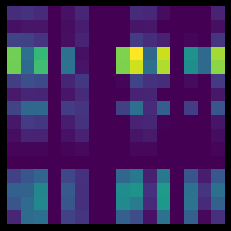

lstm feature map


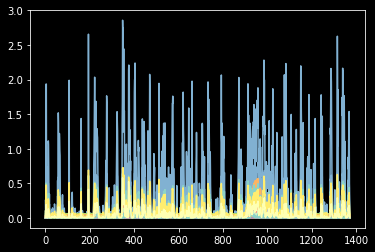

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2288

x = reshaped : (2060, 36, 1)
x = reshaped : (228, 36, 1)
Epoch 62: early stopping
train iteration:2 - fold:2  ----->  0.7635922431945801
valid iteration:2 - fold:2  ----->  0.7280701994895935
test iteration:2 - fold:2  ----->  0.7828125
(8, 8)


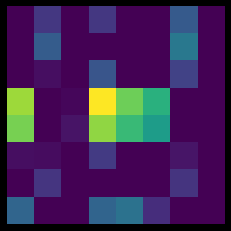

(16, 16)


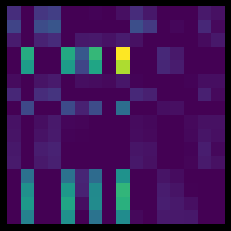

lstm feature map


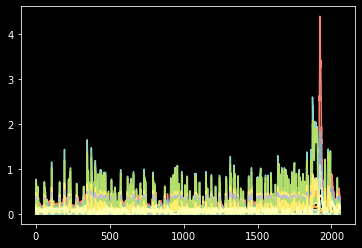

-----------


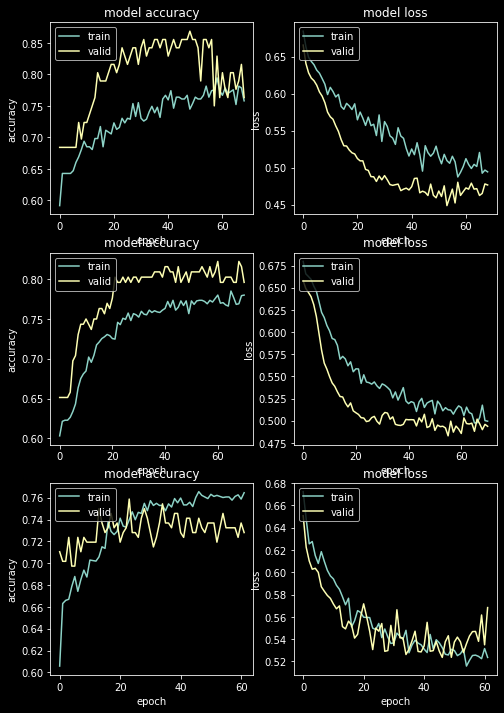






.................................................................
........................... step 3 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 762

x = reshaped : (686, 36, 1)
x = reshaped : (76, 36, 1)
Epoch 84: early stopping
train iteration:3 - fold:0  ----->  0.7988338470458984
valid iteration:3 - fold:0  ----->  0.7894737124443054
test iteration:3 - fold:0  ----->  0.7
(8, 8)


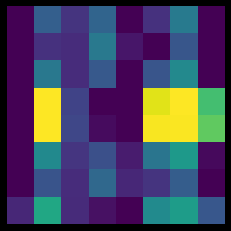

(16, 16)


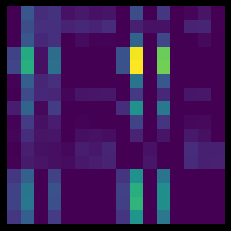

lstm feature map


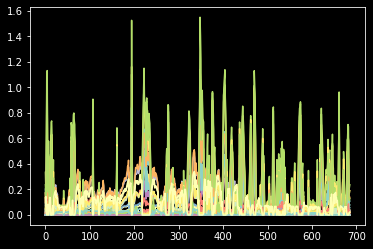

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1525

x = reshaped : (1373, 36, 1)
x = reshaped : (152, 36, 1)
Epoch 51: early stopping
train iteration:3 - fold:1  ----->  0.789512038230896
valid iteration:3 - fold:1  ----->  0.7828947305679321
test iteration:3 - fold:1  ----->  0.696875
(8, 8)


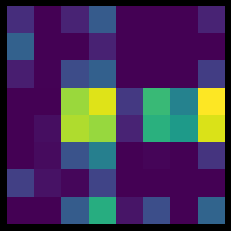

(16, 16)


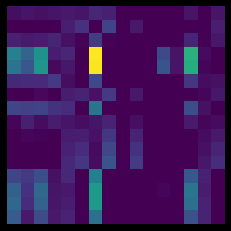

lstm feature map


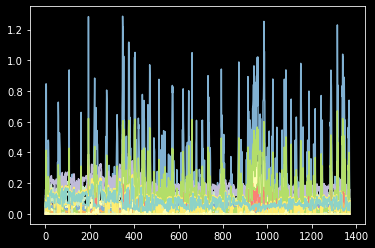

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2288

x = reshaped : (2060, 36, 1)
x = reshaped : (228, 36, 1)
Epoch 52: early stopping
train iteration:3 - fold:2  ----->  0.7650485634803772
valid iteration:3 - fold:2  ----->  0.7675438523292542
test iteration:3 - fold:2  ----->  0.75
(8, 8)


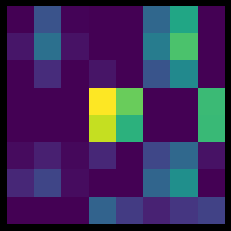

(16, 16)


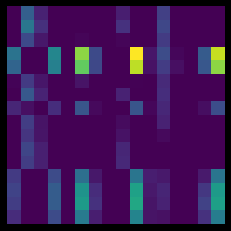

lstm feature map


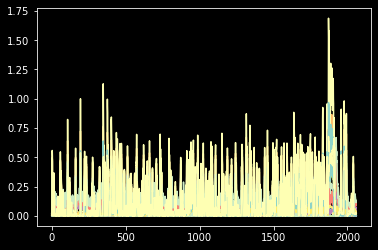

-----------


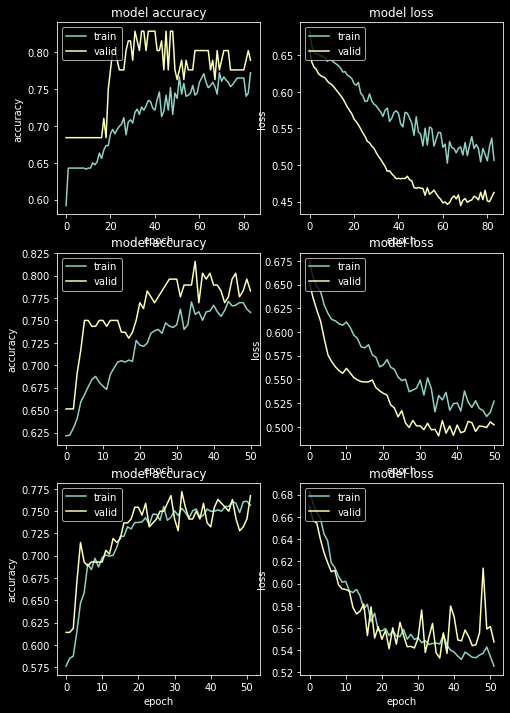






.................................................................
........................... step 4 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 762

x = reshaped : (686, 36, 1)
x = reshaped : (76, 36, 1)
Epoch 81: early stopping
train iteration:4 - fold:0  ----->  0.8002915382385254
valid iteration:4 - fold:0  ----->  0.8157894611358643
test iteration:4 - fold:0  ----->  0.6953125
(8, 8)


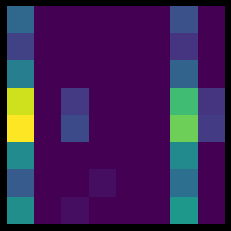

(16, 16)


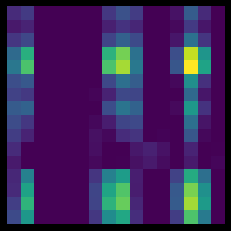

lstm feature map


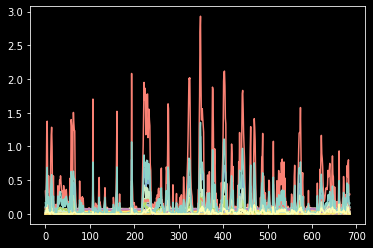

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1525

x = reshaped : (1373, 36, 1)
x = reshaped : (152, 36, 1)
Epoch 63: early stopping
train iteration:4 - fold:1  ----->  0.7916970252990723
valid iteration:4 - fold:1  ----->  0.7763158082962036
test iteration:4 - fold:1  ----->  0.6703125
(8, 8)


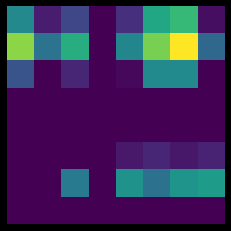

(16, 16)


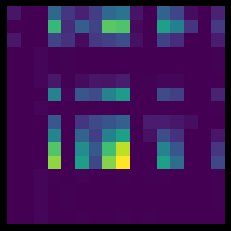

lstm feature map


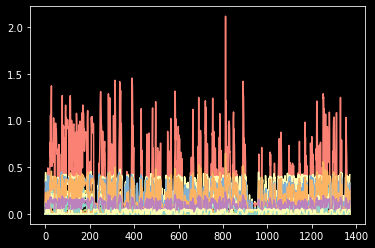

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2288

x = reshaped : (2060, 36, 1)
x = reshaped : (228, 36, 1)
Epoch 67: early stopping
train iteration:4 - fold:2  ----->  0.7737864255905151
valid iteration:4 - fold:2  ----->  0.7368420958518982
test iteration:4 - fold:2  ----->  0.6671875
(8, 8)


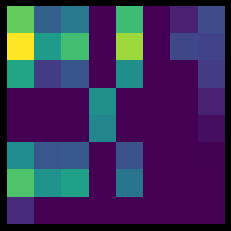

(16, 16)


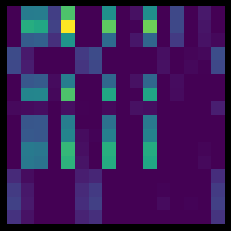

lstm feature map


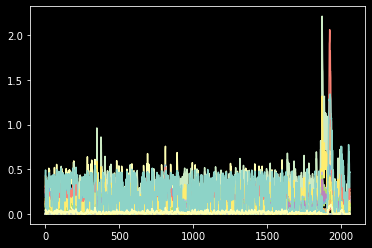

-----------


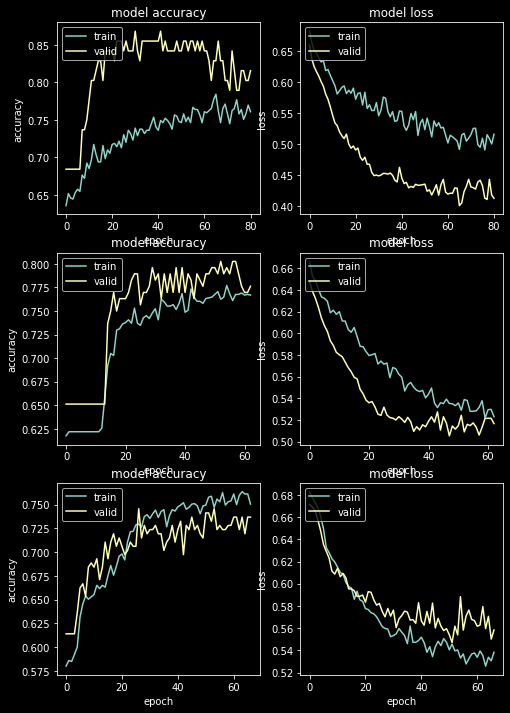






.................................................................
........................... step 5 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 762

x = reshaped : (686, 36, 1)
x = reshaped : (76, 36, 1)
train iteration:5 - fold:0  ----->  0.8104956150054932
valid iteration:5 - fold:0  ----->  0.8026315569877625
test iteration:5 - fold:0  ----->  0.6484375
(8, 8)


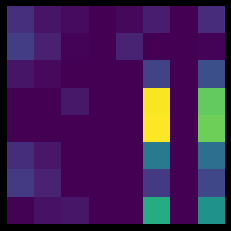

(16, 16)


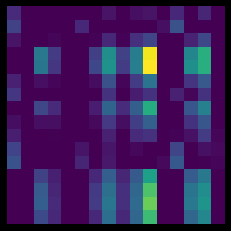

lstm feature map


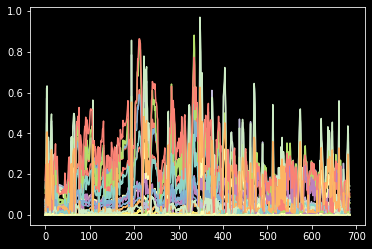

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1525

x = reshaped : (1373, 36, 1)
x = reshaped : (152, 36, 1)
train iteration:5 - fold:1  ----->  0.7916970252990723
valid iteration:5 - fold:1  ----->  0.7697368264198303
test iteration:5 - fold:1  ----->  0.6875
(8, 8)


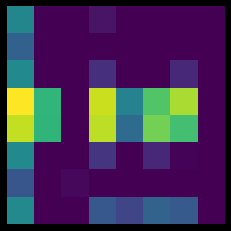

(16, 16)


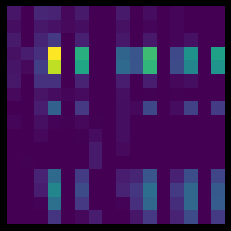

lstm feature map


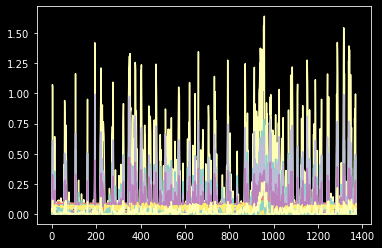

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2288

x = reshaped : (2060, 36, 1)
x = reshaped : (228, 36, 1)
Epoch 70: early stopping
train iteration:5 - fold:2  ----->  0.7393203973770142
valid iteration:5 - fold:2  ----->  0.6973684430122375
test iteration:5 - fold:2  ----->  0.7640625
(8, 8)


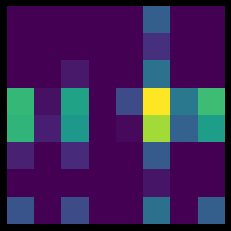

(16, 16)


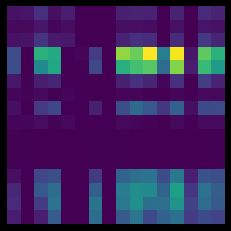

lstm feature map


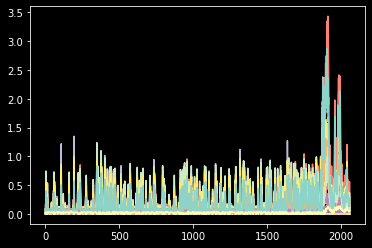

-----------


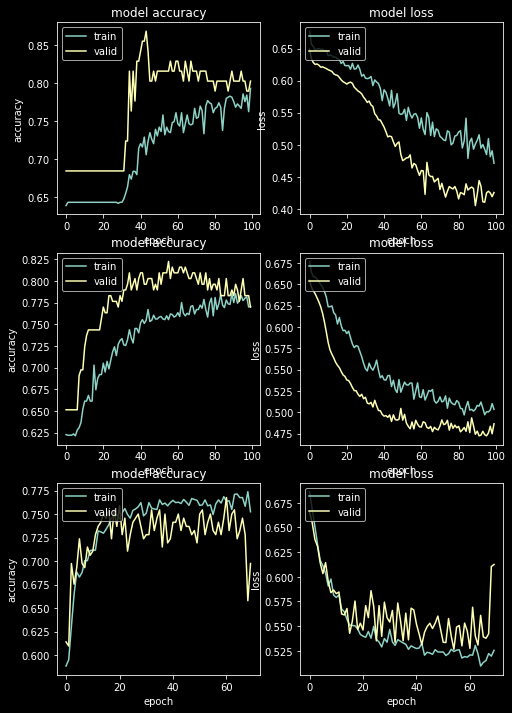





columns in order left to right : train , validation , test accuracies
rows : steps


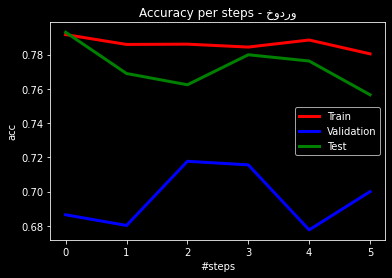

---------- Report ---------- 

mean train accueacies over 6 model training ------ >> 0.7862462268935309
mean validation accuracies over 6 model training ------ >> 0.6962673611111111
mean test accuracies over 6 model training ------ >> 0.7729044821527268


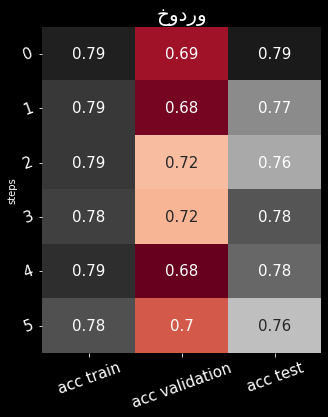

selected model : 2


In [ ]:
predictionskhodro,TestYkhodro  = Training(file_paths[3] , counts=6 , k=3)
khodro = Build_Labels_DF(file_paths[3] , date_path ,predictionskhodro)


---------------------------------------------------------------کروی------------------------------------------------------------
-1    1242
 1    1211
Name: Label, dtype: int64
(2453, 37)
shape x : (2453, 36)
shape y : (2453,)
700
(700, 36, 1)

.................................................................
........................... step 0 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 816
xtrain normalized : 
[[-1.08275361 -0.31528794  0.28488482 ... -1.16507947 -1.07651575
   0.90833322]
 [-1.15465677 -0.47270617  0.21500126 ... -1.16000634 -1.13169985
   0.25841586]
 [-1.18995469 -0.31807163  0.11501998 ... -1.16602438 -1.17645546
  -0.10095685]
 ...
 [ 1.31144091  0.5131534  -0.1552087  ...  1.00858628  1.26423302
   0.23713055]
 [ 1.28053233 -0.22305071 -0.06365171 ...  1.01845413  1.28670556
   0.1075632 ]
 [ 1.26507803 -0.34743029

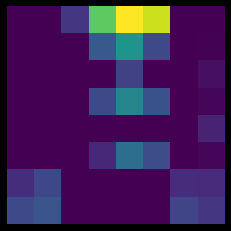

(16, 16)


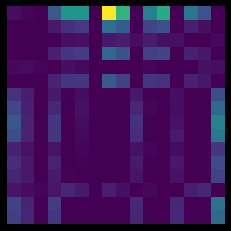

lstm feature map


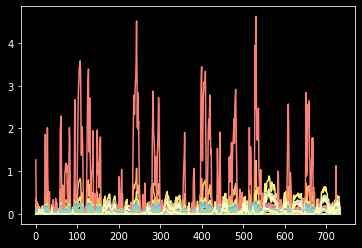

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1633
xtrain normalized : 
[[-1.0986648  -0.31461013  0.20769494 ... -1.17048043 -1.09588966
   0.97474304]
 [-1.14451704 -0.49753388  0.1453292  ... -1.16714478 -1.13112202
   0.28164885]
 [-1.16702632 -0.31784485  0.05610354 ... -1.17110172 -1.15969628
  -0.10159856]
 ...
 [ 3.45056689  1.18739828  3.20953259 ...  3.52620911  3.49186401
   0.47249053]
 [ 3.26826539  0.82079569  2.51300561 ...  3.47467004  3.33363235
  -0.19734536]
 [ 3.35789696  0.37084843  2.12715118 ...  3.39121345  3.33818214
  -0.08458107]]

x = reshaped : (1470, 36, 1)
x = reshaped : (163, 36, 1)
Epoch 59: early stopping
train iteration:0 - fold:1  ----->  0.7884353995323181
valid iteration:0 - fold:1  ----->  0.7239263653755188
test iteration:0 - fold:1  ----->  0.7428571428571429
(8, 8)


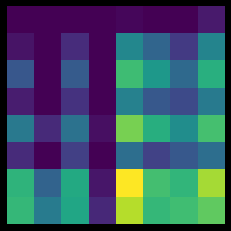

(16, 16)


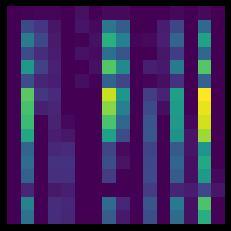

lstm feature map


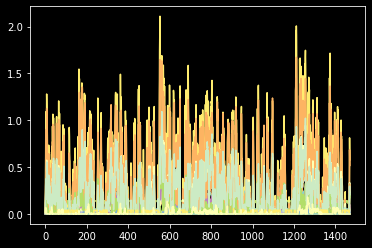

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2450
xtrain normalized : 
[[-0.47054134 -0.41410637 -0.04990883 ... -0.46075267 -0.47026057
   0.71385793]
 [-0.47286329 -0.59006491 -0.05331317 ... -0.46059993 -0.47204576
   0.16161553]
 [-0.47400316 -0.41721792 -0.05818371 ... -0.46078112 -0.47349359
  -0.14374767]
 ...
 [ 2.05509548 -0.66237051  0.56816197 ...  1.85695244  2.05231227
   0.22677896]
 [ 2.05242175 -0.67105983  0.48968335 ...  1.85551028  2.04964156
   0.11437702]
 [ 2.05153051 -0.67216295  0.41962129 ...  1.85514735  2.04875132
   0.03222273]]

x = reshaped : (2205, 36, 1)
x = reshaped : (245, 36, 1)
Epoch 40: early stopping
train iteration:0 - fold:2  ----->  0.7714285850524902
valid iteration:0 - fold:2  ----->  0.7836734652519226
test iteration:0 - fold:2  ----->  0.7328571428571429
(8, 8)


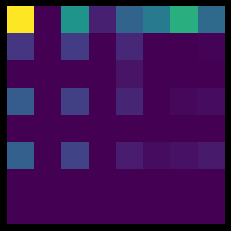

(16, 16)


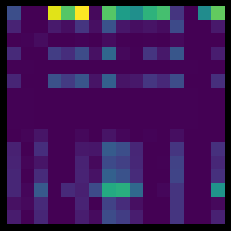

lstm feature map


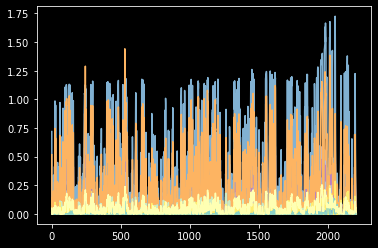

-----------


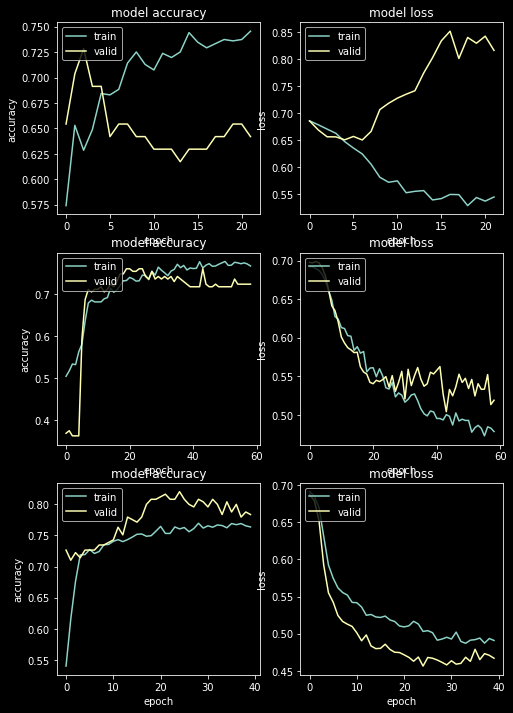






.................................................................
........................... step 1 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 816

x = reshaped : (735, 36, 1)
x = reshaped : (81, 36, 1)
Epoch 21: early stopping
train iteration:1 - fold:0  ----->  0.75782310962677
valid iteration:1 - fold:0  ----->  0.654321014881134
test iteration:1 - fold:0  ----->  0.7257142857142858
(8, 8)


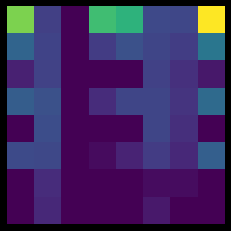

(16, 16)


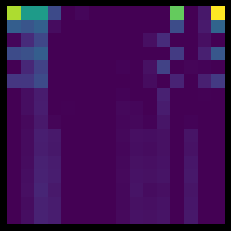

lstm feature map


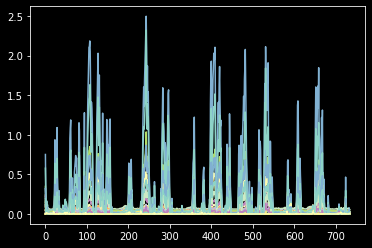

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1633

x = reshaped : (1470, 36, 1)
x = reshaped : (163, 36, 1)
Epoch 52: early stopping
train iteration:1 - fold:1  ----->  0.8047618865966797
valid iteration:1 - fold:1  ----->  0.7177914381027222
test iteration:1 - fold:1  ----->  0.7542857142857143
(8, 8)


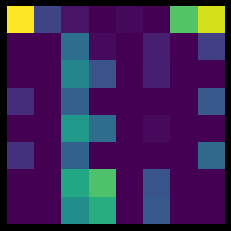

(16, 16)


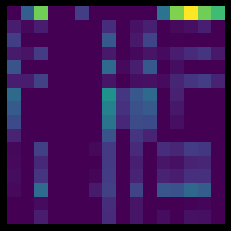

lstm feature map


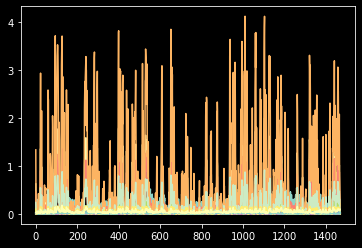

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2450

x = reshaped : (2205, 36, 1)
x = reshaped : (245, 36, 1)
Epoch 52: early stopping
train iteration:1 - fold:2  ----->  0.7841269969940186
valid iteration:1 - fold:2  ----->  0.7795918583869934
test iteration:1 - fold:2  ----->  0.7528571428571429
(8, 8)


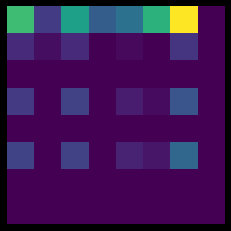

(16, 16)


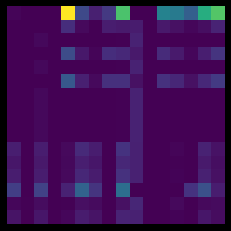

lstm feature map


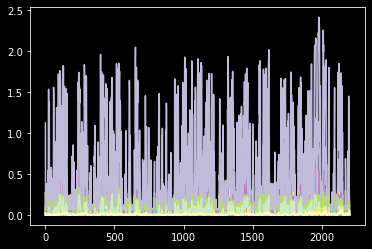

-----------


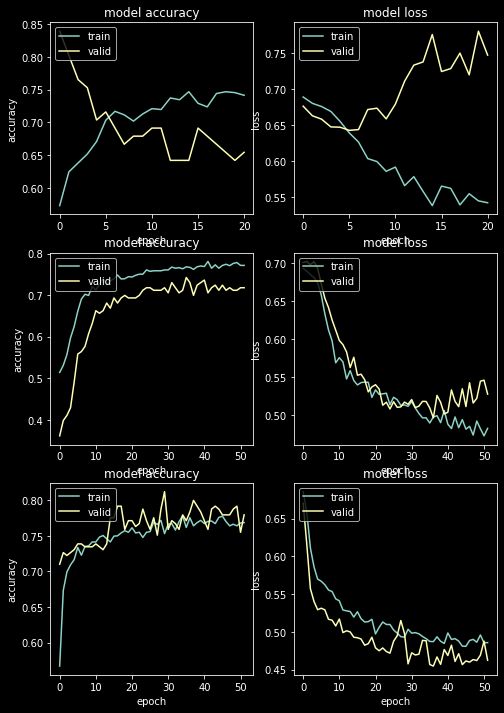






.................................................................
........................... step 2 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 816

x = reshaped : (735, 36, 1)
x = reshaped : (81, 36, 1)
Epoch 21: early stopping
train iteration:2 - fold:0  ----->  0.75782310962677
valid iteration:2 - fold:0  ----->  0.6419752836227417
test iteration:2 - fold:0  ----->  0.7328571428571429
(8, 8)


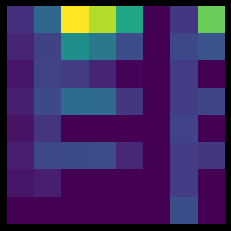

(16, 16)


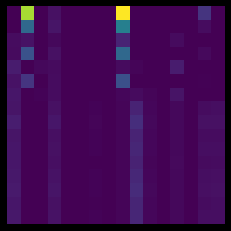

lstm feature map


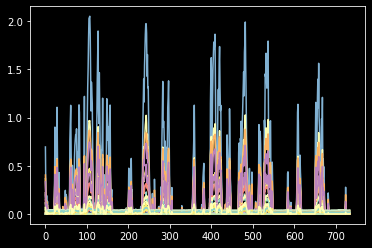

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1633

x = reshaped : (1470, 36, 1)
x = reshaped : (163, 36, 1)
Epoch 37: early stopping
train iteration:2 - fold:1  ----->  0.7809523940086365
valid iteration:2 - fold:1  ----->  0.7239263653755188
test iteration:2 - fold:1  ----->  0.7328571428571429
(8, 8)


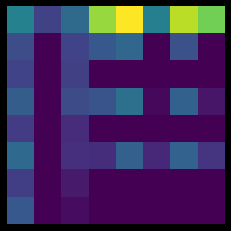

(16, 16)


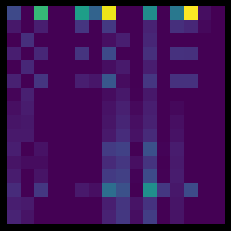

lstm feature map


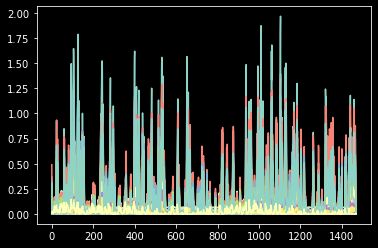

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2450

x = reshaped : (2205, 36, 1)
x = reshaped : (245, 36, 1)
Epoch 32: early stopping
train iteration:2 - fold:2  ----->  0.7755101919174194
valid iteration:2 - fold:2  ----->  0.718367338180542
test iteration:2 - fold:2  ----->  0.7514285714285714
(8, 8)


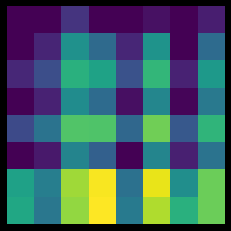

(16, 16)


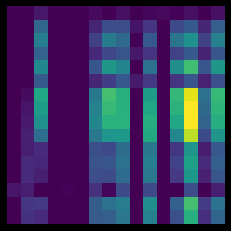

lstm feature map


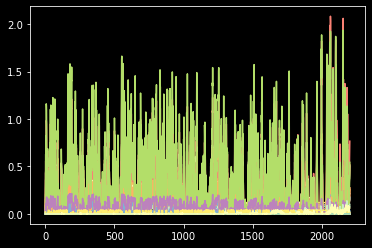

-----------


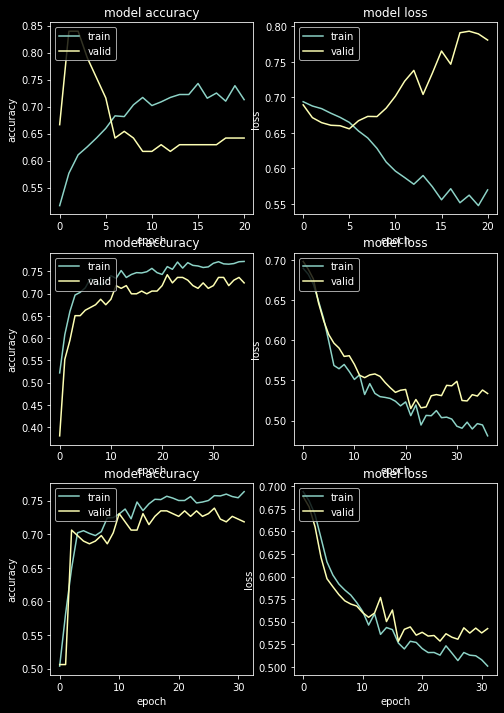






.................................................................
........................... step 3 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 816

x = reshaped : (735, 36, 1)
x = reshaped : (81, 36, 1)
Epoch 28: early stopping
train iteration:3 - fold:0  ----->  0.7591836452484131
valid iteration:3 - fold:0  ----->  0.604938268661499
test iteration:3 - fold:0  ----->  0.75
(8, 8)


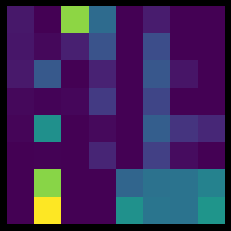

(16, 16)


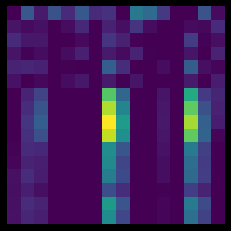

lstm feature map


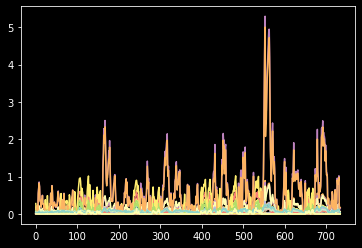

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1633

x = reshaped : (1470, 36, 1)
x = reshaped : (163, 36, 1)
Epoch 38: early stopping
train iteration:3 - fold:1  ----->  0.7809523940086365
valid iteration:3 - fold:1  ----->  0.7300613522529602
test iteration:3 - fold:1  ----->  0.7442857142857143
(8, 8)


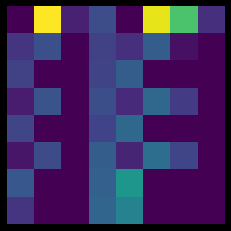

(16, 16)


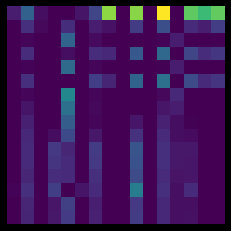

lstm feature map


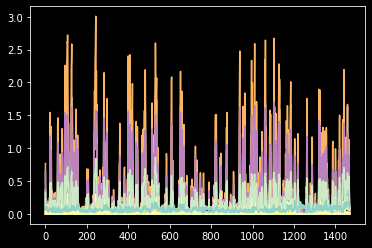

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2450

x = reshaped : (2205, 36, 1)
x = reshaped : (245, 36, 1)
Epoch 68: early stopping
train iteration:3 - fold:2  ----->  0.7850340008735657
valid iteration:3 - fold:2  ----->  0.7591836452484131
test iteration:3 - fold:2  ----->  0.7371428571428571
(8, 8)


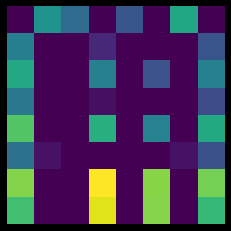

(16, 16)


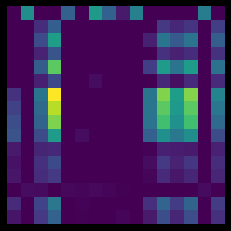

lstm feature map


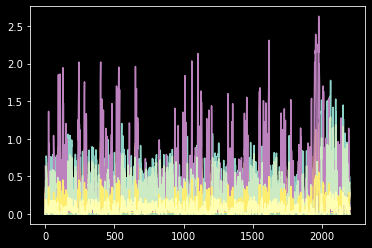

-----------


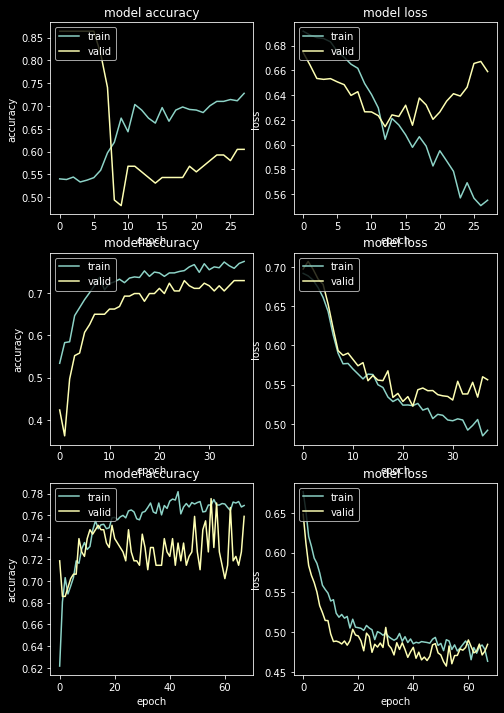






.................................................................
........................... step 4 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 816

x = reshaped : (735, 36, 1)
x = reshaped : (81, 36, 1)
Epoch 26: early stopping
train iteration:4 - fold:0  ----->  0.756462574005127
valid iteration:4 - fold:0  ----->  0.654321014881134
test iteration:4 - fold:0  ----->  0.7357142857142858
(8, 8)


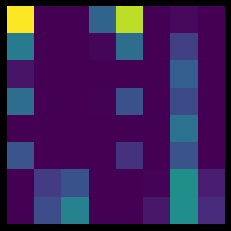

(16, 16)


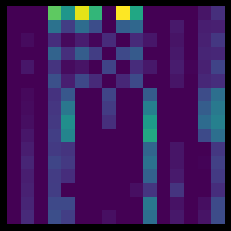

lstm feature map


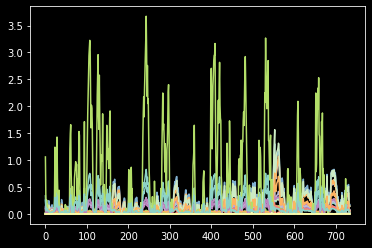

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1633

x = reshaped : (1470, 36, 1)
x = reshaped : (163, 36, 1)
Epoch 67: early stopping
train iteration:4 - fold:1  ----->  0.7884353995323181
valid iteration:4 - fold:1  ----->  0.7423312664031982
test iteration:4 - fold:1  ----->  0.7414285714285714
(8, 8)


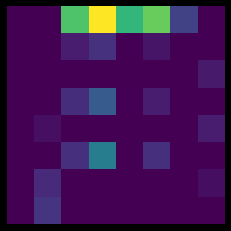

(16, 16)


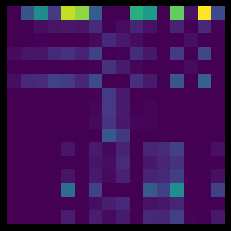

lstm feature map


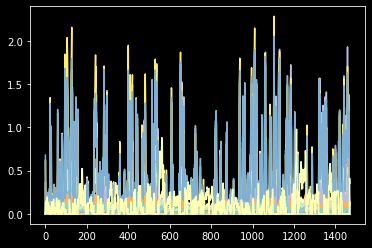

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2450

x = reshaped : (2205, 36, 1)
x = reshaped : (245, 36, 1)
Epoch 76: early stopping
train iteration:4 - fold:2  ----->  0.7800453305244446
valid iteration:4 - fold:2  ----->  0.7142857313156128
test iteration:4 - fold:2  ----->  0.7328571428571429
(8, 8)


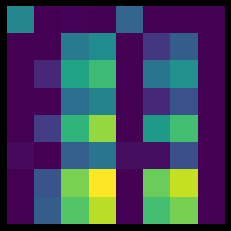

(16, 16)


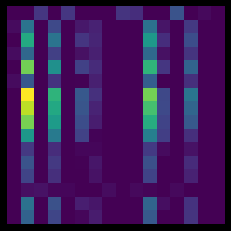

lstm feature map


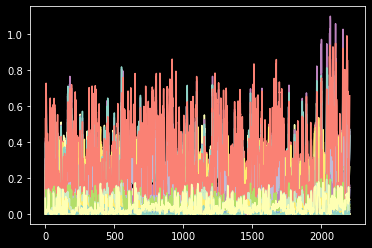

-----------


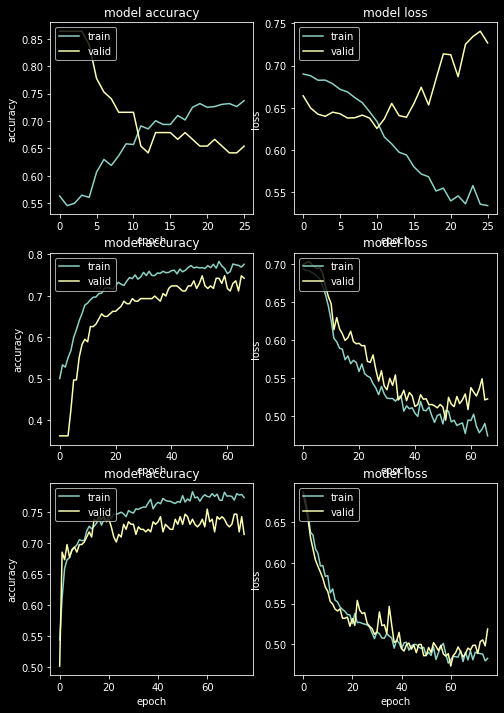






.................................................................
........................... step 5 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 816

x = reshaped : (735, 36, 1)
x = reshaped : (81, 36, 1)
Epoch 22: early stopping
train iteration:5 - fold:0  ----->  0.7510204315185547
valid iteration:5 - fold:0  ----->  0.6666666865348816
test iteration:5 - fold:0  ----->  0.7342857142857143
(8, 8)


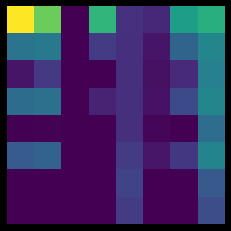

(16, 16)


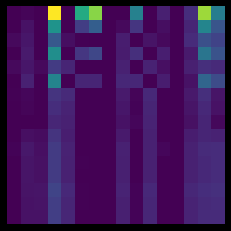

lstm feature map


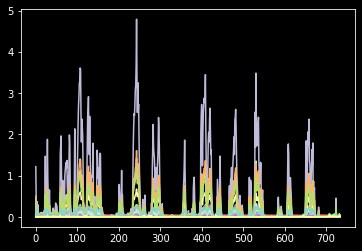

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1633

x = reshaped : (1470, 36, 1)
x = reshaped : (163, 36, 1)
Epoch 44: early stopping
train iteration:5 - fold:1  ----->  0.7952380776405334
valid iteration:5 - fold:1  ----->  0.699386477470398
test iteration:5 - fold:1  ----->  0.7428571428571429
(8, 8)


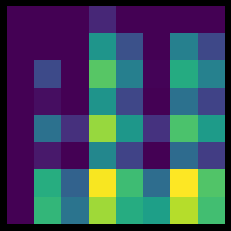

(16, 16)


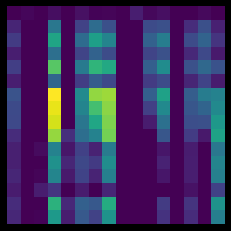

lstm feature map


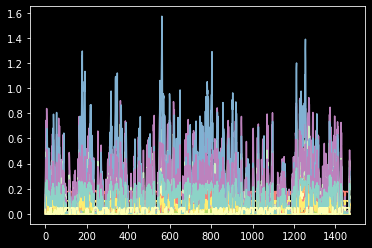

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2450

x = reshaped : (2205, 36, 1)
x = reshaped : (245, 36, 1)
Epoch 58: early stopping
train iteration:5 - fold:2  ----->  0.7827664613723755
valid iteration:5 - fold:2  ----->  0.7428571581840515
test iteration:5 - fold:2  ----->  0.7685714285714286
(8, 8)


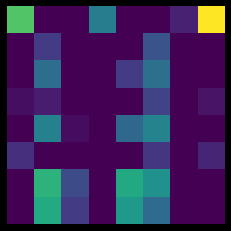

(16, 16)


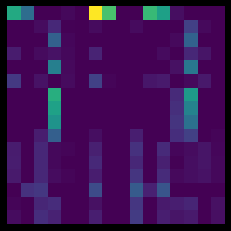

lstm feature map


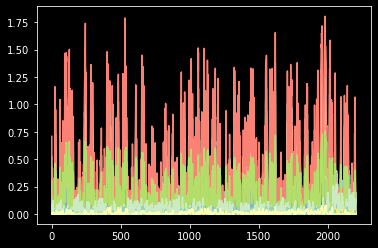

-----------


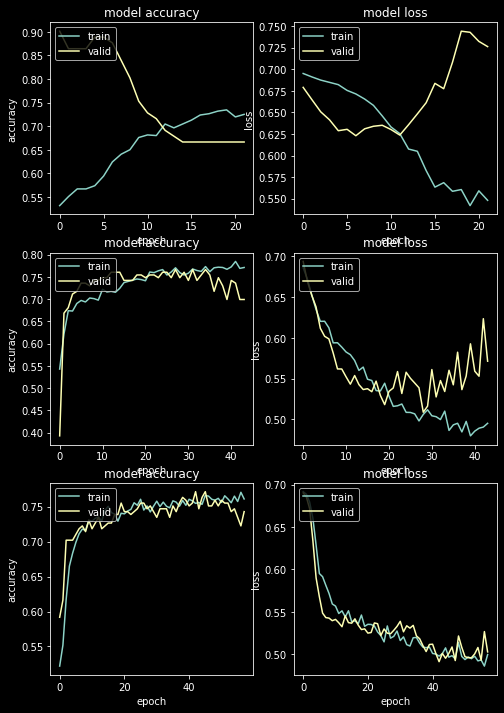





columns in order left to right : train , validation , test accuracies
rows : steps


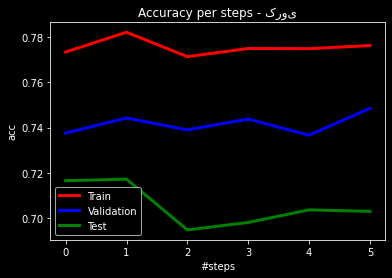

---------- Report ---------- 

mean train accueacies over 6 model training ------ >> 0.7755857904752096
mean validation accuracies over 6 model training ------ >> 0.7416666666666667
mean test accuracies over 6 model training ------ >> 0.7055322229862213


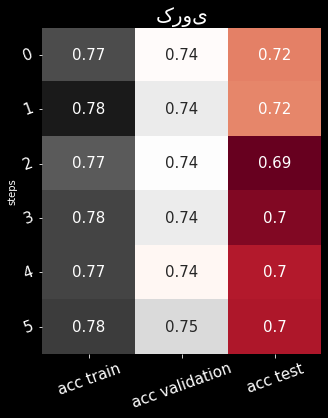

selected model : 5


In [ ]:
predictionskerooy ,TestYkerooy= Training(file_paths[8] , counts=6 , k=3)
kerooy = Build_Labels_DF(file_paths[8] , date_path ,predictionskerooy)


---------------------------------------------------------------خساپا------------------------------------------------------------
-1    1284
 1     960
Name: Label, dtype: int64
(2244, 37)
shape x : (2244, 36)
shape y : (2244,)
637
(637, 36, 1)

.................................................................
........................... step 0 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 747
xtrain normalized : 
[[-0.13901113 -0.35121747  0.00792789 ... -0.11831221 -0.11559543
  -0.18232199]
 [-0.14176509 -0.33490293 -0.06756132 ... -0.11966557 -0.15318185
  -0.23145136]
 [-0.10458668 -0.31719451 -0.06845039 ... -0.12411717 -0.10367778
  -0.09708731]
 ...
 [ 1.72625536 -0.19553631 -0.10200011 ...  1.54227401  1.70172921
   0.25461403]
 [ 1.62535409 -0.34759234 -0.11430556 ...  1.5228402   1.64686847
  -0.0422141 ]
 [ 1.54799645 -0.231256 

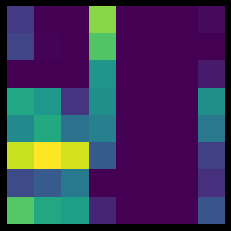

(16, 16)


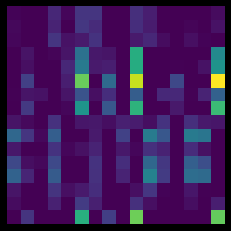

lstm feature map


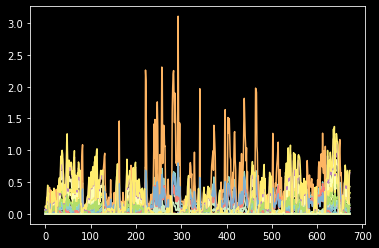

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1495
xtrain normalized : 
[[-0.71951703 -0.47421345 -0.00493653 ... -0.6979253  -0.7106362
  -0.15225219]
 [-0.72054538 -0.46472404 -0.03656319 ... -0.69841393 -0.72464089
  -0.193266  ]
 [-0.70666273 -0.45442387 -0.03693567 ... -0.70002119 -0.70619569
  -0.08109722]
 ...
 [ 0.67699261 -0.26748505 -0.95421628 ...  0.73994488  0.67261235
  -0.6116401 ]
 [ 0.63431423 -0.01018807 -0.96895514 ...  0.71377134  0.64615016
  -0.71598824]
 [ 0.6200881  -0.19328144 -0.97366613 ...  0.68995602  0.62252321
  -0.68694741]]

x = reshaped : (1346, 36, 1)
x = reshaped : (149, 36, 1)
Epoch 74: early stopping
train iteration:0 - fold:1  ----->  0.8276374340057373
valid iteration:0 - fold:1  ----->  0.8255033493041992
test iteration:0 - fold:1  ----->  0.7786499215070644
(8, 8)


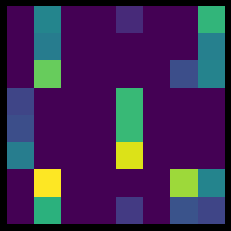

(16, 16)


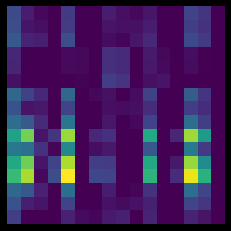

lstm feature map


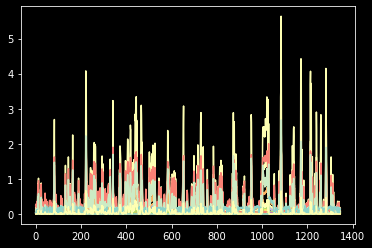

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2243
xtrain normalized : 
[[-0.41446345 -0.37244435 -0.06486634 ... -0.40030309 -0.41359004
  -0.20231135]
 [-0.41455558 -0.37085817 -0.06749532 ... -0.40034422 -0.41484546
  -0.23534336]
 [-0.4133119  -0.36913647 -0.06752629 ... -0.4004795  -0.41319199
  -0.14500402]
 ...
 [ 2.57540184  2.56600538  0.61826688 ...  2.36612133  2.56675654
   0.06664489]
 [ 2.4992294   0.2843002   0.42178952 ...  2.34910919  2.53721913
  -0.26091648]
 [ 2.48653399 -0.03551183  0.25932852 ...  2.30021242  2.47814432
  -0.38856718]]

x = reshaped : (2019, 36, 1)
x = reshaped : (224, 36, 1)
Epoch 35: early stopping
train iteration:0 - fold:2  ----->  0.7914809584617615
valid iteration:0 - fold:2  ----->  0.7276785969734192
test iteration:0 - fold:2  ----->  0.8084772370486656
(8, 8)


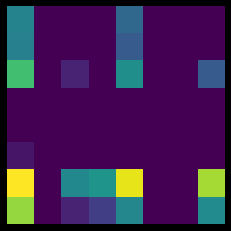

(16, 16)


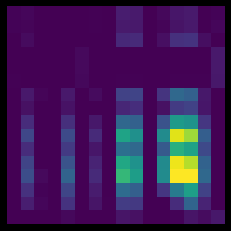

lstm feature map


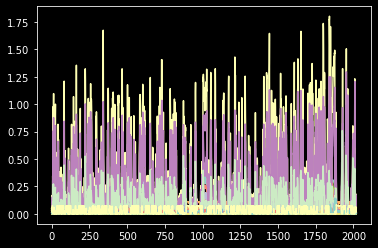

-----------


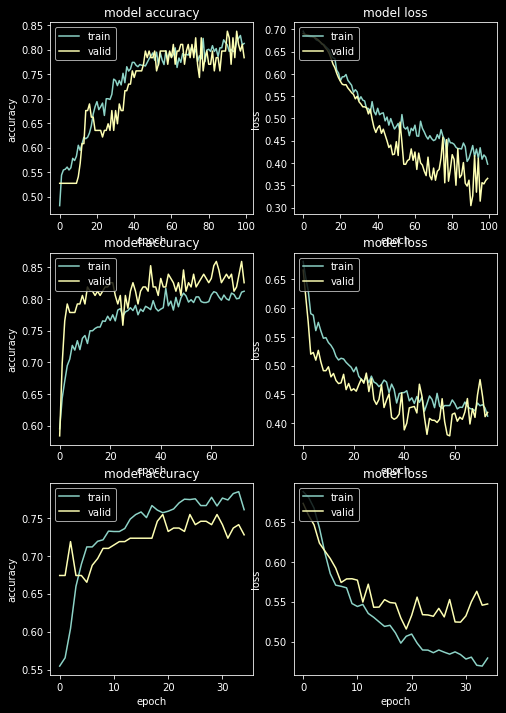






.................................................................
........................... step 1 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 747

x = reshaped : (673, 36, 1)
x = reshaped : (74, 36, 1)
train iteration:1 - fold:0  ----->  0.8514115810394287
valid iteration:1 - fold:0  ----->  0.8243243098258972
test iteration:1 - fold:0  ----->  0.7566718995290423
(8, 8)


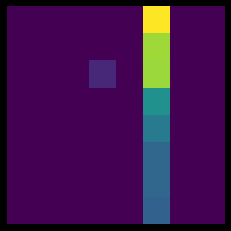

(16, 16)


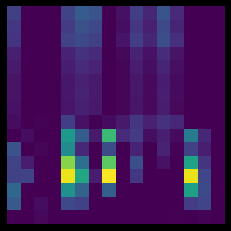

lstm feature map


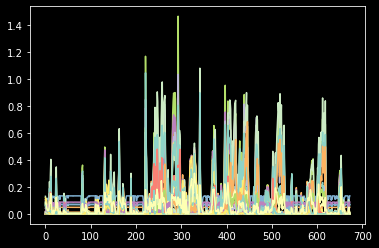

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1495

x = reshaped : (1346, 36, 1)
x = reshaped : (149, 36, 1)
Epoch 41: early stopping
train iteration:1 - fold:1  ----->  0.8046062588691711
valid iteration:1 - fold:1  ----->  0.7986577153205872
test iteration:1 - fold:1  ----->  0.7864992150706437
(8, 8)


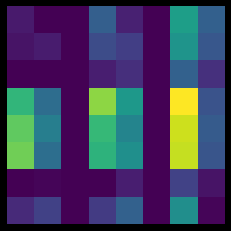

(16, 16)


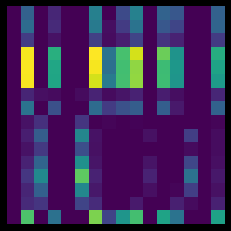

lstm feature map


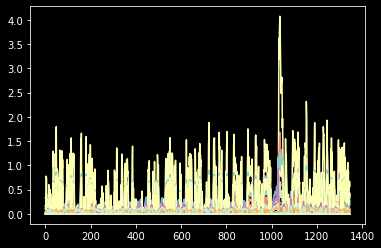

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2243

x = reshaped : (2019, 36, 1)
x = reshaped : (224, 36, 1)
Epoch 38: early stopping
train iteration:1 - fold:2  ----->  0.7835562229156494
valid iteration:1 - fold:2  ----->  0.7857142686843872
test iteration:1 - fold:2  ----->  0.8006279434850864
(8, 8)


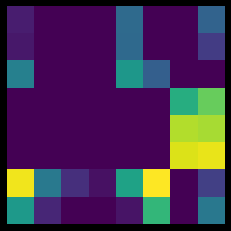

(16, 16)


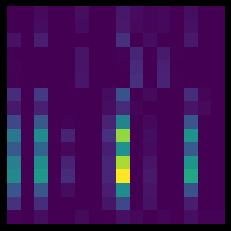

lstm feature map


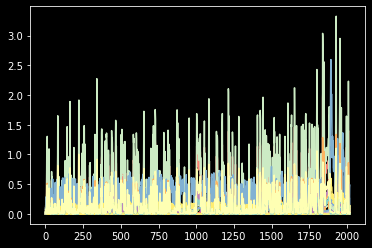

-----------


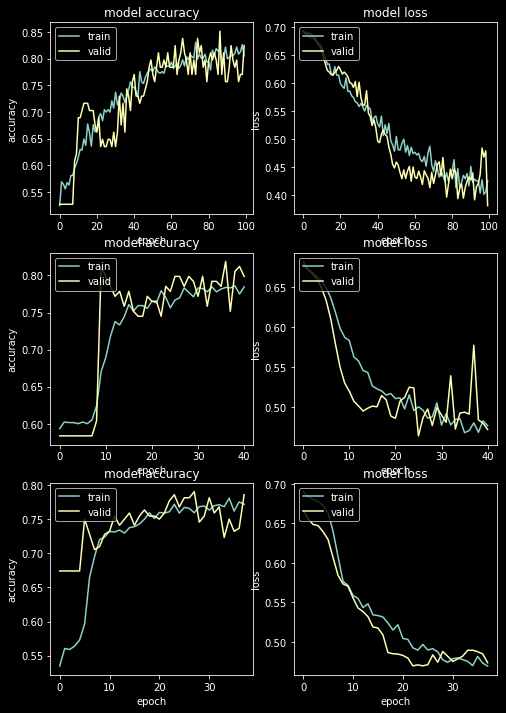






.................................................................
........................... step 2 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 747

x = reshaped : (673, 36, 1)
x = reshaped : (74, 36, 1)
Epoch 85: early stopping
train iteration:2 - fold:0  ----->  0.8543833494186401
valid iteration:2 - fold:0  ----->  0.8108108043670654
test iteration:2 - fold:0  ----->  0.7629513343799058
(8, 8)


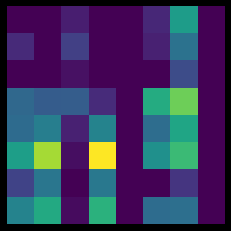

(16, 16)


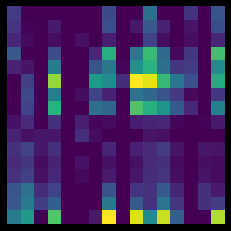

lstm feature map


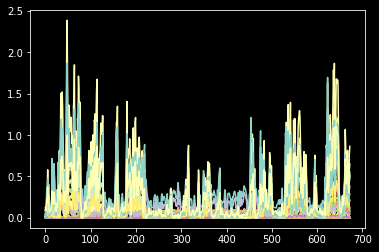

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1495

x = reshaped : (1346, 36, 1)
x = reshaped : (149, 36, 1)
Epoch 81: early stopping
train iteration:2 - fold:1  ----->  0.8283804059028625
valid iteration:2 - fold:1  ----->  0.818791925907135
test iteration:2 - fold:1  ----->  0.7786499215070644
(8, 8)


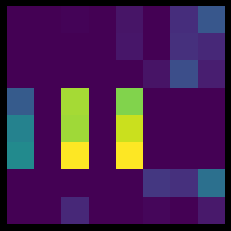

(16, 16)


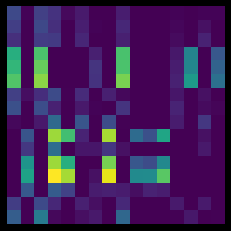

lstm feature map


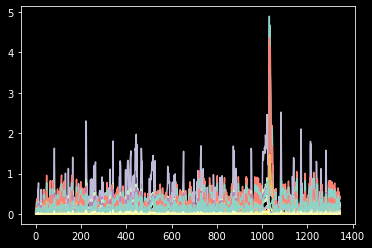

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2243

x = reshaped : (2019, 36, 1)
x = reshaped : (224, 36, 1)
Epoch 39: early stopping
train iteration:2 - fold:2  ----->  0.790985643863678
valid iteration:2 - fold:2  ----->  0.7142857313156128
test iteration:2 - fold:2  ----->  0.7896389324960753
(8, 8)


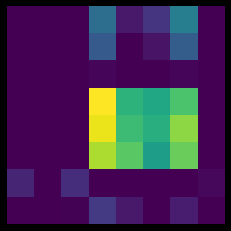

(16, 16)


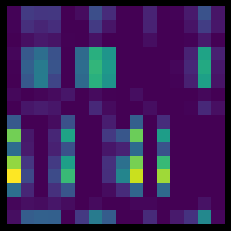

lstm feature map


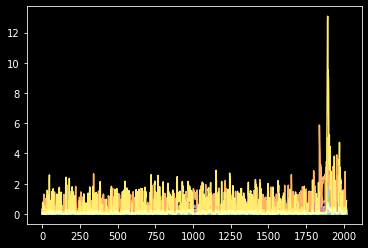

-----------


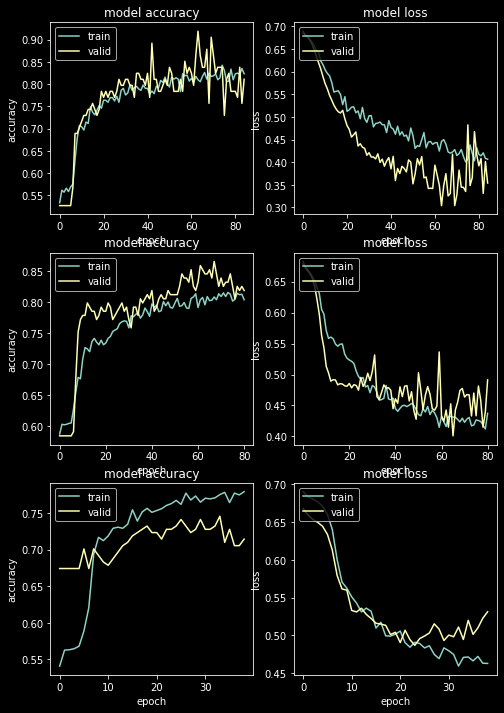






.................................................................
........................... step 3 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 747

x = reshaped : (673, 36, 1)
x = reshaped : (74, 36, 1)
train iteration:3 - fold:0  ----->  0.8469539284706116
valid iteration:3 - fold:0  ----->  0.8108108043670654
test iteration:3 - fold:0  ----->  0.7755102040816326
(8, 8)


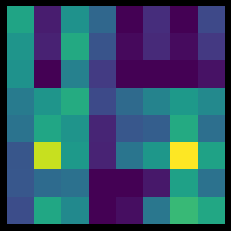

(16, 16)


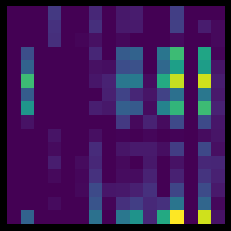

lstm feature map


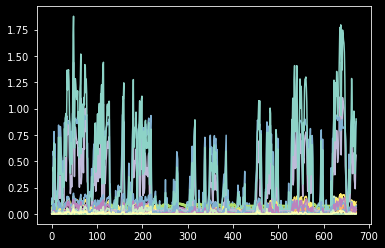

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1495

x = reshaped : (1346, 36, 1)
x = reshaped : (149, 36, 1)
Epoch 75: early stopping
train iteration:3 - fold:1  ----->  0.8298662900924683
valid iteration:3 - fold:1  ----->  0.8120805621147156
test iteration:3 - fold:1  ----->  0.7645211930926217
(8, 8)


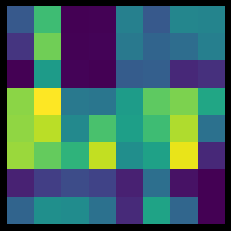

(16, 16)


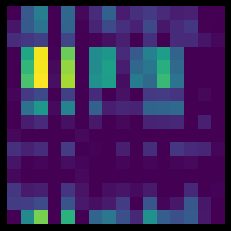

lstm feature map


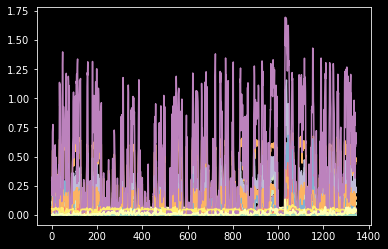

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2243

x = reshaped : (2019, 36, 1)
x = reshaped : (224, 36, 1)
Epoch 40: early stopping
train iteration:3 - fold:2  ----->  0.7984150648117065
valid iteration:3 - fold:2  ----->  0.6830357313156128
test iteration:3 - fold:2  ----->  0.8178963893249608
(8, 8)


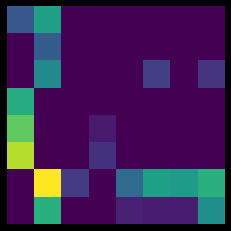

(16, 16)


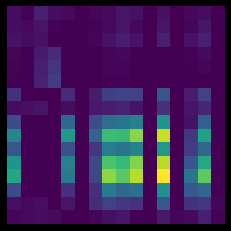

lstm feature map


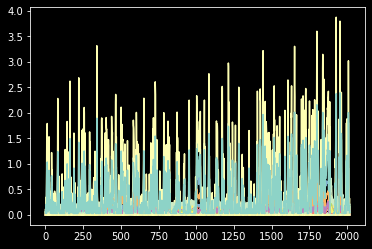

-----------


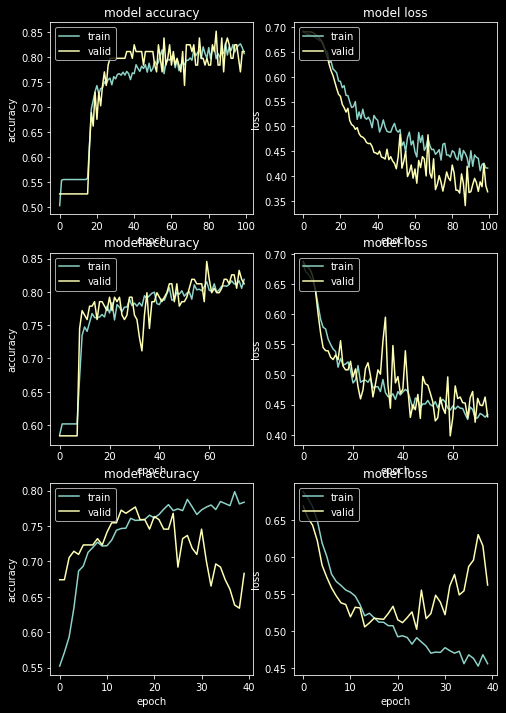






.................................................................
........................... step 4 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 747

x = reshaped : (673, 36, 1)
x = reshaped : (74, 36, 1)
train iteration:4 - fold:0  ----->  0.8454680442810059
valid iteration:4 - fold:0  ----->  0.7702702879905701
test iteration:4 - fold:0  ----->  0.7802197802197802
(8, 8)


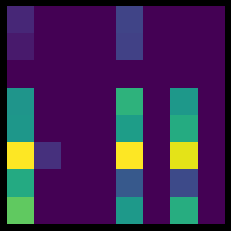

(16, 16)


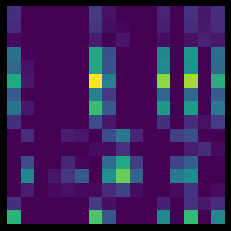

lstm feature map


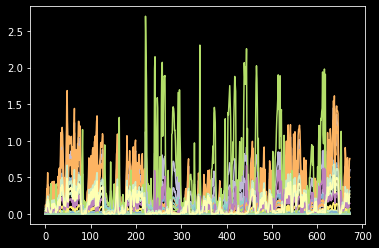

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1495

x = reshaped : (1346, 36, 1)
x = reshaped : (149, 36, 1)
Epoch 82: early stopping
train iteration:4 - fold:1  ----->  0.8410103917121887
valid iteration:4 - fold:1  ----->  0.7852349281311035
test iteration:4 - fold:1  ----->  0.7802197802197802
(8, 8)


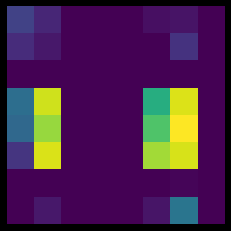

(16, 16)


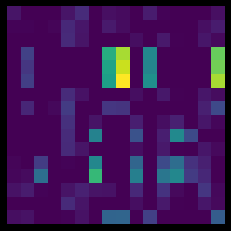

lstm feature map


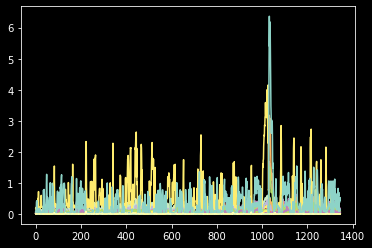

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2243

x = reshaped : (2019, 36, 1)
x = reshaped : (224, 36, 1)
Epoch 64: early stopping
train iteration:4 - fold:2  ----->  0.7959386110305786
valid iteration:4 - fold:2  ----->  0.7723214030265808
test iteration:4 - fold:2  ----->  0.8084772370486656
(8, 8)


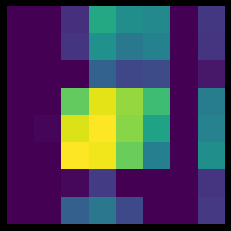

(16, 16)


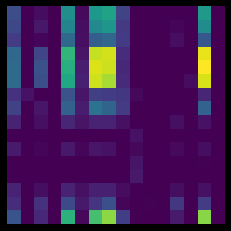

lstm feature map


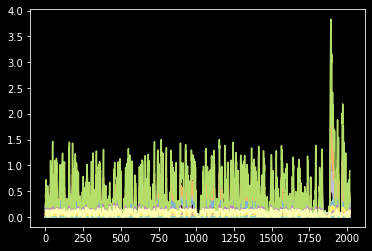

-----------


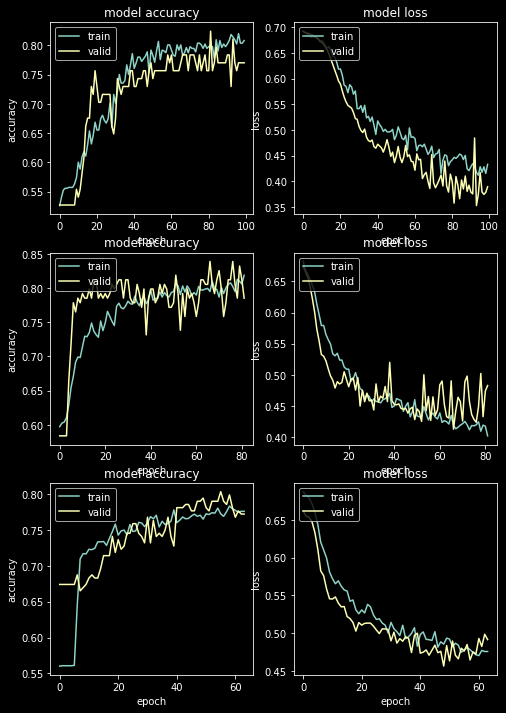






.................................................................
........................... step 5 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 747

x = reshaped : (673, 36, 1)
x = reshaped : (74, 36, 1)
Epoch 97: early stopping
train iteration:5 - fold:0  ----->  0.8573551177978516
valid iteration:5 - fold:0  ----->  0.7972972989082336
test iteration:5 - fold:0  ----->  0.7770800627943485
(8, 8)


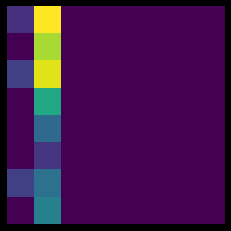

(16, 16)


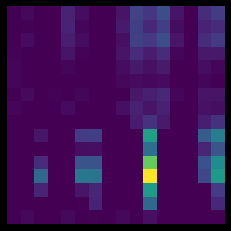

lstm feature map


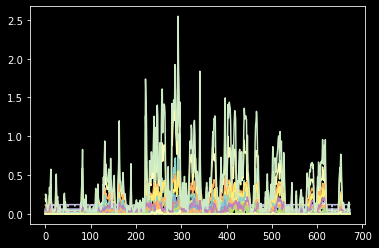

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1495

x = reshaped : (1346, 36, 1)
x = reshaped : (149, 36, 1)
Epoch 65: early stopping
train iteration:5 - fold:1  ----->  0.8231797814369202
valid iteration:5 - fold:1  ----->  0.8120805621147156
test iteration:5 - fold:1  ----->  0.7817896389324961
(8, 8)


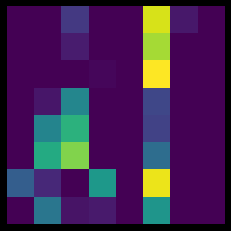

(16, 16)


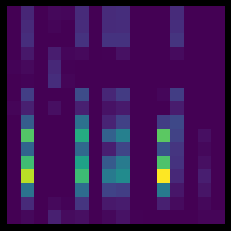

lstm feature map


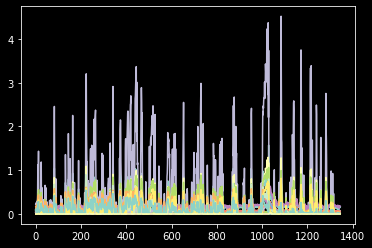

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2243

x = reshaped : (2019, 36, 1)
x = reshaped : (224, 36, 1)
Epoch 47: early stopping
train iteration:5 - fold:2  ----->  0.7890044450759888
valid iteration:5 - fold:2  ----->  0.7142857313156128
test iteration:5 - fold:2  ----->  0.8100470957613815
(8, 8)


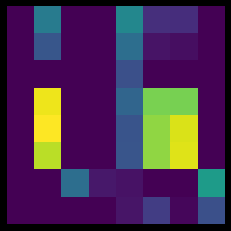

(16, 16)


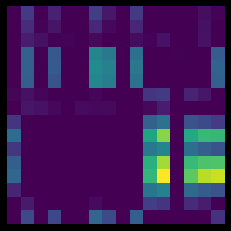

lstm feature map


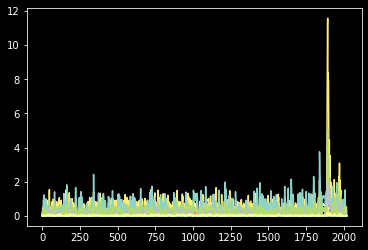

-----------


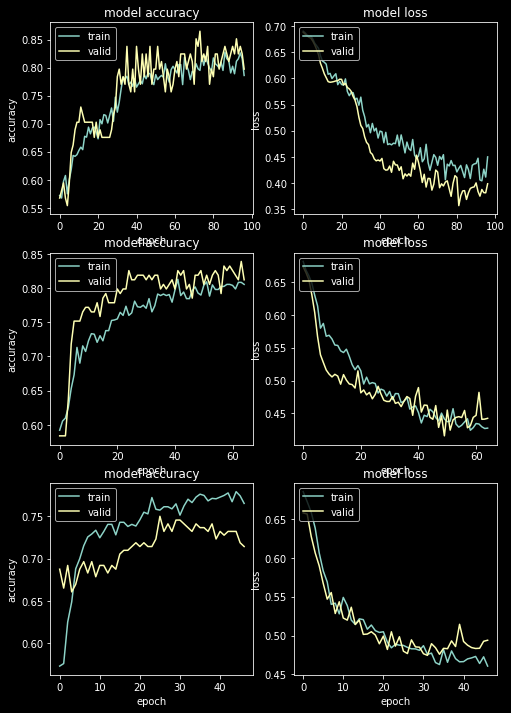





columns in order left to right : train , validation , test accuracies
rows : steps


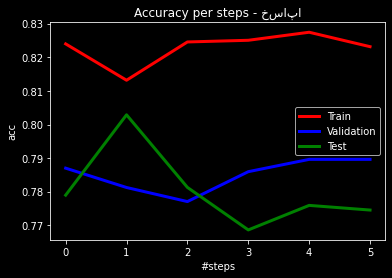

---------- Report ---------- 

mean train accueacies over 6 model training ------ >> 0.8229183885786268
mean validation accuracies over 6 model training ------ >> 0.7851037851037851
mean test accuracies over 6 model training ------ >> 0.7803871002462176


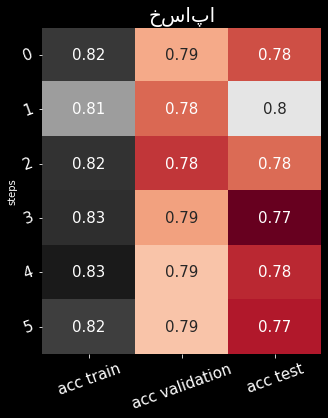

selected model : 1


In [ ]:
predictionskhesapa,TestYkhesapa  = Training(file_paths[6] , counts=6 , k=3)
khesapa = Build_Labels_DF(file_paths[6] , date_path ,predictionskhesapa)


---------------------------------------------------------------فلوله------------------------------------------------------------
-1    1272
 1     958
Name: Label, dtype: int64
(2230, 37)
shape x : (2230, 36)
shape y : (2230,)
624
(624, 36, 1)

.................................................................
........................... step 0 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 742
xtrain normalized : 
[[ 0.40921726 -0.60436904  0.71573246 ... -0.01676924  0.38884152
   1.03718681]
 [ 0.01156073 -0.60495215  0.46712162 ... -0.01761184  0.07563741
  -0.16101595]
 [ 0.41286549  1.10018053  0.59659426 ...  0.0362037   0.27268232
   0.90266015]
 ...
 [-0.21823905  0.91173213  0.15683914 ... -0.1117496  -0.20867196
  -0.41248097]
 [-0.34399528  0.50876988 -0.09492797 ... -0.10727065 -0.31395635
  -0.78323163]
 [-0.28810362  0.3241309

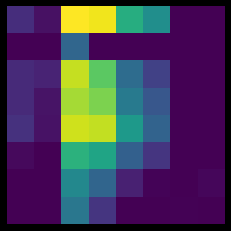

(16, 16)


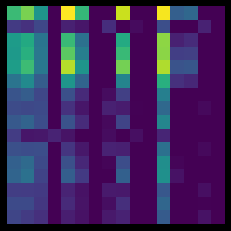

lstm feature map


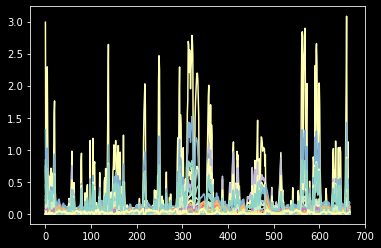

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1485
xtrain normalized : 
[[-0.3679648  -0.7270888   0.25172385 ... -0.4451297  -0.37248514
   0.84992712]
 [-0.4434715  -0.72753577  0.12573379 ... -0.44530118 -0.43177193
  -0.23078269]
 [-0.36727207  0.57951156  0.19134745 ... -0.43434923 -0.39447306
   0.72859182]
 ...
 [ 1.67975014 -0.45689364  0.84308767 ...  1.86283019  1.70999177
   0.05935637]
 [ 1.6565311  -0.59442167  0.56506729 ...  1.82961075  1.67385217
  -0.20832556]
 [ 1.6910765  -0.59762565  0.43192926 ...  1.80452029  1.6858987
  -0.18788615]]

x = reshaped : (1337, 36, 1)
x = reshaped : (148, 36, 1)
Epoch 68: early stopping
train iteration:0 - fold:1  ----->  0.825729250907898
valid iteration:0 - fold:1  ----->  0.7972972989082336
test iteration:0 - fold:1  ----->  0.7692307692307693
(8, 8)


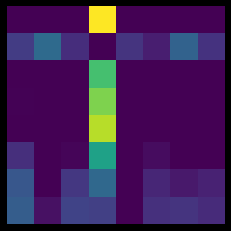

(16, 16)


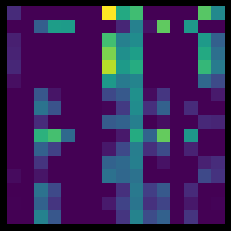

lstm feature map


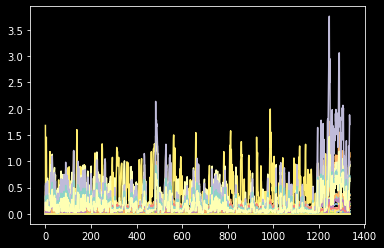

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2228
xtrain normalized : 
[[-0.56235764 -0.72635177 -0.00826633 ... -0.57523256 -0.56334581
   0.76186885]
 [-0.57879431 -0.72663314 -0.04302653 ... -0.57526979 -0.5762627
  -0.25122383]
 [-0.56220685  0.09616905 -0.02492396 ... -0.57289196 -0.56813635
   0.64812519]
 ...
 [ 1.97998604  0.0429795   0.1659435  ...  1.75983513  1.99298129
   0.65530078]
 [ 1.99478402  0.73614998  0.41819099 ...  1.76508724  2.03195198
   0.72101172]
 [ 1.95902223  0.37006013  0.47691546 ...  1.78370847  1.97206018
   0.48808794]]

x = reshaped : (2006, 36, 1)
x = reshaped : (222, 36, 1)
Epoch 28: early stopping
train iteration:0 - fold:2  ----->  0.8010967373847961
valid iteration:0 - fold:2  ----->  0.7612612843513489
test iteration:0 - fold:2  ----->  0.8028846153846154
(8, 8)


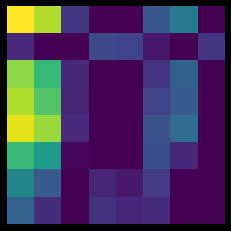

(16, 16)


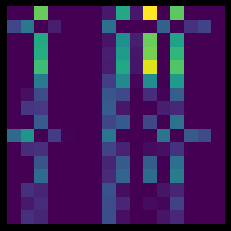

lstm feature map


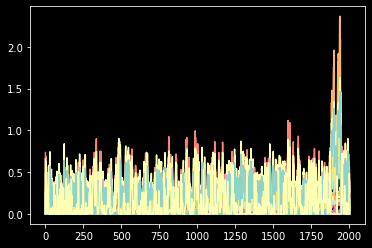

-----------


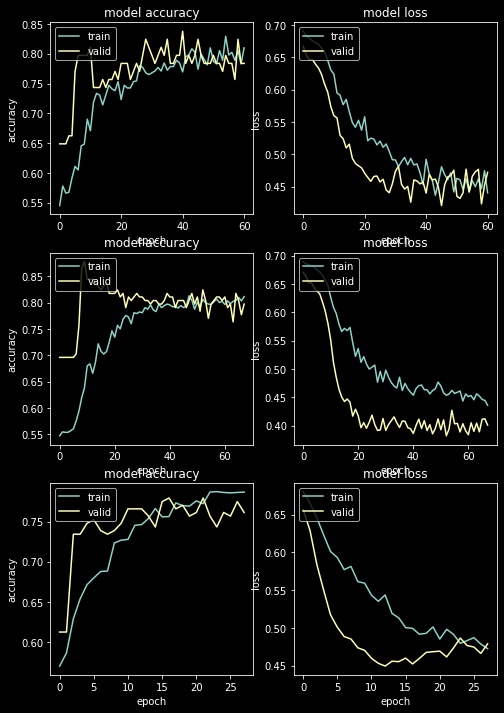






.................................................................
........................... step 1 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 742

x = reshaped : (668, 36, 1)
x = reshaped : (74, 36, 1)
Epoch 80: early stopping
train iteration:1 - fold:0  ----->  0.8443113565444946
valid iteration:1 - fold:0  ----->  0.7972972989082336
test iteration:1 - fold:0  ----->  0.7532051282051282
(8, 8)


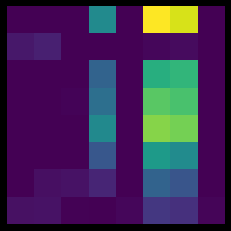

(16, 16)


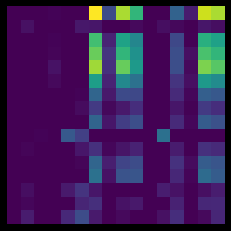

lstm feature map


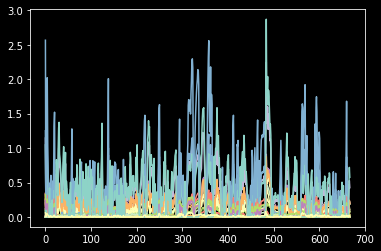

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1485

x = reshaped : (1337, 36, 1)
x = reshaped : (148, 36, 1)
Epoch 51: early stopping
train iteration:1 - fold:1  ----->  0.8145101070404053
valid iteration:1 - fold:1  ----->  0.7905405163764954
test iteration:1 - fold:1  ----->  0.7852564102564102
(8, 8)


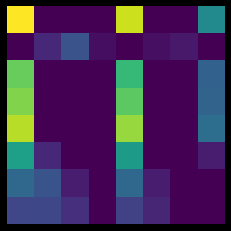

(16, 16)


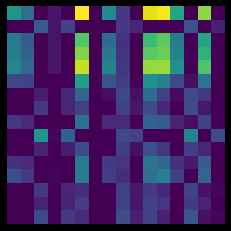

lstm feature map


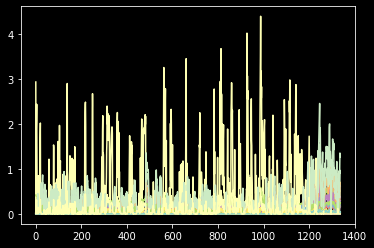

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2228

x = reshaped : (2006, 36, 1)
x = reshaped : (222, 36, 1)
Epoch 42: early stopping
train iteration:1 - fold:2  ----->  0.7996011972427368
valid iteration:1 - fold:2  ----->  0.7657657861709595
test iteration:1 - fold:2  ----->  0.8108974358974359
(8, 8)


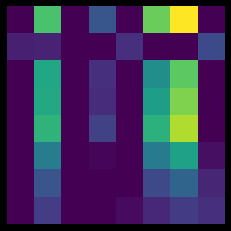

(16, 16)


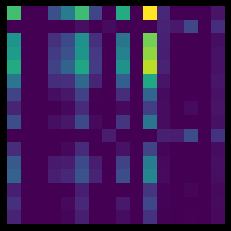

lstm feature map


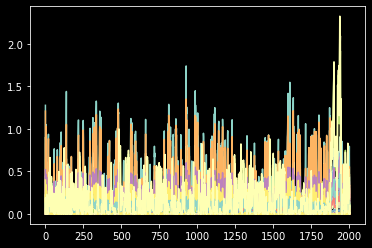

-----------


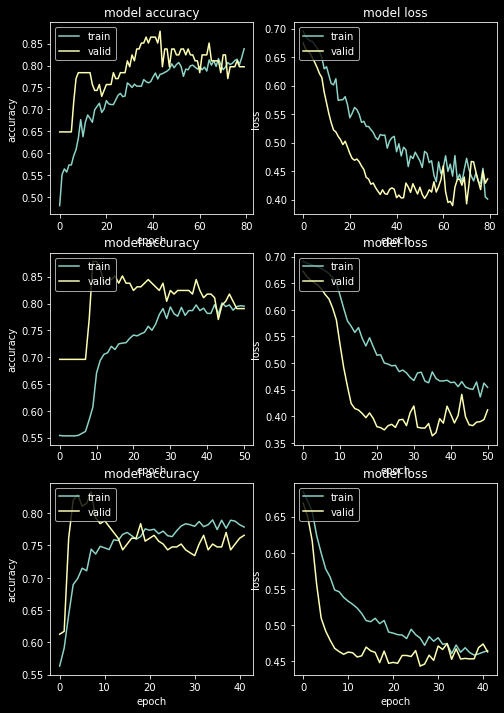






.................................................................
........................... step 2 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 742

x = reshaped : (668, 36, 1)
x = reshaped : (74, 36, 1)
Epoch 53: early stopping
train iteration:2 - fold:0  ----->  0.826347291469574
valid iteration:2 - fold:0  ----->  0.8243243098258972
test iteration:2 - fold:0  ----->  0.7291666666666666
(8, 8)


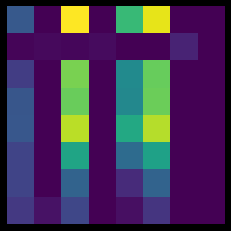

(16, 16)


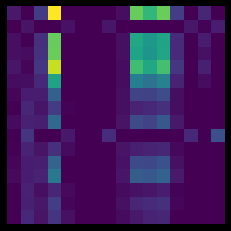

lstm feature map


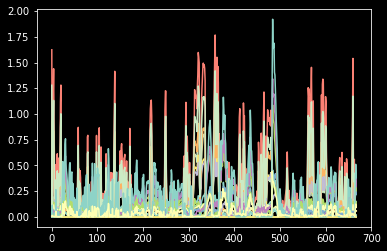

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1485

x = reshaped : (1337, 36, 1)
x = reshaped : (148, 36, 1)
Epoch 70: early stopping
train iteration:2 - fold:1  ----->  0.8354524970054626
valid iteration:2 - fold:1  ----->  0.8040540814399719
test iteration:2 - fold:1  ----->  0.7419871794871795
(8, 8)


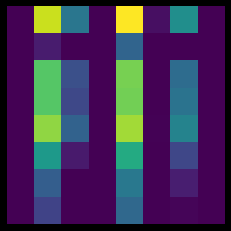

(16, 16)


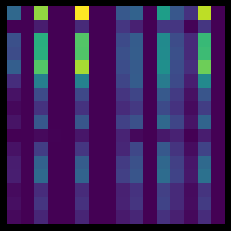

lstm feature map


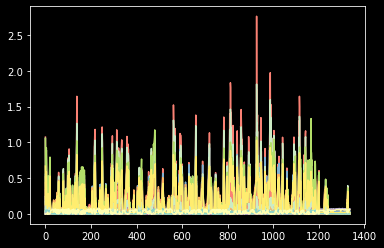

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2228

x = reshaped : (2006, 36, 1)
x = reshaped : (222, 36, 1)
Epoch 46: early stopping
train iteration:2 - fold:2  ----->  0.80408775806427
valid iteration:2 - fold:2  ----->  0.7522522807121277
test iteration:2 - fold:2  ----->  0.7948717948717948
(8, 8)


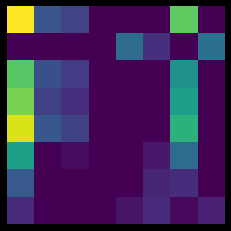

(16, 16)


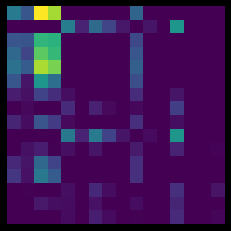

lstm feature map


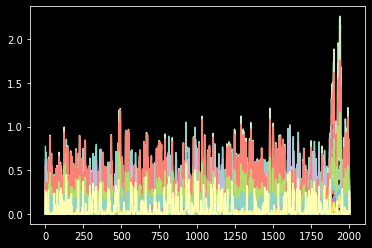

-----------


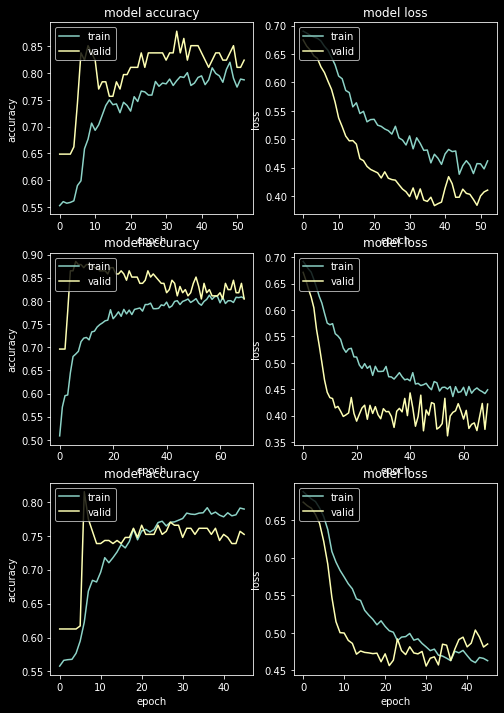






.................................................................
........................... step 3 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 742

x = reshaped : (668, 36, 1)
x = reshaped : (74, 36, 1)
Epoch 82: early stopping
train iteration:3 - fold:0  ----->  0.848802387714386
valid iteration:3 - fold:0  ----->  0.8243243098258972
test iteration:3 - fold:0  ----->  0.7243589743589743
(8, 8)


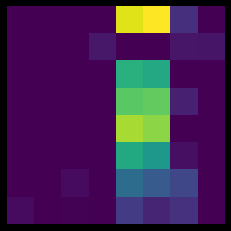

(16, 16)


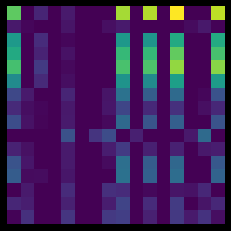

lstm feature map


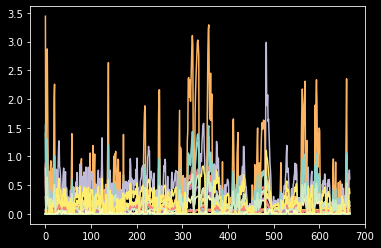

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1485

x = reshaped : (1337, 36, 1)
x = reshaped : (148, 36, 1)
Epoch 68: early stopping
train iteration:3 - fold:1  ----->  0.8287210464477539
valid iteration:3 - fold:1  ----->  0.7972972989082336
test iteration:3 - fold:1  ----->  0.7612179487179487
(8, 8)


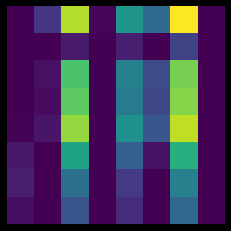

(16, 16)


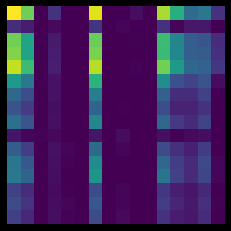

lstm feature map


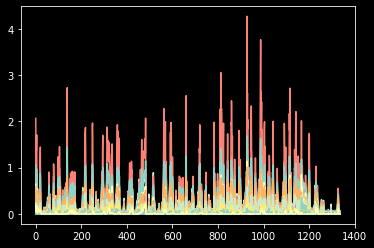

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2228

x = reshaped : (2006, 36, 1)
x = reshaped : (222, 36, 1)
Epoch 38: early stopping
train iteration:3 - fold:2  ----->  0.8005982041358948
valid iteration:3 - fold:2  ----->  0.7432432174682617
test iteration:3 - fold:2  ----->  0.7932692307692307
(8, 8)


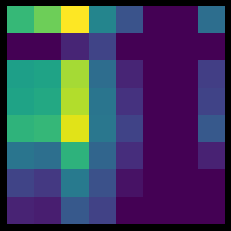

(16, 16)


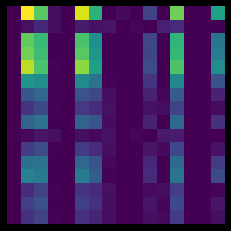

lstm feature map


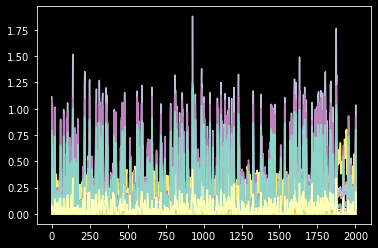

-----------


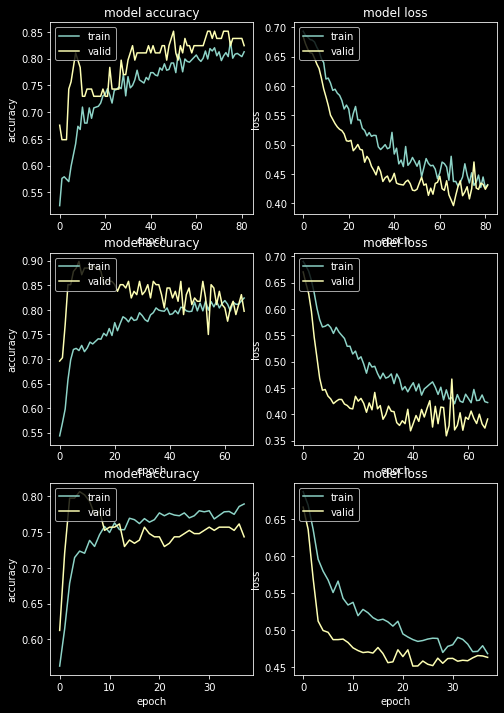






.................................................................
........................... step 4 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 742

x = reshaped : (668, 36, 1)
x = reshaped : (74, 36, 1)
Epoch 93: early stopping
train iteration:4 - fold:0  ----->  0.847305417060852
valid iteration:4 - fold:0  ----->  0.7432432174682617
test iteration:4 - fold:0  ----->  0.7628205128205128
(8, 8)


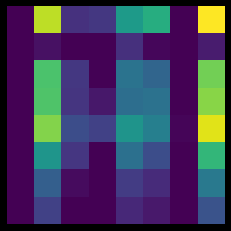

(16, 16)


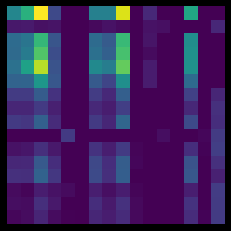

lstm feature map


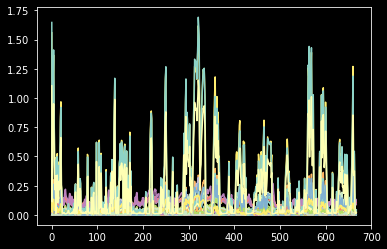

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1485

x = reshaped : (1337, 36, 1)
x = reshaped : (148, 36, 1)
Epoch 96: early stopping
train iteration:4 - fold:1  ----->  0.8317127823829651
valid iteration:4 - fold:1  ----->  0.8310810923576355
test iteration:4 - fold:1  ----->  0.7307692307692307
(8, 8)


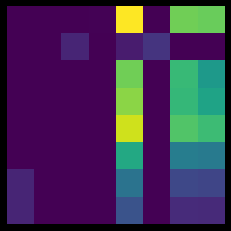

(16, 16)


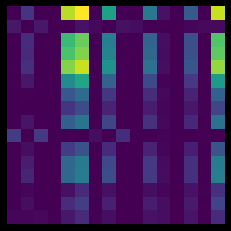

lstm feature map


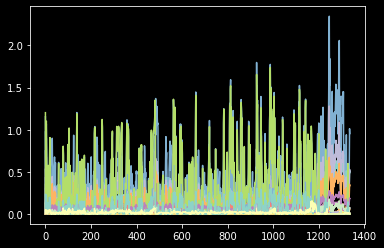

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2228

x = reshaped : (2006, 36, 1)
x = reshaped : (222, 36, 1)
Epoch 33: early stopping
train iteration:4 - fold:2  ----->  0.7986041903495789
valid iteration:4 - fold:2  ----->  0.7522522807121277
test iteration:4 - fold:2  ----->  0.7948717948717948
(8, 8)


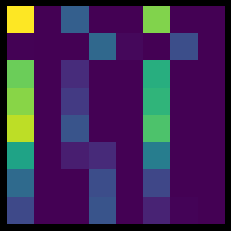

(16, 16)


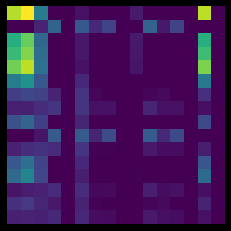

lstm feature map


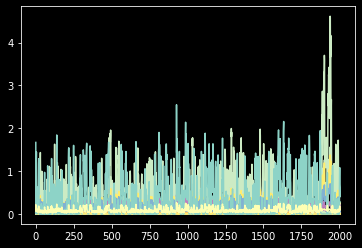

-----------


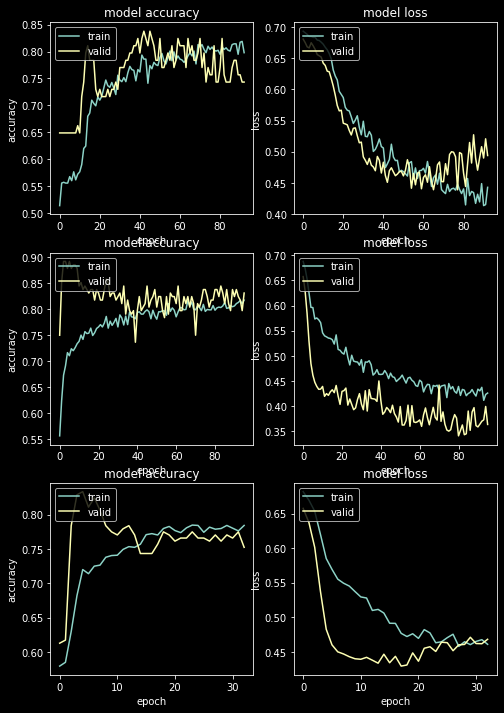






.................................................................
........................... step 5 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 742

x = reshaped : (668, 36, 1)
x = reshaped : (74, 36, 1)
Epoch 69: early stopping
train iteration:5 - fold:0  ----->  0.8278443217277527
valid iteration:5 - fold:0  ----->  0.7972972989082336
test iteration:5 - fold:0  ----->  0.75
(8, 8)


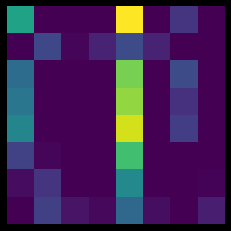

(16, 16)


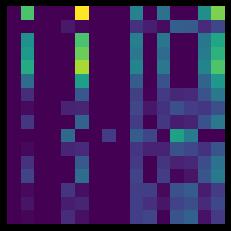

lstm feature map


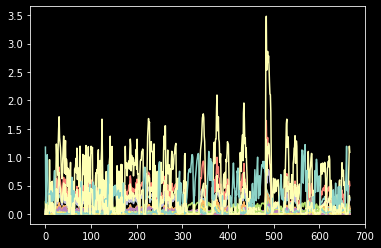

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1485

x = reshaped : (1337, 36, 1)
x = reshaped : (148, 36, 1)
Epoch 40: early stopping
train iteration:5 - fold:1  ----->  0.8100224137306213
valid iteration:5 - fold:1  ----->  0.7905405163764954
test iteration:5 - fold:1  ----->  0.7580128205128205
(8, 8)


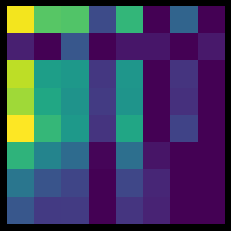

(16, 16)


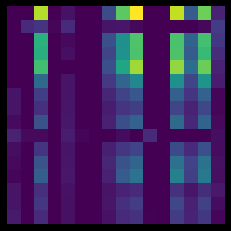

lstm feature map


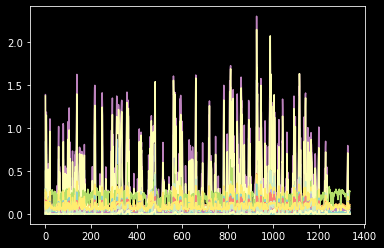

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2228

x = reshaped : (2006, 36, 1)
x = reshaped : (222, 36, 1)
Epoch 28: early stopping
train iteration:5 - fold:2  ----->  0.7846460342407227
valid iteration:5 - fold:2  ----->  0.7522522807121277
test iteration:5 - fold:2  ----->  0.7996794871794872
(8, 8)


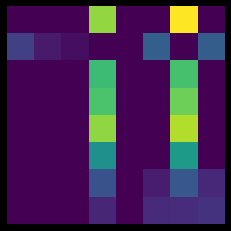

(16, 16)


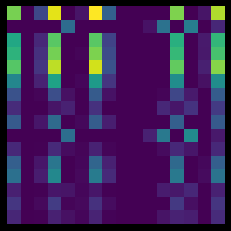

lstm feature map


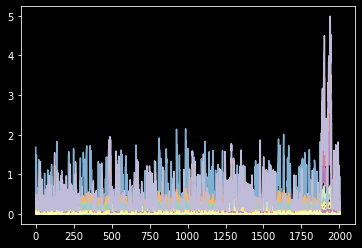

-----------


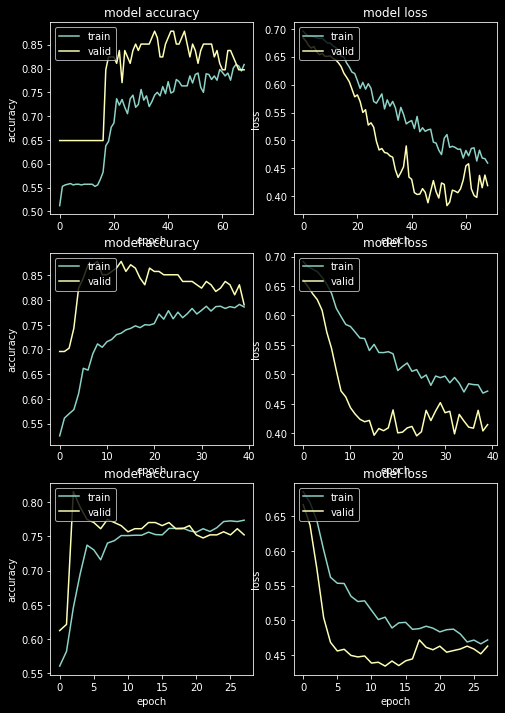





columns in order left to right : train , validation , test accuracies
rows : steps


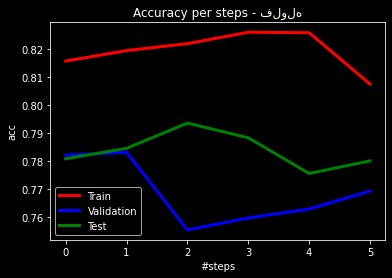

---------- Report ---------- 

mean train accueacies over 6 model training ------ >> 0.8194306823942396
mean validation accuracies over 6 model training ------ >> 0.7686965811965812
mean test accuracies over 6 model training ------ >> 0.7837837868266635


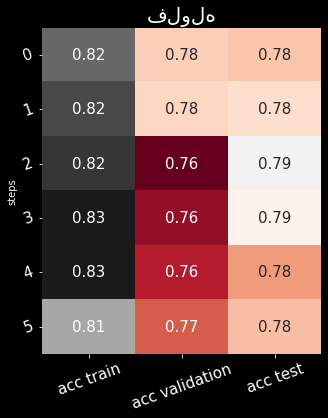

selected model : 0


In [ ]:
predictionsfeloole,TestYfeloole = Training(file_paths[5] , counts=6 , k=3)
feloole = Build_Labels_DF(file_paths[5] , date_path ,predictionsfeloole)


---------------------------------------------------------------سفارس------------------------------------------------------------
-1    1418
 1    1070
Name: Label, dtype: int64
(2488, 37)
shape x : (2488, 36)
shape y : (2488,)
697
(697, 36, 1)

.................................................................
........................... step 0 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 828
xtrain normalized : 
[[-0.88981858 -0.15354082  0.13836695 ... -0.91200721 -0.8894125
   0.44190051]
 [-0.89560723 -0.10665189  0.12212618 ... -0.91002065 -0.89538038
   0.24241791]
 [-0.90197474 -0.30880562  0.09096133 ... -0.90848239 -0.9005782
   0.06853788]
 ...
 [ 0.62878685 -0.45881774 -0.10249856 ...  0.52892573  0.62391094
   0.01099425]
 [ 0.62420504 -0.46775301 -0.11212305 ...  0.531512    0.62269193
  -0.04110719]
 [ 0.62970322 -0.49444664 

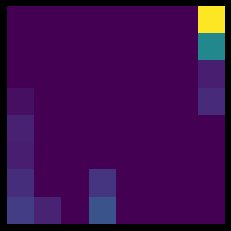

(16, 16)


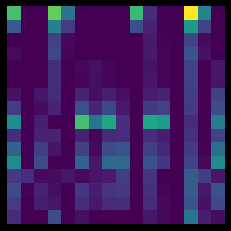

lstm feature map


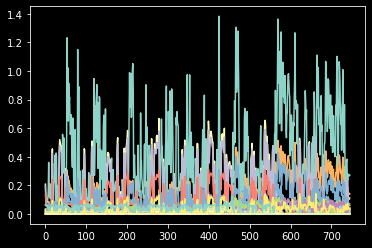

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1657
xtrain normalized : 
[[-1.34147487 -0.03011937  0.27556558 ... -1.36315086 -1.34120876
   0.60225841]
 [-1.34927968  0.0302139   0.2568188  ... -1.36047339 -1.34925349
   0.38173373]
 [-1.35786496 -0.22990288  0.22084511 ... -1.35840011 -1.35626019
   0.18951227]
 ...
 [-0.18360712 -0.43326999 -0.00182911 ... -0.26033192 -0.19696929
  -0.10024561]
 [-0.26960013  0.58879296 -0.17713319 ... -0.25197517 -0.25850518
  -0.74132408]
 [-0.23221187 -0.44779303 -0.22568924 ... -0.2510226  -0.25104628
  -0.42804383]]

x = reshaped : (1492, 36, 1)
x = reshaped : (165, 36, 1)
Epoch 55: early stopping
train iteration:0 - fold:1  ----->  0.7788203954696655
valid iteration:0 - fold:1  ----->  0.6848484873771667
test iteration:0 - fold:1  ----->  0.6872309899569584
(8, 8)


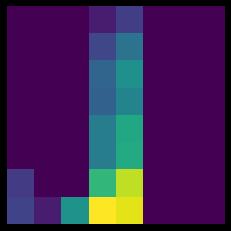

(16, 16)


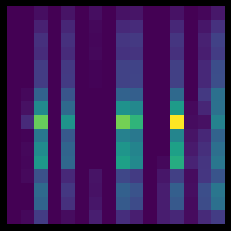

lstm feature map


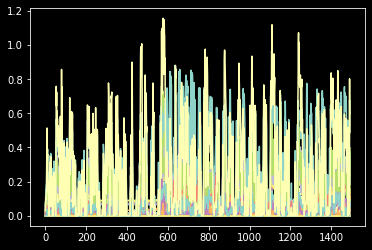

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2486
xtrain normalized : 
[[-0.49587518 -0.32335268 -0.07139174 ... -0.49179811 -0.49562253
   0.35621468]
 [-0.4964949  -0.30697028 -0.07324906 ... -0.49159162 -0.49626153
   0.18663804]
 [-0.49717658 -0.37760022 -0.07681311 ... -0.49143173 -0.49681807
   0.03882569]
 ...
 [ 2.62760065  0.06649416 -0.18219226 ...  2.50727059  2.63561871
  -0.64532367]
 [ 2.62760065 -0.16197119 -0.32417307 ...  2.51201611  2.64259473
  -0.62639575]
 [ 2.75868255 -0.061135   -0.13322069 ...  2.51407325  2.71468032
  -0.10784583]]

x = reshaped : (2238, 36, 1)
x = reshaped : (248, 36, 1)
Epoch 27: early stopping
train iteration:0 - fold:2  ----->  0.7725647687911987
valid iteration:0 - fold:2  ----->  0.6854838728904724
test iteration:0 - fold:2  ----->  0.7144906743185079
(8, 8)


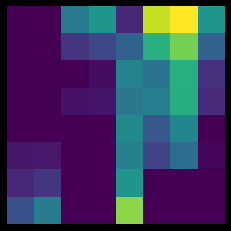

(16, 16)


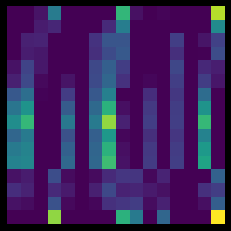

lstm feature map


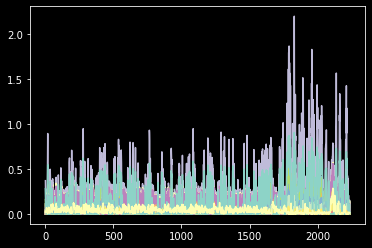

-----------


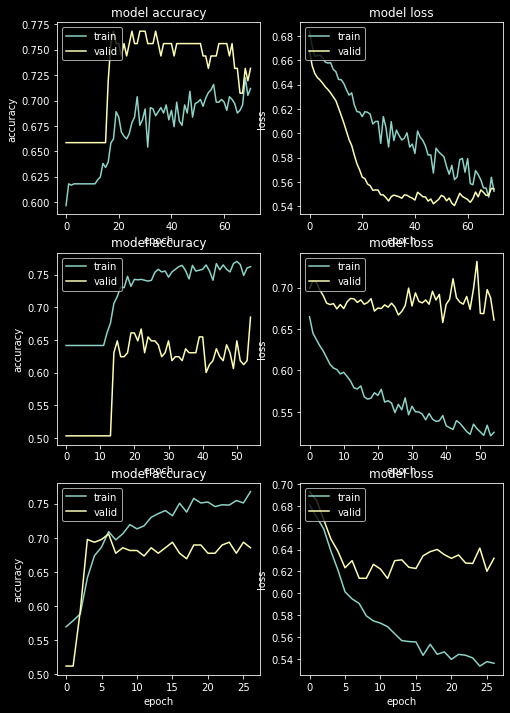






.................................................................
........................... step 1 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 828

x = reshaped : (746, 36, 1)
x = reshaped : (82, 36, 1)
Epoch 83: early stopping
train iteration:1 - fold:0  ----->  0.7680965065956116
valid iteration:1 - fold:0  ----->  0.7560975551605225
test iteration:1 - fold:0  ----->  0.6958393113342898
(8, 8)


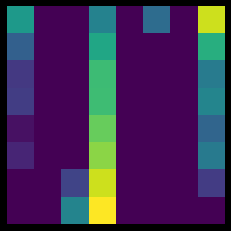

(16, 16)


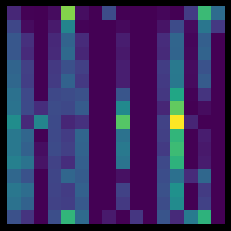

lstm feature map


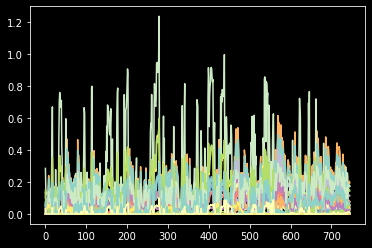

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1657

x = reshaped : (1492, 36, 1)
x = reshaped : (165, 36, 1)
Epoch 50: early stopping
train iteration:1 - fold:1  ----->  0.7593833804130554
valid iteration:1 - fold:1  ----->  0.7212121486663818
test iteration:1 - fold:1  ----->  0.7015781922525107
(8, 8)


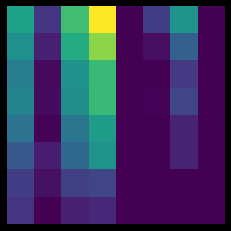

(16, 16)


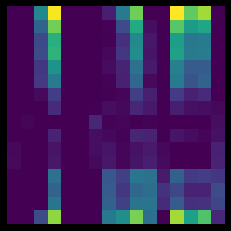

lstm feature map


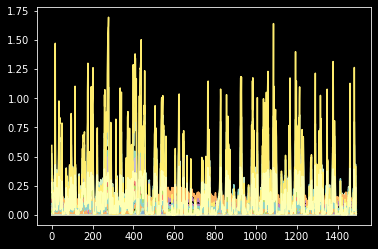

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2486

x = reshaped : (2238, 36, 1)
x = reshaped : (248, 36, 1)
Epoch 84: early stopping
train iteration:1 - fold:2  ----->  0.7815013527870178
valid iteration:1 - fold:2  ----->  0.6612903475761414
test iteration:1 - fold:2  ----->  0.6456241032998565
(8, 8)


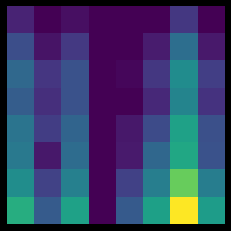

(16, 16)


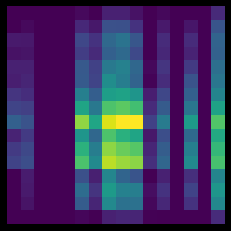

lstm feature map


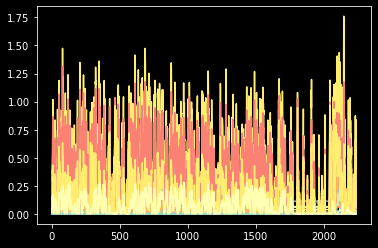

-----------


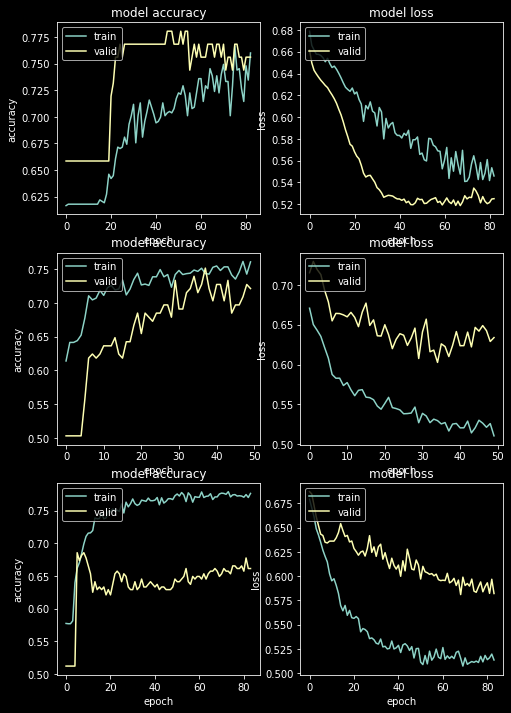






.................................................................
........................... step 2 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 828

x = reshaped : (746, 36, 1)
x = reshaped : (82, 36, 1)
Epoch 70: early stopping
train iteration:2 - fold:0  ----->  0.7292225360870361
valid iteration:2 - fold:0  ----->  0.7682926654815674
test iteration:2 - fold:0  ----->  0.6513629842180775
(8, 8)


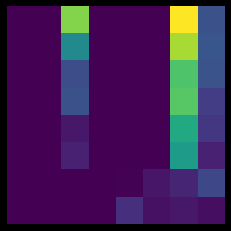

(16, 16)


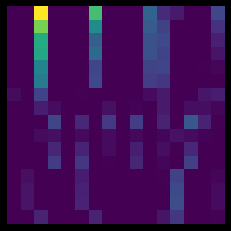

lstm feature map


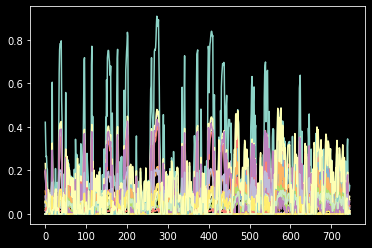

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1657

x = reshaped : (1492, 36, 1)
x = reshaped : (165, 36, 1)
Epoch 45: early stopping
train iteration:2 - fold:1  ----->  0.7613940834999084
valid iteration:2 - fold:1  ----->  0.6969696879386902
test iteration:2 - fold:1  ----->  0.6800573888091822
(8, 8)


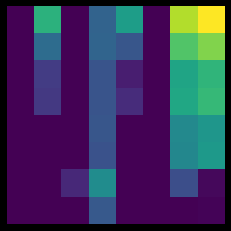

(16, 16)


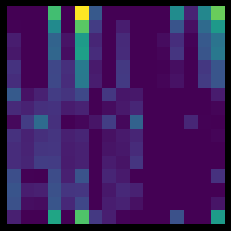

lstm feature map


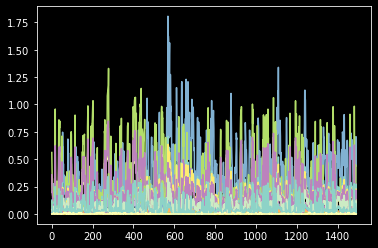

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2486

x = reshaped : (2238, 36, 1)
x = reshaped : (248, 36, 1)
Epoch 23: early stopping
train iteration:2 - fold:2  ----->  0.7747989296913147
valid iteration:2 - fold:2  ----->  0.6572580933570862
test iteration:2 - fold:2  ----->  0.6843615494978479
(8, 8)


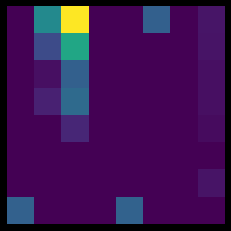

(16, 16)


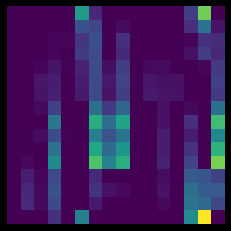

lstm feature map


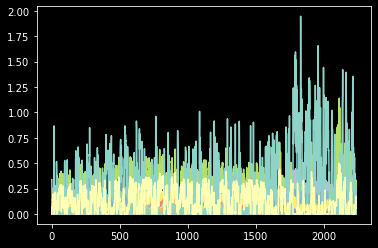

-----------


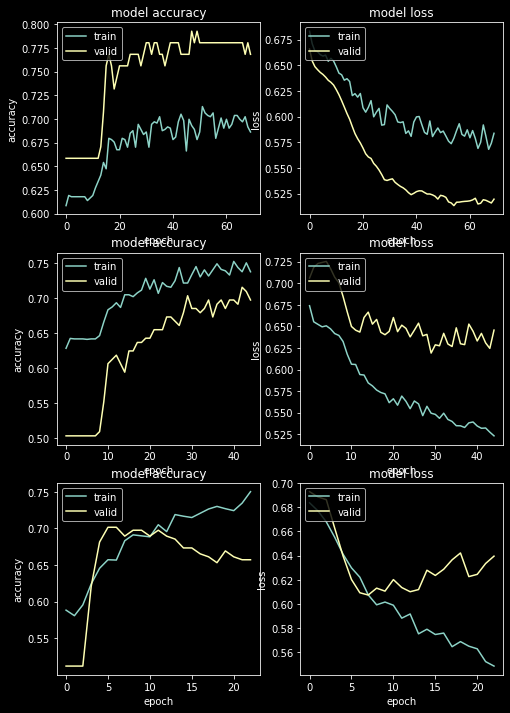






.................................................................
........................... step 3 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 828

x = reshaped : (746, 36, 1)
x = reshaped : (82, 36, 1)
Epoch 72: early stopping
train iteration:3 - fold:0  ----->  0.7506702542304993
valid iteration:3 - fold:0  ----->  0.7682926654815674
test iteration:3 - fold:0  ----->  0.6700143472022956
(8, 8)


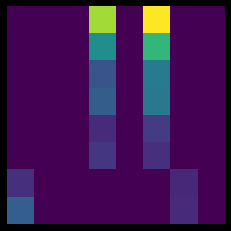

(16, 16)


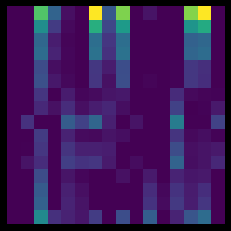

lstm feature map


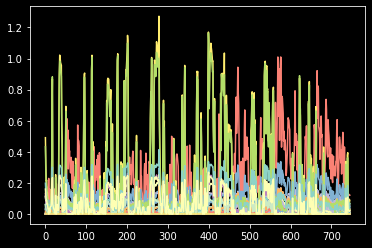

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1657

x = reshaped : (1492, 36, 1)
x = reshaped : (165, 36, 1)
Epoch 46: early stopping
train iteration:3 - fold:1  ----->  0.7808310985565186
valid iteration:3 - fold:1  ----->  0.6363636255264282
test iteration:3 - fold:1  ----->  0.6556671449067432
(8, 8)


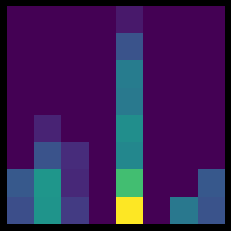

(16, 16)


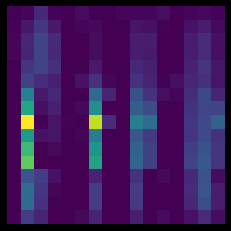

lstm feature map


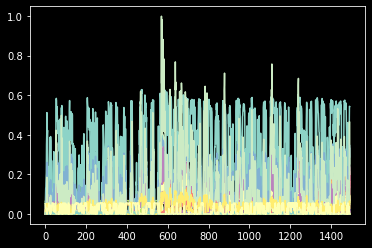

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2486

x = reshaped : (2238, 36, 1)
x = reshaped : (248, 36, 1)
train iteration:3 - fold:2  ----->  0.7855227589607239
valid iteration:3 - fold:2  ----->  0.7016128897666931
test iteration:3 - fold:2  ----->  0.672883787661406
(8, 8)


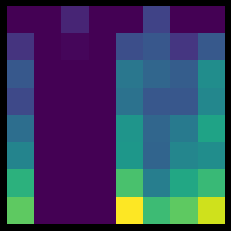

(16, 16)


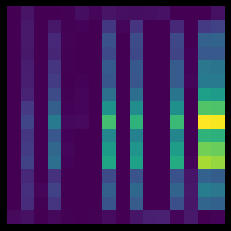

lstm feature map


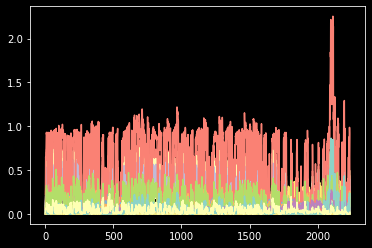

-----------


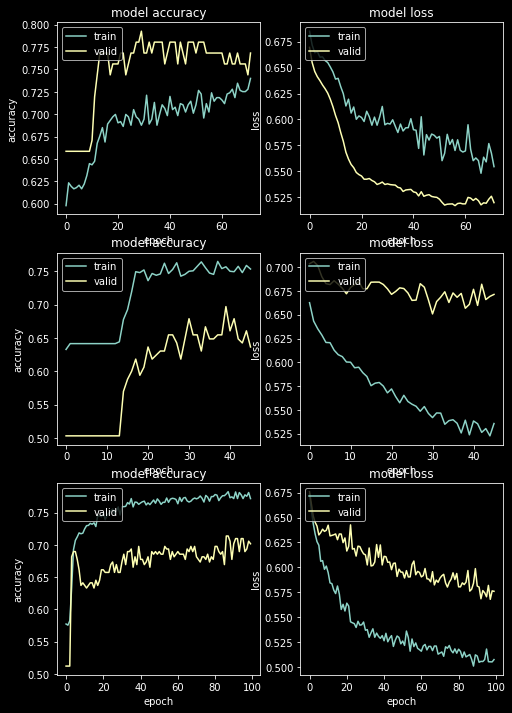






.................................................................
........................... step 4 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 828

x = reshaped : (746, 36, 1)
x = reshaped : (82, 36, 1)
Epoch 61: early stopping
train iteration:4 - fold:0  ----->  0.7439678311347961
valid iteration:4 - fold:0  ----->  0.7682926654815674
test iteration:4 - fold:0  ----->  0.667144906743185
(8, 8)


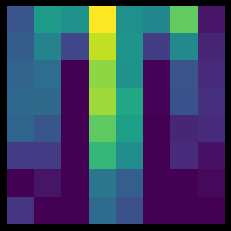

(16, 16)


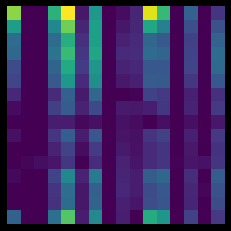

lstm feature map


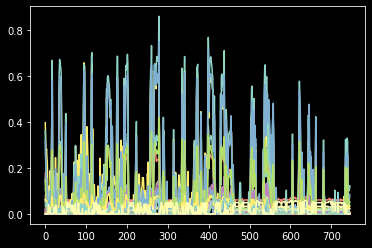

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1657

x = reshaped : (1492, 36, 1)
x = reshaped : (165, 36, 1)
Epoch 63: early stopping
train iteration:4 - fold:1  ----->  0.7707774639129639
valid iteration:4 - fold:1  ----->  0.7030302882194519
test iteration:4 - fold:1  ----->  0.6657101865136298
(8, 8)


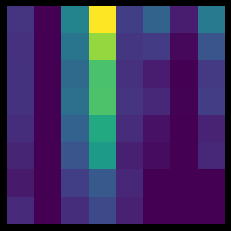

(16, 16)


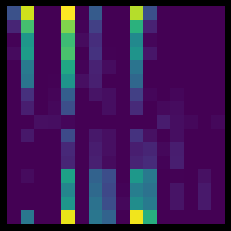

lstm feature map


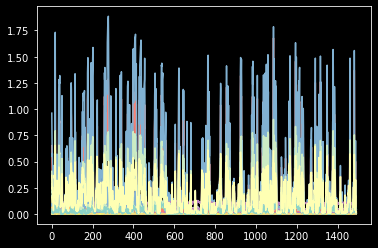

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2486

x = reshaped : (2238, 36, 1)
x = reshaped : (248, 36, 1)
Epoch 20: early stopping
train iteration:4 - fold:2  ----->  0.7640750408172607
valid iteration:4 - fold:2  ----->  0.6774193644523621
test iteration:4 - fold:2  ----->  0.6958393113342898
(8, 8)


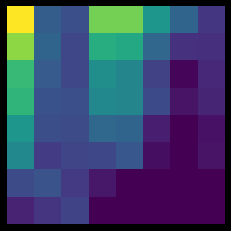

(16, 16)


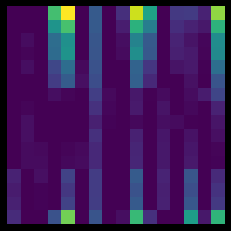

lstm feature map


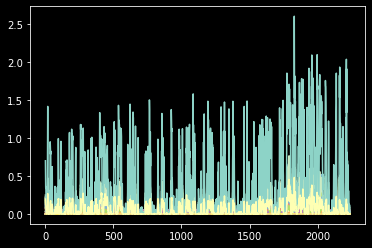

-----------


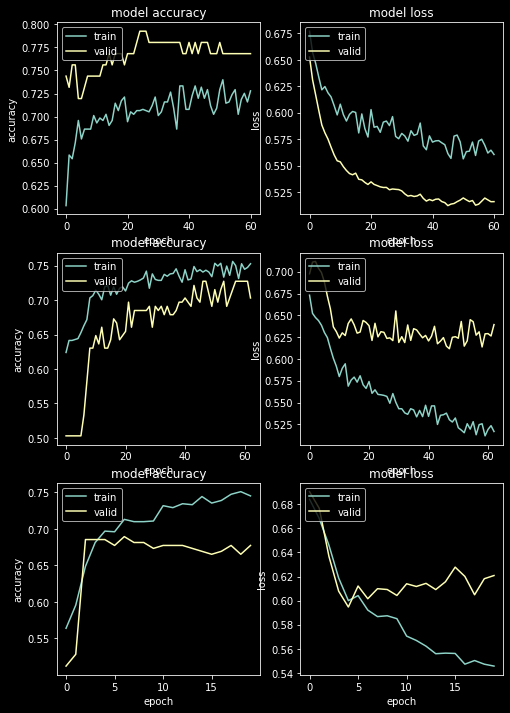






.................................................................
........................... step 5 starting ...........................
.................................................................



.................. fold 0 starting ..................

fold data indices: start: 0 end: 828

x = reshaped : (746, 36, 1)
x = reshaped : (82, 36, 1)
Epoch 71: early stopping
train iteration:5 - fold:0  ----->  0.747989296913147
valid iteration:5 - fold:0  ----->  0.7682926654815674
test iteration:5 - fold:0  ----->  0.6599713055954088
(8, 8)


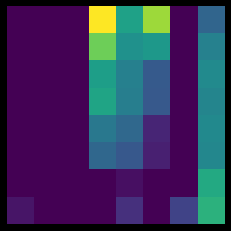

(16, 16)


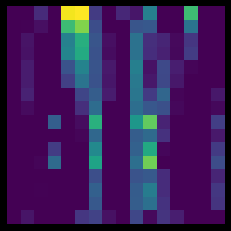

lstm feature map


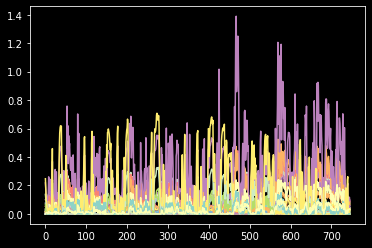

-----------

.................. fold 1 starting ..................

fold data indices: start: 0 end: 1657

x = reshaped : (1492, 36, 1)
x = reshaped : (165, 36, 1)
Epoch 37: early stopping
train iteration:5 - fold:1  ----->  0.7600536346435547
valid iteration:5 - fold:1  ----->  0.7212121486663818
test iteration:5 - fold:1  ----->  0.667144906743185
(8, 8)


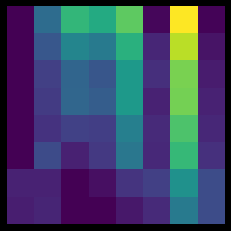

(16, 16)


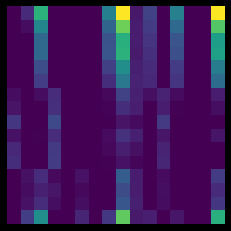

lstm feature map


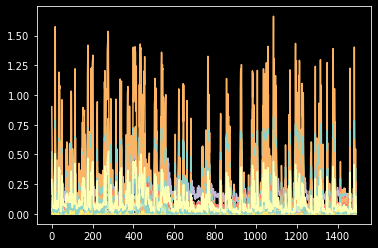

-----------

.................. fold 2 starting ..................

fold data indices: start: 0 end: 2486

x = reshaped : (2238, 36, 1)
x = reshaped : (248, 36, 1)
Epoch 25: early stopping
train iteration:5 - fold:2  ----->  0.771224319934845
valid iteration:5 - fold:2  ----->  0.6733871102333069
test iteration:5 - fold:2  ----->  0.6872309899569584
(8, 8)


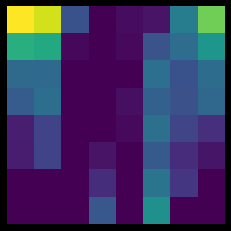

(16, 16)


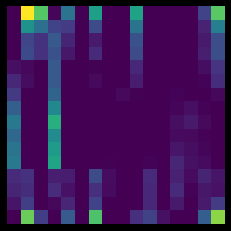

lstm feature map


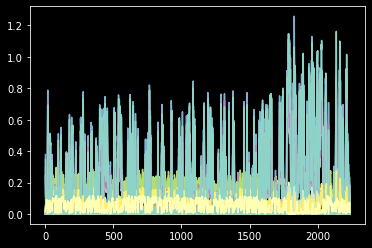

-----------


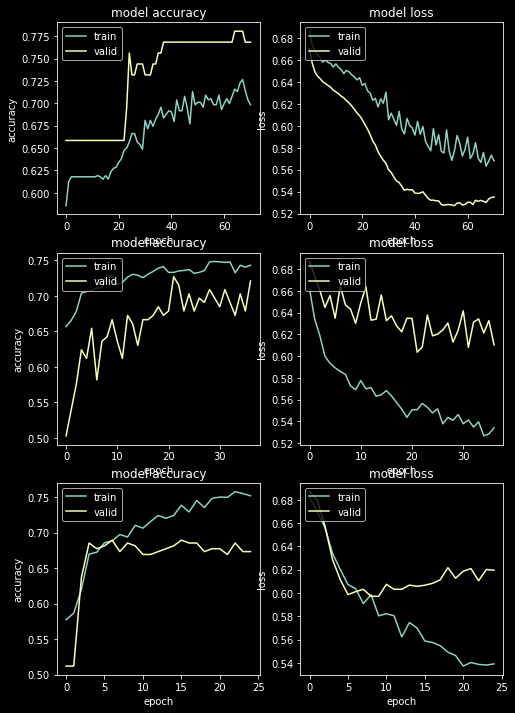





columns in order left to right : train , validation , test accuracies
rows : steps


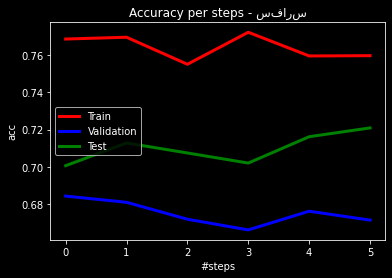

---------- Report ---------- 

mean train accueacies over 6 model training ------ >> 0.7641991840468513
mean validation accuracies over 6 model training ------ >> 0.6751952813645783
mean test accuracies over 6 model training ------ >> 0.7100590897930993


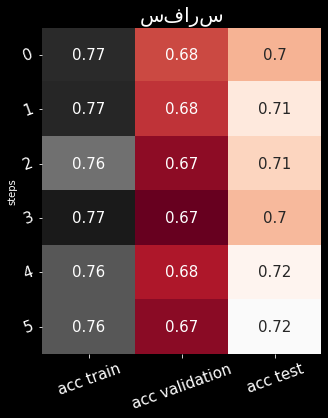

selected model : 2


In [ ]:
predictionssefars,TestYsefars  = Training(file_paths[1] , counts=6 , k=3)
sefars = Build_Labels_DF(file_paths[1] , date_path ,predictionssefars)

In [ ]:
PredictionList = [predictionsshebhern, predictionskachad , predictionsfammeli , predictionsvebemellat , predictionsparsian, predictionskhodro , predictionskerooy , predictionskhesapa , predictionsfeloole , predictionssefars]


finallist = [shebhern, kachad , fammeli , vebemellat , parsian, khodro , kerooy , khesapa , feloole , sefars]
mainLabelList =  [TestYshebhern, TestYkachad , TestYfammeli , TestYvebemellat , TestYparsian, TestYkhodro , TestYkerooy , TestYkhesapa , TestYfeloole , TestYsefars]

In [ ]:
Final_df = pd.DataFrame({})
Final_df = pd.concat( finallist , axis=1)
Final_df.columns = ["shebhrn", "kachad" , "fammeli" , "vebemellat" , "parsian", "khodro" , "kerooy" , "khesapa" , "feloole" , "sefars"]
Final_df

,shebhrn,kachad,fammeli,vebemellat,parsian,khodro,kerooy,khesapa,feloole,sefars
Date,,,,,,,,,,
2019-03-25,1,1,-1,1,-1,1,1,1,1,1
2019-03-26,1,1,-1,1,-1,1,1,1,1,1
2019-03-27,1,1,1,1,-1,1,1,1,1,1
2019-03-30,1,1,1,1,-1,1,1,1,1,1
2019-03-31,1,1,1,1,-1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...
2022-03-13,1,1,-1,-1,1,-1,1,0,1,-1
2022-03-14,1,-1,-1,-1,1,-1,-1,0,1,-1
2022-03-15,1,-1,-1,-1,1,1,-1,0,1,1


In [ ]:
Final_df.to_csv('/content/dataframe_.csv')

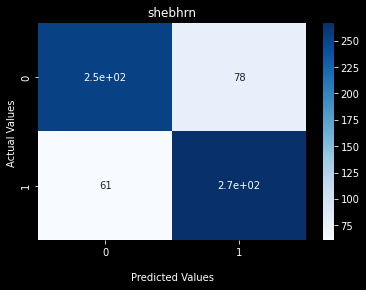

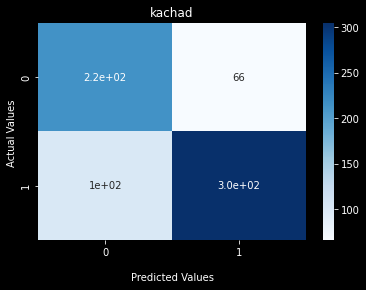

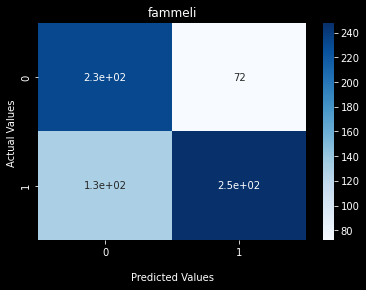

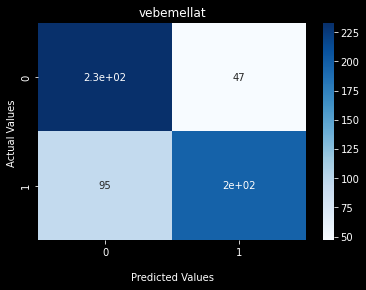

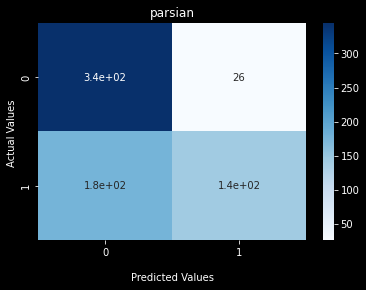

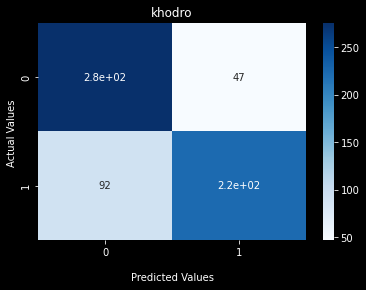

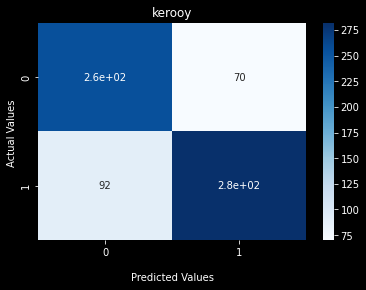

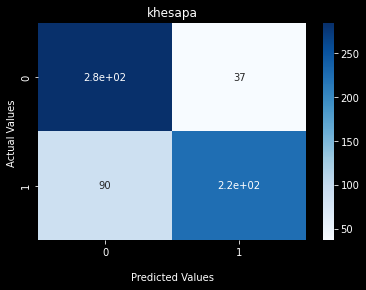

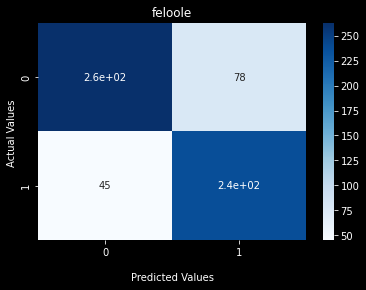

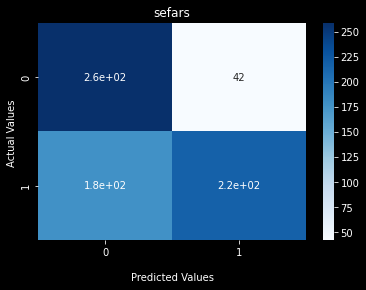

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

for (i,pred,test) in zip(range(len(Final_df.columns)),PredictionList,mainLabelList):
  conf_matrix = confusion_matrix(y_true=test , y_pred=pred)
  sns.heatmap(conf_matrix, annot=True, cmap='Blues')
  plt.title(Final_df.columns[i])
  plt.xlabel('\nPredicted Values')
  plt.ylabel('Actual Values ')
  plt.show()
  print('\n\n\n')